# AutoFL Sequence Pattern Analysis - N-grams

Analyze N-gram subsequences in messages from AutoFL trajectory data

In [1]:
import json
import os
import random
from collections import Counter
from pathlib import Path
from typing import List, Tuple
import pandas as pd

from scipy.stats import pointbiserialr

In [2]:
def extract_function_call_sequence(messages: List[dict]) -> List[str]:
    """
    Extract the sequence of roles from messages.

    Args:
        messages: List of message dictionaries

    Returns:
        List of role strings in order
    """
    sequence = []
    for msg in messages:
        if 'function_call' in msg:
            sequence.append(msg['function_call']['name'])
    return sequence


def get_ngrams(sequence: List[str], n: int) -> List[Tuple[str, str, str, str]]:
    """
    Extract all n-grams from a sequence.

    Args:
        sequence: List of items

    Returns:
        List of n-gram tuples
    """
    ngrams = []
    for i in range(len(sequence) - (n-1)):
        ngram = tuple(sequence[i:i+n])
        ngrams.append(ngram)
    return ngrams

def get_result_of_execution(buggy_methods):
    if isinstance(buggy_methods, str):
        is_found = False
    else:
        is_found = False
        for method, found_result in buggy_methods.items():
            if found_result["is_found"]:
                is_found = True
    
    return is_found


def get_ngrams_for_blanced_executions_in_directory(directory_path: Path, n: int) -> List[Tuple[str, str, str, str]]:
    """
    Process all JSON files in a directory and extract n-grams.

    Args:
        directory_path: Path to directory containing JSON files

    Returns:
        List of all n-grams found
    """
    all_ngrams = []
    success_ngrams = []
    fail_ngrams = []

    success_bug_names = []
    fail_bug_names = []

    for json_file in os.listdir(directory_path):
        bug_name = "-".join(json_file.split('-')[1:]).split('.')[0]
        with open(os.path.join(directory_path, json_file), 'r', encoding='utf-8') as f:
            data = json.load(f)
        execution_success = get_result_of_execution(data["buggy_methods"])
        if execution_success:
            success_bug_names.append(bug_name)
        else:
            fail_bug_names.append(bug_name)
    
    if len(success_bug_names) > len(fail_bug_names):
        raise Exception("The number of succeed bugs > failed bugs")
    
    random.seed(42)
    sampled_fail_bug_names = random.sample(fail_bug_names, len(success_bug_names))

    for bug_name in sampled_fail_bug_names:
        json_file = os.path.join(directory_path, f'XFL-{bug_name}.json')
        with open(json_file, 'r') as f:
            data = json.load(f)
        if 'messages' in data:
            sequence = extract_function_call_sequence(data['messages'])
            ngrams = get_ngrams(sequence, n)
            all_ngrams.extend(ngrams)
            fail_ngrams.extend(ngrams)
    
    for bug_name in success_bug_names:
        json_file = os.path.join(directory_path, f'XFL-{bug_name}.json')
        with open(json_file, 'r') as f:
            data = json.load(f)
        if 'messages' in data:
            sequence = extract_function_call_sequence(data['messages'])
            ngrams = get_ngrams(sequence, n)
            all_ngrams.extend(ngrams)
            success_ngrams.extend(ngrams)

    return all_ngrams, success_ngrams, fail_ngrams

In [3]:
def get_ngrams_for_executions(benchmark, model, n):
    # Process all directories
    base_path = Path("raw_data/autofl")

    all_ngrams = []
    all_success_ngrams = []
    all_fail_ngrams = []

    for i in range(1, 11):
        if benchmark == 'bip':
            dir_name = f"bip_cosmosfl_{i}"
        elif benchmark == 'd4j':
            dir_name = f"d4j_autofl_eol_{i}"
            
        model_path = base_path / dir_name / model

        if model_path.exists():
            # print(f"Processing {dir_name}...")
            ngrams, success_ngrams, fail_ngrams = get_ngrams_for_blanced_executions_in_directory(model_path, n)
            all_ngrams.extend(ngrams)
            all_success_ngrams.extend(success_ngrams)
            all_fail_ngrams.extend(fail_ngrams)
            # print(f"  Found {len(four_grams)} {n}-grams")
        else:
            print(f"Warning: {model_path} does not exist")

    print(f"\nTotal {n}-grams collected: {len(all_ngrams)}")
    print(f"\nTotal {n}-grams from successful executions: {len(all_success_ngrams)}")
    print(f"\nTotal {n}-grams from failed executions: {len(all_fail_ngrams)}")

    return all_ngrams, all_success_ngrams, all_fail_ngrams

### 5-gram

In [16]:
# Get n-gram: frequencies for all benchmarks and models
n = 5
benchmarks = ['d4j', 'bip']
models = ['llama3', 'llama3.1', 'mistral-nemo', 'qwen2.5-coder']

for bm in benchmarks:
    for model in models:
        all_ngrams, all_success_ngrams, all_fail_ngrams = get_ngrams_for_executions(bm, model, n)

        all_counter = Counter(all_ngrams)
        success_counter = Counter(all_success_ngrams)
        fail_counter = Counter(all_fail_ngrams)

        all_results = []
        success_results = []
        fail_results = []
        for ngram, count in all_counter.most_common():
            all_results.append({
                f'{n}gram': ngram,
                'frequency': count
            })
        for ngram, count in success_counter.most_common():
            success_results.append({
                f'{n}gram': ngram,
                'frequency': count
            })
        for ngram, count in fail_counter.most_common():
            fail_results.append({
                f'{n}gram': ngram,
                'frequency': count
            })
            
        
        all_df = pd.DataFrame(all_results)
        success_df = pd.DataFrame(success_results)
        fail_df = pd.DataFrame(fail_results)

        output_dir = f"./{n}gram_frequency/autofl/all_executions"
        os.makedirs(output_dir, exist_ok=True)
        output_file = os.path.join(output_dir, f"{bm}_{model}_{n}gram_frequencies.csv")
        all_df.to_csv(output_file, index=False)
        print(f"Saved {output_file} with {len(all_df)} unique {n}-gram")

        output_dir = f"./{n}gram_frequency/autofl/success_executions"
        os.makedirs(output_dir, exist_ok=True)
        output_file = os.path.join(output_dir, f"{bm}_{model}_{n}gram_frequencies.csv")
        success_df.to_csv(output_file, index=False)
        print(f"Saved {output_file} with {len(success_df)} unique {n}-gram")

        output_dir = f"./{n}gram_frequency/autofl/fail_executions"
        os.makedirs(output_dir, exist_ok=True)
        output_file = os.path.join(output_dir, f"{bm}_{model}_{n}gram_frequencies.csv")
        fail_df.to_csv(output_file, index=False)
        print(f"Saved {output_file} with {len(fail_df)} unique {n}-gram")





Total 5-grams collected: 879

Total 5-grams from successful executions: 518

Total 5-grams from failed executions: 361
Saved ./5gram_frequency/autofl/all_executions/d4j_llama3_5gram_frequencies.csv with 240 unique 5-gram
Saved ./5gram_frequency/autofl/success_executions/d4j_llama3_5gram_frequencies.csv with 168 unique 5-gram
Saved ./5gram_frequency/autofl/fail_executions/d4j_llama3_5gram_frequencies.csv with 158 unique 5-gram

Total 5-grams collected: 2705

Total 5-grams from successful executions: 1086

Total 5-grams from failed executions: 1619
Saved ./5gram_frequency/autofl/all_executions/d4j_llama3.1_5gram_frequencies.csv with 425 unique 5-gram
Saved ./5gram_frequency/autofl/success_executions/d4j_llama3.1_5gram_frequencies.csv with 271 unique 5-gram
Saved ./5gram_frequency/autofl/fail_executions/d4j_llama3.1_5gram_frequencies.csv with 353 unique 5-gram

Total 5-grams collected: 367

Total 5-grams from successful executions: 167

Total 5-grams from failed executions: 200
Saved ./5


Benchmark: d4j | Model: llama3


Total 5-grams collected: 879

Total 5-grams from successful executions: 518

Total 5-grams from failed executions: 361
                                            pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
   class -> method -> snippet -> snippet -> snippet              68                  48               20         70.6%      29.4%
   class -> method -> snippet -> comment -> snippet              43                  34                9         79.1%      20.9%
   class -> method -> snippet -> snippet -> comment              37                  23               14         62.2%      37.8%
 method -> snippet -> snippet -> snippet -> comment              33                  26                7         78.8%      21.2%
      class -> method -> method -> method -> method              26                  10               16         38.5%      61.5%
    class -> method -> snippet -> method -> snippet              24

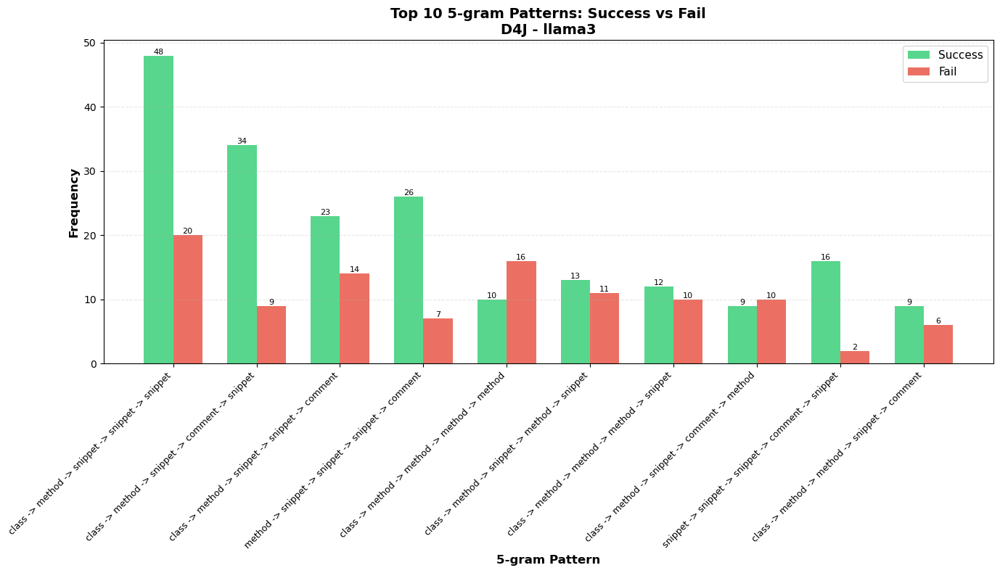


Benchmark: d4j | Model: llama3.1


Total 5-grams collected: 2705

Total 5-grams from successful executions: 1086

Total 5-grams from failed executions: 1619
                                            pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
   class -> method -> snippet -> snippet -> snippet             142                  79               63         55.6%      44.4%
snippet -> snippet -> snippet -> snippet -> snippet             132                  62               70         47.0%      53.0%
 method -> snippet -> snippet -> snippet -> snippet              97                  48               49         49.5%      50.5%
snippet -> snippet -> snippet -> comment -> snippet              59                  34               25         57.6%      42.4%
snippet -> snippet -> snippet -> snippet -> comment              53                  31               22         58.5%      41.5%
       class -> method -> method -> method -> class           

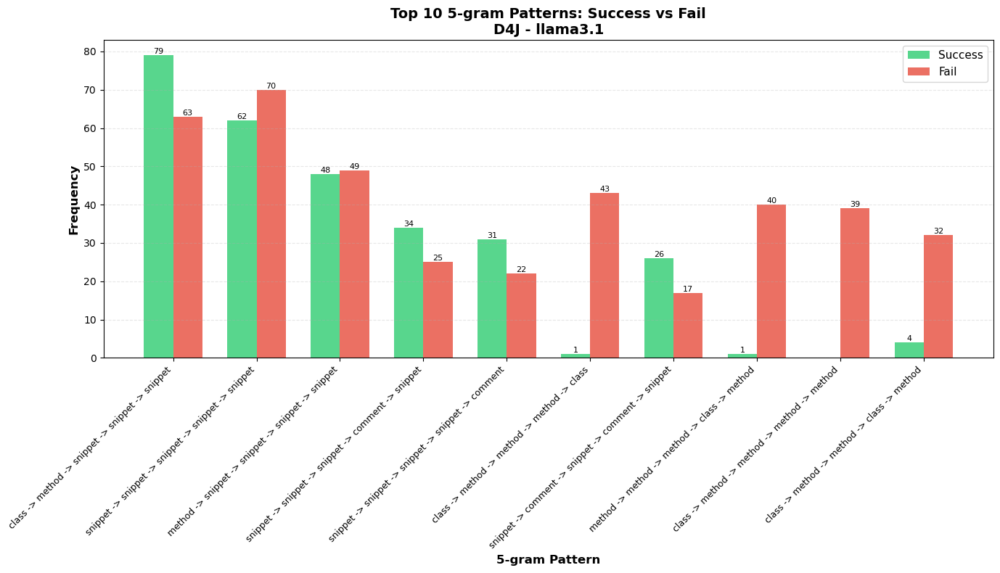


Benchmark: d4j | Model: mistral-nemo


Total 5-grams collected: 367

Total 5-grams from successful executions: 167

Total 5-grams from failed executions: 200
                                            pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
snippet -> snippet -> snippet -> snippet -> snippet              57                  29               28         50.9%      49.1%
   class -> method -> snippet -> snippet -> snippet              45                  18               27         40.0%      60.0%
  class -> snippet -> snippet -> snippet -> snippet              41                  19               22         46.3%      53.7%
 method -> snippet -> snippet -> snippet -> snippet              21                   9               12         42.9%      57.1%
  class -> snippet -> snippet -> comment -> snippet              16                   8                8         50.0%      50.0%
   class -> method -> snippet -> snippet -> comment          

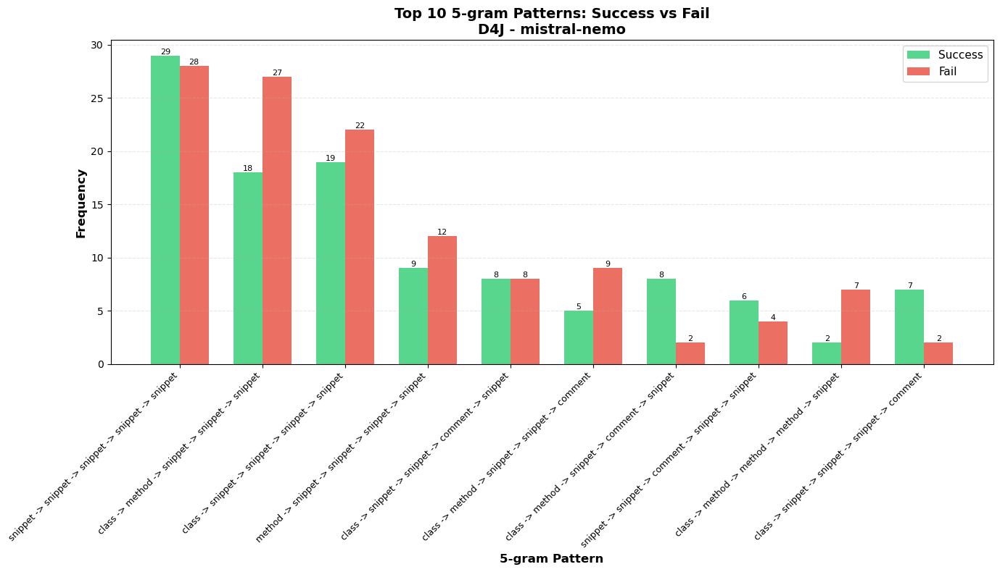


Benchmark: d4j | Model: qwen2.5-coder


Total 5-grams collected: 470

Total 5-grams from successful executions: 256

Total 5-grams from failed executions: 214
                                            pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
   class -> method -> snippet -> snippet -> snippet              53                  27               26         50.9%      49.1%
  class -> snippet -> snippet -> comment -> snippet              29                  17               12         58.6%      41.4%
  class -> snippet -> snippet -> snippet -> snippet              29                  19               10         65.5%      34.5%
   class -> method -> snippet -> snippet -> comment              18                   6               12         33.3%      66.7%
  class -> snippet -> snippet -> snippet -> comment              18                  12                6         66.7%      33.3%
snippet -> snippet -> snippet -> comment -> snippet         

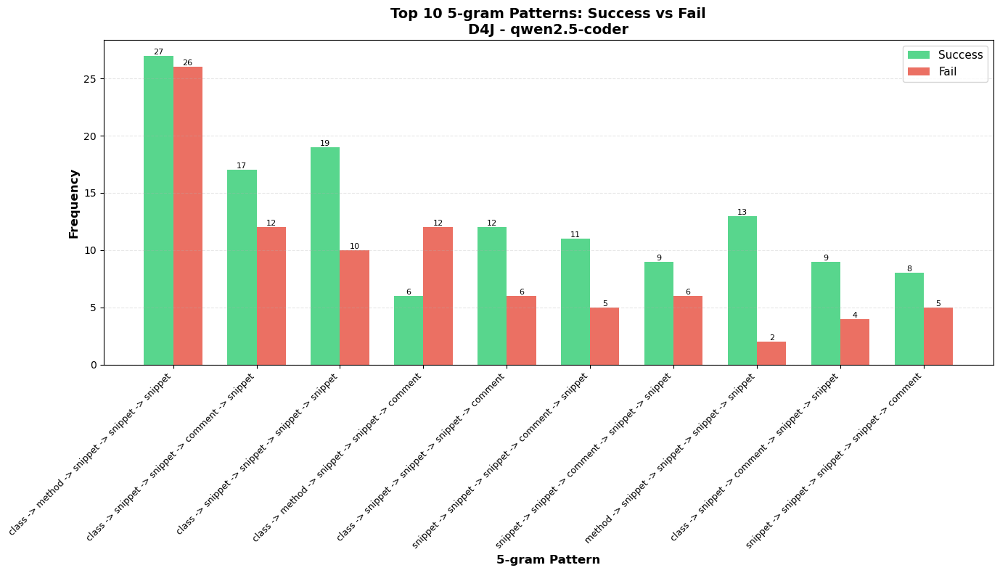


Benchmark: bip | Model: llama3


Total 5-grams collected: 1629

Total 5-grams from successful executions: 763

Total 5-grams from failed executions: 866
                                     pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
   class -> class -> class -> class -> class             665                 309              356         46.5%      53.5%
 package -> class -> class -> class -> class             546                 254              292         46.5%      53.5%
  class -> class -> class -> class -> method              89                  38               51         42.7%      57.3%
 class -> class -> class -> class -> snippet              66                  43               23         65.2%      34.8%
package -> class -> class -> class -> method              36                  13               23         36.1%      63.9%
 class -> class -> class -> class -> package              23                   6               17         26

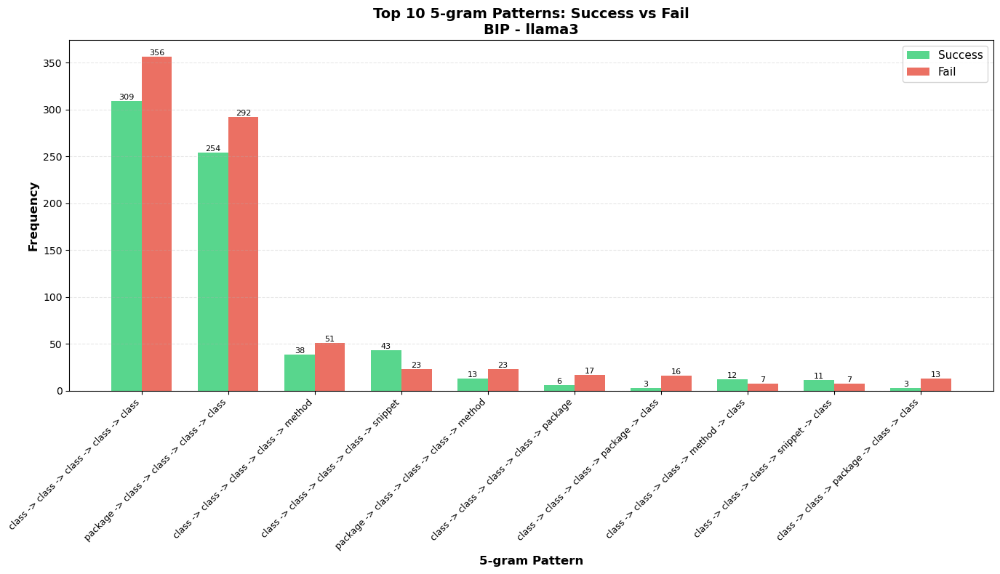


Benchmark: bip | Model: llama3.1


Total 5-grams collected: 5002

Total 5-grams from successful executions: 1990

Total 5-grams from failed executions: 3012
                                      pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
    class -> class -> class -> class -> class            1800                 535             1265         29.7%      70.3%
  package -> class -> class -> class -> class             714                 298              416         41.7%      58.3%
   class -> class -> class -> class -> method             302                 144              158         47.7%      52.3%
  class -> class -> class -> class -> snippet             188                 100               88         53.2%      46.8%
 class -> class -> class -> method -> snippet             173                 108               65         62.4%      37.6%
  class -> class -> class -> snippet -> class             108                  49               59

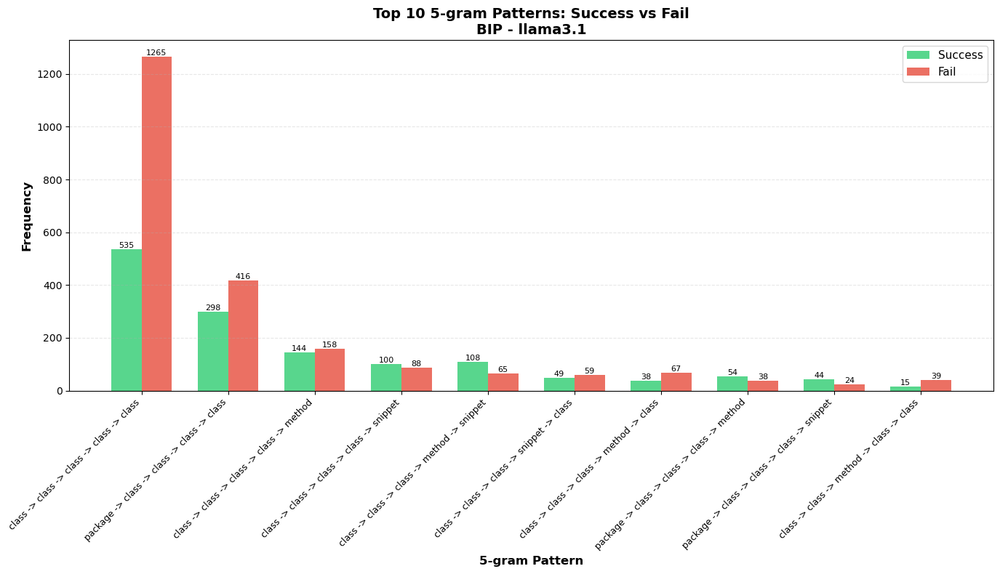


Benchmark: bip | Model: mistral-nemo


Total 5-grams collected: 378

Total 5-grams from successful executions: 133

Total 5-grams from failed executions: 245
                                            pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
 package -> method -> snippet -> snippet -> snippet              71                  14               57         19.7%      80.3%
  package -> method -> method -> snippet -> snippet              52                  23               29         44.2%      55.8%
   package -> method -> method -> method -> snippet              48                  25               23         52.1%      47.9%
 method -> snippet -> snippet -> snippet -> snippet              21                   4               17         19.0%      81.0%
  package -> method -> snippet -> method -> snippet              20                   8               12         40.0%      60.0%
    package -> method -> method -> method -> method          

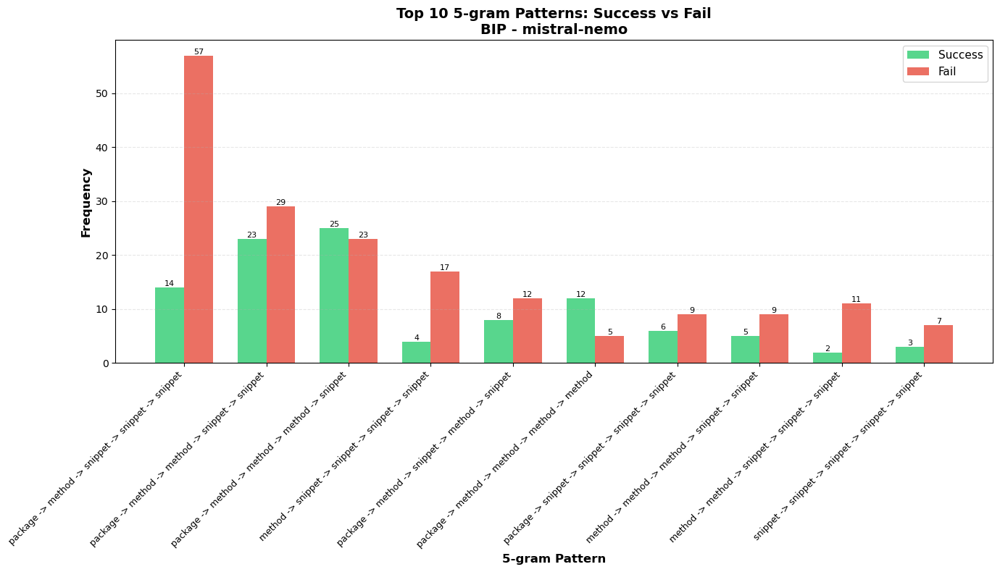


Benchmark: bip | Model: qwen2.5-coder


Total 5-grams collected: 347

Total 5-grams from successful executions: 145

Total 5-grams from failed executions: 202
                                            pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
 package -> method -> snippet -> snippet -> snippet              56                  21               35         37.5%      62.5%
  package -> method -> snippet -> method -> snippet              46                  22               24         47.8%      52.2%
  package -> method -> snippet -> snippet -> method              25                   8               17         32.0%      68.0%
  package -> method -> method -> snippet -> snippet              18                   9                9         50.0%      50.0%
 method -> snippet -> snippet -> snippet -> snippet              16                   5               11         31.2%      68.8%
   package -> method -> method -> method -> snippet         

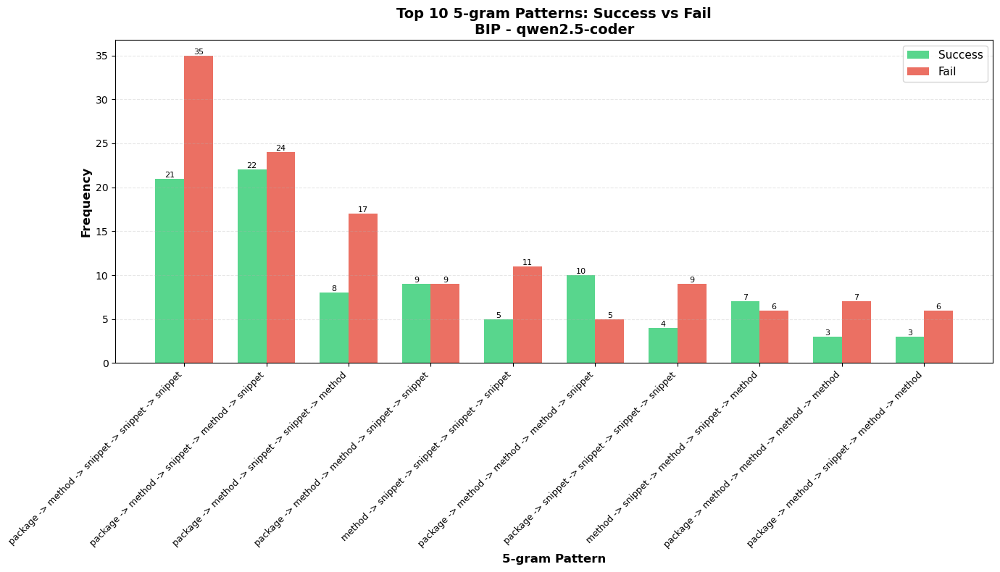

In [17]:
# Compare top 10 most frequent n-grams in all executions vs success/fail executions

import matplotlib.pyplot as plt
import numpy as np

# Function name mapping for readability
name_mapping = {
    'get_covered_packages': 'package',
    'get_failing_tests_covered_classes': 'class',
    'get_failing_tests_covered_methods_for_class': 'method',
    'get_code_snippet': 'snippet',
    'get_comments': 'comment'
}

def shorten_pattern(pattern_tuple):
    """Convert long function names to short versions"""
    return ' -> '.join([name_mapping.get(func, func) for func in pattern_tuple])

# For each benchmark and model combination
n=5
benchmarks = ['d4j', 'bip']
models = ['llama3', 'llama3.1', 'mistral-nemo', 'qwen2.5-coder']

for bm in benchmarks:
    for model in models:
        print(f"\n{'='*100}")
        print(f"Benchmark: {bm} | Model: {model}")
        print(f"{'='*100}\n")
        
        # Load the three counters
        all_ngrams, success_ngrams, fail_ngrams = get_ngrams_for_executions(bm, model, n)
        
        all_counter = Counter(all_ngrams)
        success_counter = Counter(success_ngrams)
        fail_counter = Counter(fail_ngrams)
        
        # Get top 10 from all executions
        top_10_patterns = [pattern for pattern, count in all_counter.most_common(10)]
        
        # Create comparison table
        comparison_data = []
        for pattern in top_10_patterns:
            all_count = all_counter[pattern]
            success_count = success_counter[pattern]
            fail_count = fail_counter[pattern]
            
            comparison_data.append({
                'pattern': shorten_pattern(pattern),
                'all_executions': all_count,
                'success_executions': success_count,
                'fail_executions': fail_count,
                'success_ratio': f"{success_count/all_count*100:.1f}%" if all_count > 0 else "0%",
                'fail_ratio': f"{fail_count/all_count*100:.1f}%" if all_count > 0 else "0%"
            })
        
        # Display as DataFrame
        comparison_df = pd.DataFrame(comparison_data)
        print(comparison_df.to_string(index=False))
        print()
        
        # Create bar chart
        fig, ax = plt.subplots(figsize=(14, 8))
        
        patterns = comparison_df['pattern'].tolist()
        success_counts = comparison_df['success_executions'].tolist()
        fail_counts = comparison_df['fail_executions'].tolist()
        
        x = np.arange(len(patterns))
        width = 0.35
        
        bars1 = ax.bar(x - width/2, success_counts, width, label='Success', color='#2ecc71', alpha=0.8)
        bars2 = ax.bar(x + width/2, fail_counts, width, label='Fail', color='#e74c3c', alpha=0.8)
        
        ax.set_xlabel(f'{n}-gram Pattern', fontsize=12, fontweight='bold')
        ax.set_ylabel('Frequency', fontsize=12, fontweight='bold')
        ax.set_title(f'Top 10 {n}-gram Patterns: Success vs Fail\n{bm.upper()} - {model}', fontsize=14, fontweight='bold')
        ax.set_xticks(x)
        ax.set_xticklabels(patterns, rotation=45, ha='right', fontsize=9)
        ax.legend(fontsize=11)
        ax.grid(axis='y', alpha=0.3, linestyle='--')
        
        # Add value labels on bars
        for bars in [bars1, bars2]:
            for bar in bars:
                height = bar.get_height()
                if height > 0:
                    ax.text(bar.get_x() + bar.get_width()/2., height,
                           f'{int(height)}',
                           ha='center', va='bottom', fontsize=8)
        
        plt.tight_layout()
        plt.show()


Benchmark: d4j | Model: llama3


Total 5-grams collected: 879

Total 5-grams from successful executions: 518

Total 5-grams from failed executions: 361


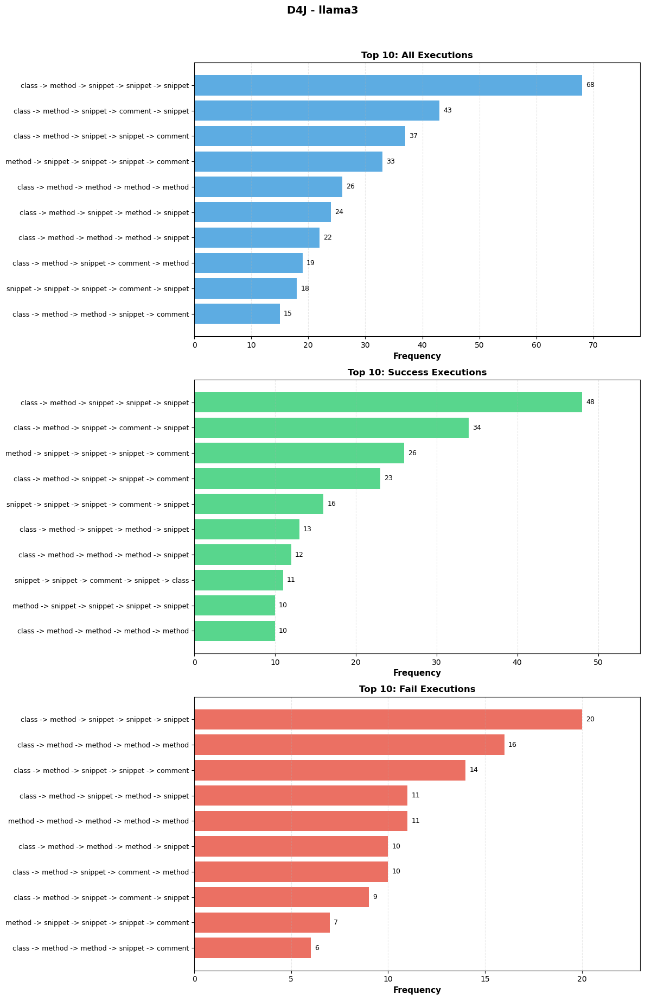


Benchmark: d4j | Model: llama3.1


Total 5-grams collected: 2705

Total 5-grams from successful executions: 1086

Total 5-grams from failed executions: 1619


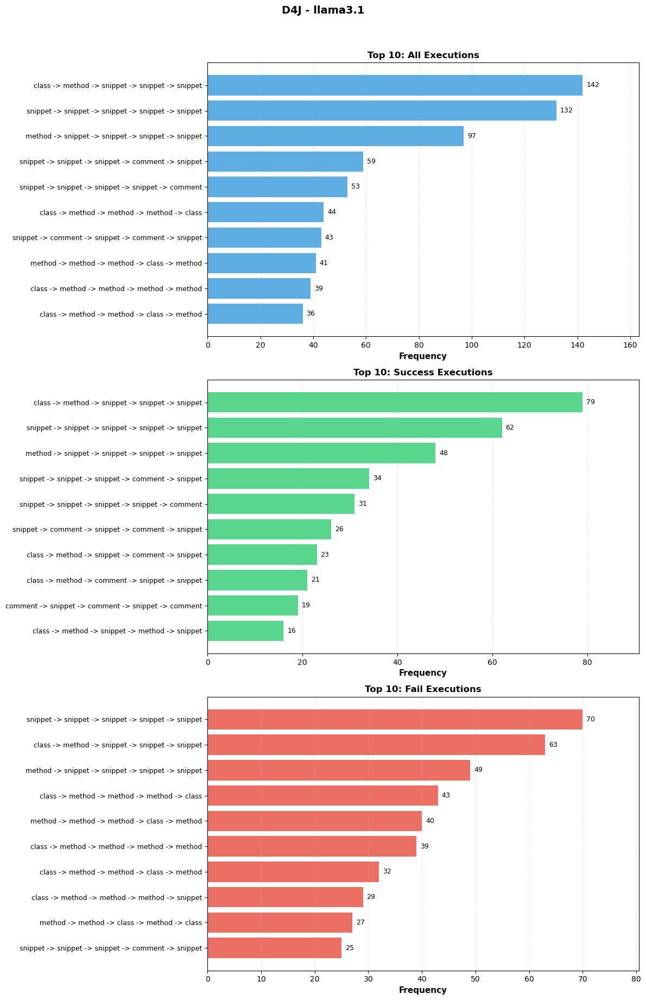


Benchmark: d4j | Model: mistral-nemo


Total 5-grams collected: 367

Total 5-grams from successful executions: 167

Total 5-grams from failed executions: 200


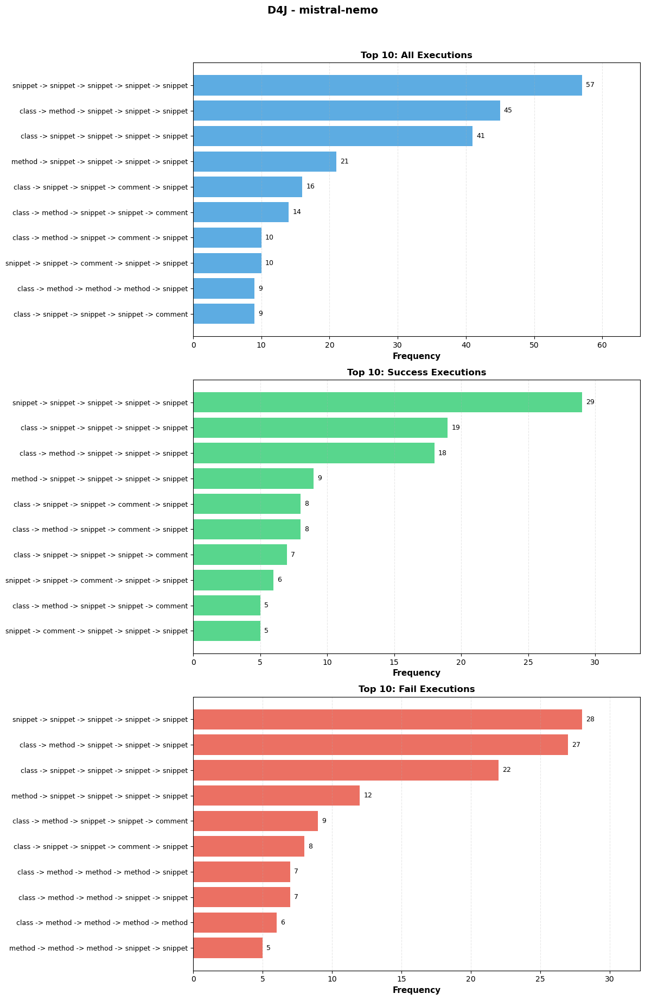


Benchmark: d4j | Model: qwen2.5-coder


Total 5-grams collected: 470

Total 5-grams from successful executions: 256

Total 5-grams from failed executions: 214


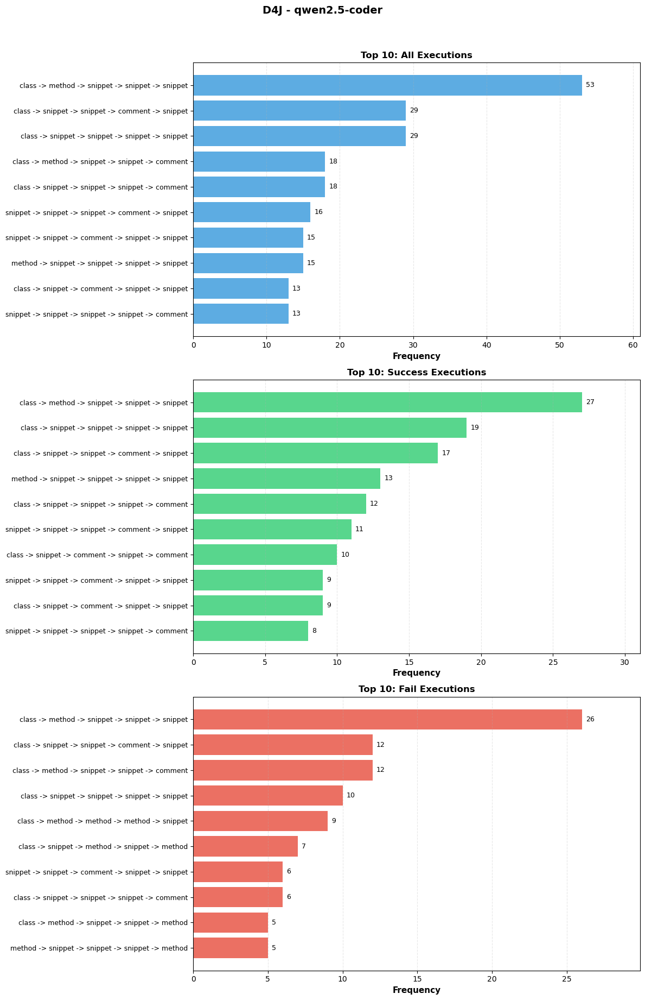


Benchmark: bip | Model: llama3


Total 5-grams collected: 1629

Total 5-grams from successful executions: 763

Total 5-grams from failed executions: 866


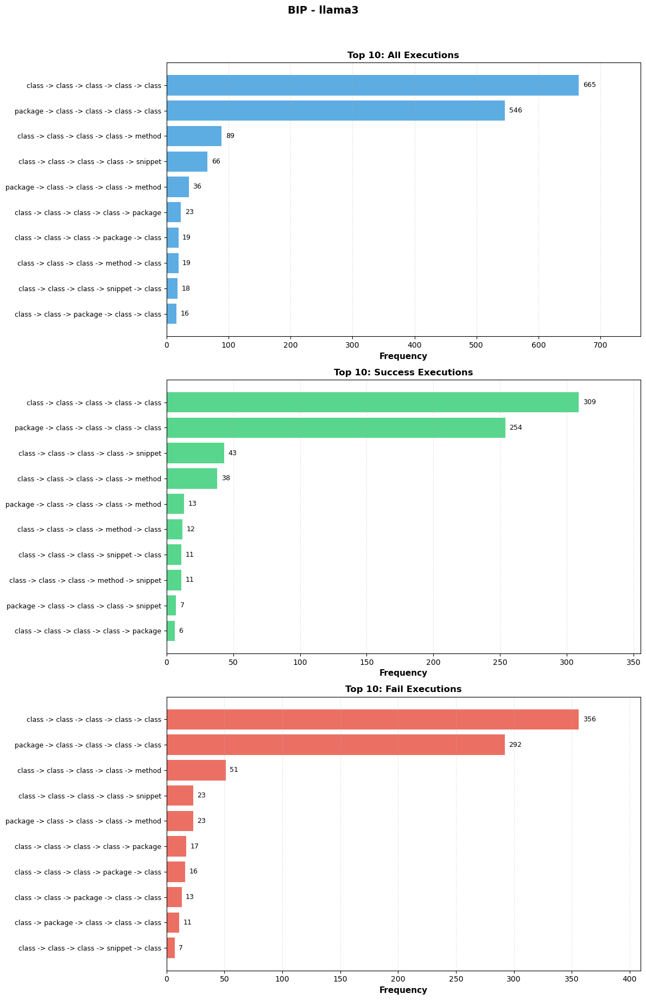


Benchmark: bip | Model: llama3.1


Total 5-grams collected: 5002

Total 5-grams from successful executions: 1990

Total 5-grams from failed executions: 3012


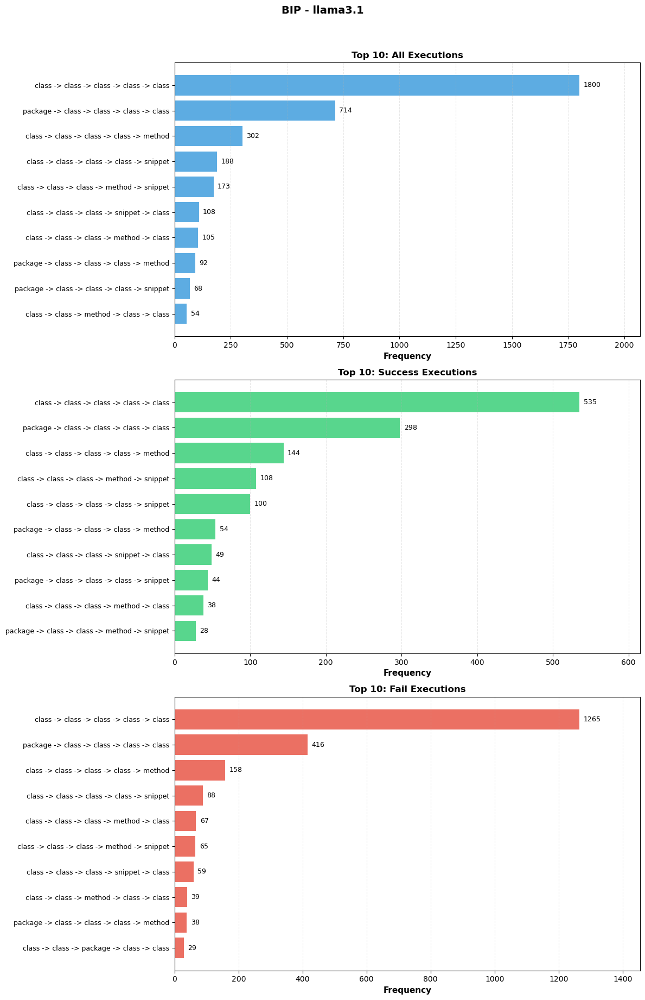


Benchmark: bip | Model: mistral-nemo


Total 5-grams collected: 378

Total 5-grams from successful executions: 133

Total 5-grams from failed executions: 245


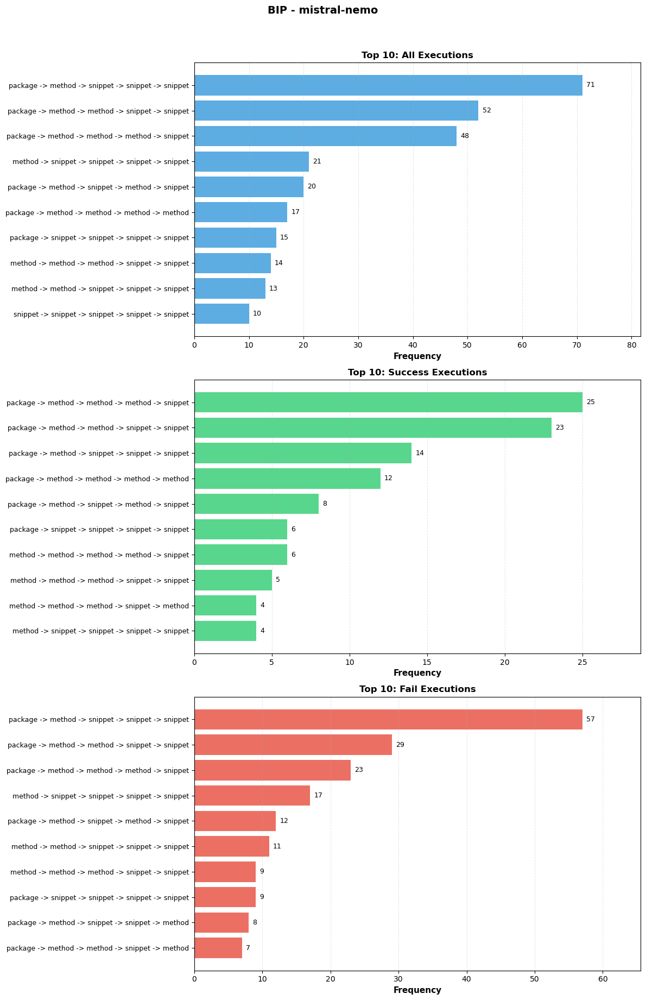


Benchmark: bip | Model: qwen2.5-coder


Total 5-grams collected: 347

Total 5-grams from successful executions: 145

Total 5-grams from failed executions: 202


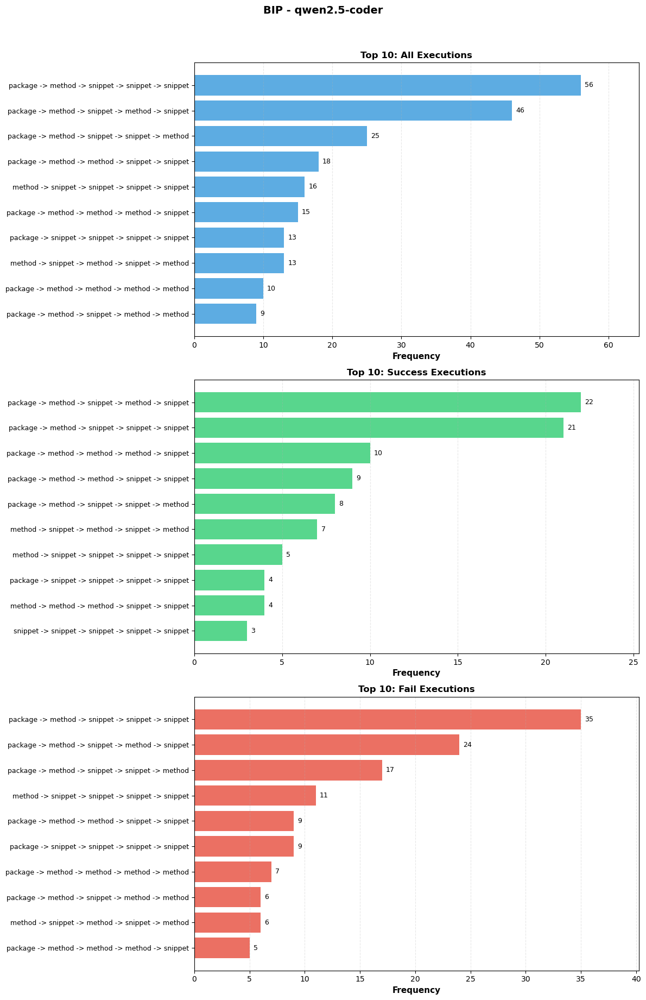

In [18]:
# Visualize Top 10 patterns separately for all/success/fail executions

import matplotlib.pyplot as plt
import numpy as np

# Function name mapping for readability
name_mapping = {
    'get_covered_packages': 'package',
    'get_failing_tests_covered_classes': 'class',
    'get_failing_tests_covered_methods_for_class': 'method',
    'get_code_snippet': 'snippet',
    'get_comments': 'comment'
}

def shorten_pattern(pattern_tuple):
    """Convert long function names to short versions"""
    return ' -> '.join([name_mapping.get(func, func) for func in pattern_tuple])

# For each benchmark and model combination
n=5
benchmarks = ['d4j', 'bip']
models = ['llama3', 'llama3.1', 'mistral-nemo', 'qwen2.5-coder']

for bm in benchmarks:
    for model in models:
        print(f"\n{'='*100}")
        print(f"Benchmark: {bm} | Model: {model}")
        print(f"{'='*100}\n")
        
        # Load the three counters
        all_ngrams, success_ngrams, fail_ngrams = get_ngrams_for_executions(bm, model, n)
        
        all_counter = Counter(all_ngrams)
        success_counter = Counter(success_ngrams)
        fail_counter = Counter(fail_ngrams)
        
        # Get top 10 from each counter
        top_10_all = [(shorten_pattern(pattern), count) for pattern, count in all_counter.most_common(10)]
        top_10_success = [(shorten_pattern(pattern), count) for pattern, count in success_counter.most_common(10)]
        top_10_fail = [(shorten_pattern(pattern), count) for pattern, count in fail_counter.most_common(10)]
        
        # Create 3 subplots
        fig, axes = plt.subplots(3, 1, figsize=(12, 18))
        
        # Plot 1: All Executions
        patterns_all = [p[0] for p in top_10_all]
        counts_all = [p[1] for p in top_10_all]
        
        axes[0].barh(range(len(patterns_all)), counts_all, color='#3498db', alpha=0.8)
        axes[0].set_yticks(range(len(patterns_all)))
        axes[0].set_yticklabels(patterns_all, fontsize=9)
        axes[0].set_xlabel('Frequency', fontsize=11, fontweight='bold')
        axes[0].set_title('Top 10: All Executions', fontsize=12, fontweight='bold')
        axes[0].invert_yaxis()
        axes[0].grid(axis='x', alpha=0.3, linestyle='--')

        axes[0].set_xlim(0, max(counts_all)*1.15)
        
        # Add value labels
        for i, v in enumerate(counts_all):
            axes[0].text(v + max(counts_all)*0.01, i, str(v), va='center', fontsize=9)
        
        # Plot 2: Success Executions
        patterns_success = [p[0] for p in top_10_success]
        counts_success = [p[1] for p in top_10_success]
        
        axes[1].barh(range(len(patterns_success)), counts_success, color='#2ecc71', alpha=0.8)
        axes[1].set_yticks(range(len(patterns_success)))
        axes[1].set_yticklabels(patterns_success, fontsize=9)
        axes[1].set_xlabel('Frequency', fontsize=11, fontweight='bold')
        axes[1].set_title('Top 10: Success Executions', fontsize=12, fontweight='bold')
        axes[1].invert_yaxis()
        axes[1].grid(axis='x', alpha=0.3, linestyle='--')

        axes[1].set_xlim(0, max(counts_success)*1.15)
        
        # Add value labels
        for i, v in enumerate(counts_success):
            axes[1].text(v + max(counts_success)*0.01, i, str(v), va='center', fontsize=9)
        
        # Plot 3: Fail Executions
        patterns_fail = [p[0] for p in top_10_fail]
        counts_fail = [p[1] for p in top_10_fail]
        
        axes[2].barh(range(len(patterns_fail)), counts_fail, color='#e74c3c', alpha=0.8)
        axes[2].set_yticks(range(len(patterns_fail)))
        axes[2].set_yticklabels(patterns_fail, fontsize=9)
        axes[2].set_xlabel('Frequency', fontsize=11, fontweight='bold')
        axes[2].set_title('Top 10: Fail Executions', fontsize=12, fontweight='bold')
        axes[2].invert_yaxis()
        axes[2].grid(axis='x', alpha=0.3, linestyle='--')

        axes[2].set_xlim(0, max(counts_fail)*1.15)
        
        # Add value labels
        for i, v in enumerate(counts_fail):
            axes[2].text(v + max(counts_fail)*0.01, i, str(v), va='center', fontsize=9)
        
        # Overall title
        fig.suptitle(f'{bm.upper()} - {model}', fontsize=14, fontweight='bold', y=1.02)
        
        plt.tight_layout()
        plt.show()

### 4-gram

In [19]:
# Get n-gram: frequencies for all benchmarks and models
n = 4
benchmarks = ['d4j', 'bip']
models = ['llama3', 'llama3.1', 'mistral-nemo', 'qwen2.5-coder']

for bm in benchmarks:
    for model in models:
        all_ngrams, all_success_ngrams, all_fail_ngrams = get_ngrams_for_executions(bm, model, n)

        all_counter = Counter(all_ngrams)
        success_counter = Counter(all_success_ngrams)
        fail_counter = Counter(all_fail_ngrams)

        all_results = []
        success_results = []
        fail_results = []
        for ngram, count in all_counter.most_common():
            all_results.append({
                f'{n}gram': ngram,
                'frequency': count
            })
        for ngram, count in success_counter.most_common():
            success_results.append({
                f'{n}gram': ngram,
                'frequency': count
            })
        for ngram, count in fail_counter.most_common():
            fail_results.append({
                f'{n}gram': ngram,
                'frequency': count
            })
            
        
        all_df = pd.DataFrame(all_results)
        success_df = pd.DataFrame(success_results)
        fail_df = pd.DataFrame(fail_results)

        output_dir = f"./{n}gram_frequency/autofl/all_executions"
        os.makedirs(output_dir, exist_ok=True)
        output_file = os.path.join(output_dir, f"{bm}_{model}_{n}gram_frequencies.csv")
        all_df.to_csv(output_file, index=False)
        print(f"Saved {output_file} with {len(all_df)} unique {n}-gram")

        output_dir = f"./{n}gram_frequency/autofl/success_executions"
        os.makedirs(output_dir, exist_ok=True)
        output_file = os.path.join(output_dir, f"{bm}_{model}_{n}gram_frequencies.csv")
        success_df.to_csv(output_file, index=False)
        print(f"Saved {output_file} with {len(success_df)} unique {n}-gram")

        output_dir = f"./{n}gram_frequency/autofl/fail_executions"
        os.makedirs(output_dir, exist_ok=True)
        output_file = os.path.join(output_dir, f"{bm}_{model}_{n}gram_frequencies.csv")
        fail_df.to_csv(output_file, index=False)
        print(f"Saved {output_file} with {len(fail_df)} unique {n}-gram")





Total 4-grams collected: 1646

Total 4-grams from successful executions: 950

Total 4-grams from failed executions: 696
Saved ./4gram_frequency/autofl/all_executions/d4j_llama3_4gram_frequencies.csv with 150 unique 4-gram
Saved ./4gram_frequency/autofl/success_executions/d4j_llama3_4gram_frequencies.csv with 120 unique 4-gram
Saved ./4gram_frequency/autofl/fail_executions/d4j_llama3_4gram_frequencies.csv with 120 unique 4-gram

Total 4-grams collected: 3898

Total 4-grams from successful executions: 1663

Total 4-grams from failed executions: 2235
Saved ./4gram_frequency/autofl/all_executions/d4j_llama3.1_4gram_frequencies.csv with 195 unique 4-gram
Saved ./4gram_frequency/autofl/success_executions/d4j_llama3.1_4gram_frequencies.csv with 150 unique 4-gram
Saved ./4gram_frequency/autofl/fail_executions/d4j_llama3.1_4gram_frequencies.csv with 180 unique 4-gram

Total 4-grams collected: 753

Total 4-grams from successful executions: 330

Total 4-grams from failed executions: 423
Saved ./


Benchmark: d4j | Model: llama3


Total 4-grams collected: 1646

Total 4-grams from successful executions: 950

Total 4-grams from failed executions: 696
                                 pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
   class -> method -> snippet -> comment             241                 164               77         68.0%      32.0%
   class -> method -> snippet -> snippet             193                 117               76         60.6%      39.4%
 method -> snippet -> snippet -> snippet              76                  56               20         73.7%      26.3%
     class -> method -> method -> method              71                  31               40         43.7%      56.3%
    class -> method -> snippet -> method              71                  36               35         50.7%      49.3%
    class -> method -> method -> snippet              59                  35               24         59.3%      40.7%
 method -> sn

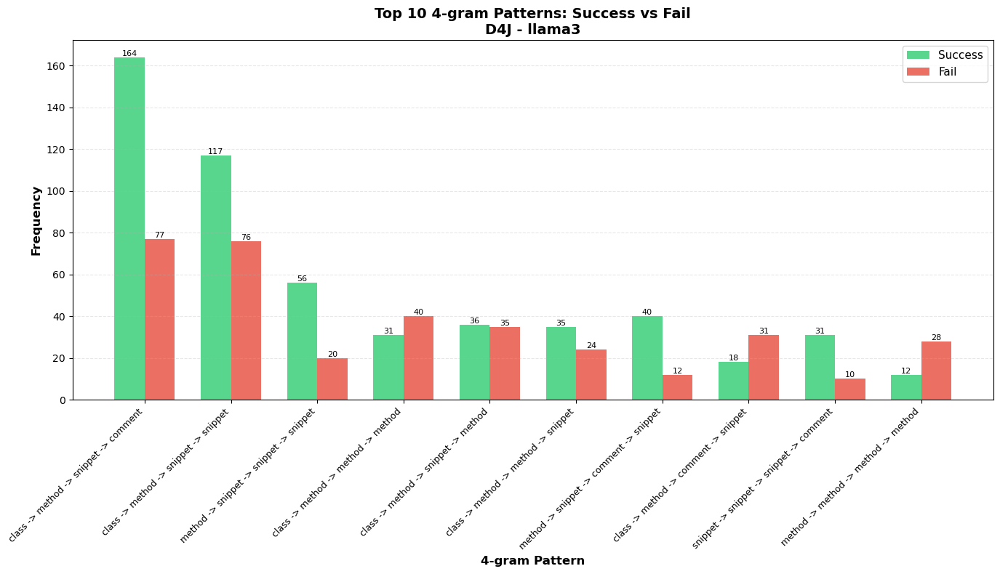


Benchmark: d4j | Model: llama3.1


Total 4-grams collected: 3898

Total 4-grams from successful executions: 1663

Total 4-grams from failed executions: 2235
                                 pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
   class -> method -> snippet -> snippet             281                 159              122         56.6%      43.4%
snippet -> snippet -> snippet -> snippet             243                 118              125         48.6%      51.4%
   class -> method -> comment -> snippet             197                 127               70         64.5%      35.5%
   class -> method -> snippet -> comment             184                 129               55         70.1%      29.9%
 method -> snippet -> snippet -> snippet             164                  86               78         52.4%      47.6%
     class -> method -> method -> method             126                   8              118          6.3%      93.7%
    class

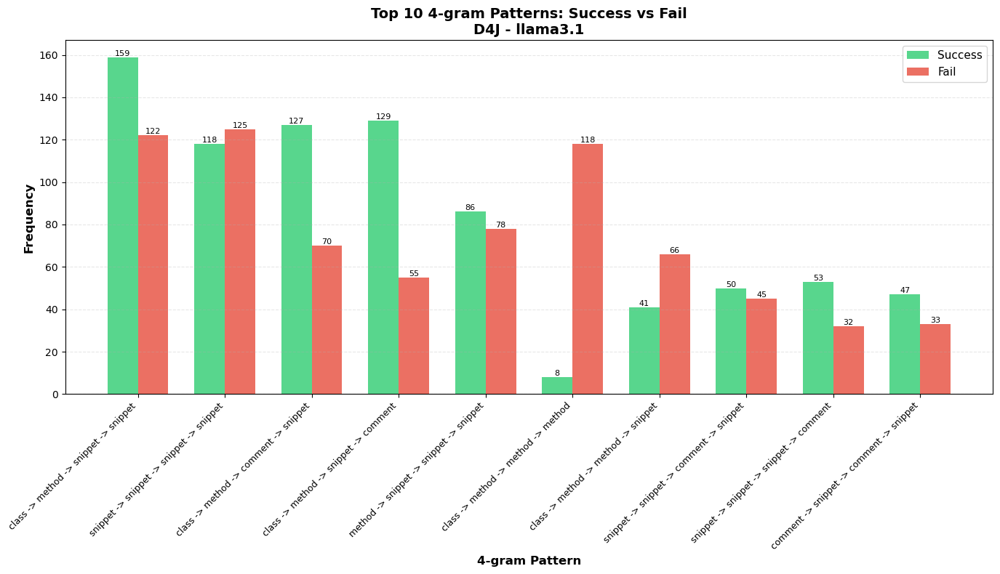


Benchmark: d4j | Model: mistral-nemo


Total 4-grams collected: 753

Total 4-grams from successful executions: 330

Total 4-grams from failed executions: 423
                                 pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
snippet -> snippet -> snippet -> snippet             123                  60               63         48.8%      51.2%
   class -> method -> snippet -> snippet              97                  36               61         37.1%      62.9%
  class -> snippet -> snippet -> snippet              83                  42               41         50.6%      49.4%
   class -> method -> snippet -> comment              66                  41               25         62.1%      37.9%
 method -> snippet -> snippet -> snippet              47                  18               29         38.3%      61.7%
  class -> snippet -> snippet -> comment              35                  13               22         37.1%      62.9%
snippet 

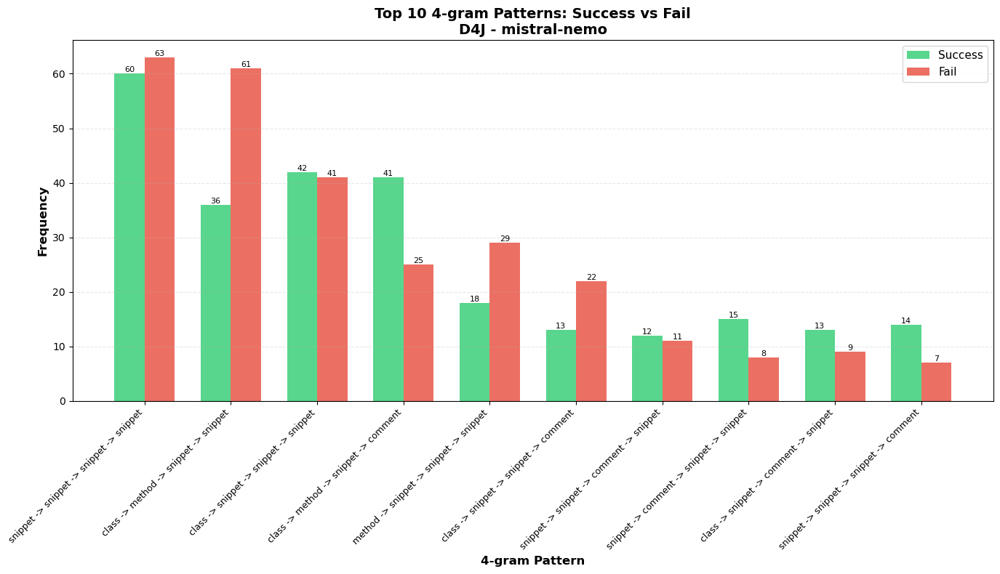


Benchmark: d4j | Model: qwen2.5-coder


Total 4-grams collected: 957

Total 4-grams from successful executions: 503

Total 4-grams from failed executions: 454
                                 pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
   class -> method -> snippet -> snippet             126                  59               67         46.8%      53.2%
  class -> snippet -> snippet -> snippet              89                  54               35         60.7%      39.3%
 method -> snippet -> snippet -> snippet              56                  29               27         51.8%      48.2%
snippet -> snippet -> snippet -> snippet              55                  41               14         74.5%      25.5%
  class -> snippet -> comment -> snippet              54                  41               13         75.9%      24.1%
snippet -> snippet -> comment -> snippet              53                  32               21         60.4%      39.6%
   clas

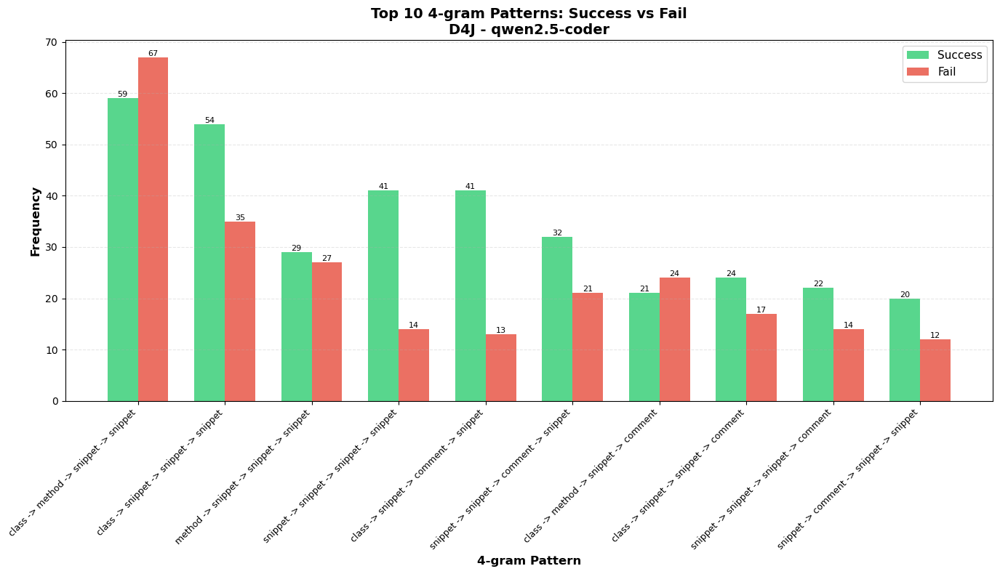


Benchmark: bip | Model: llama3


Total 4-grams collected: 2410

Total 4-grams from successful executions: 1152

Total 4-grams from failed executions: 1258
                            pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
   class -> class -> class -> class            1212                 564              648         46.5%      53.5%
 package -> class -> class -> class             734                 348              386         47.4%      52.6%
  class -> class -> class -> method             125                  51               74         40.8%      59.2%
 class -> class -> class -> snippet              77                  50               27         64.9%      35.1%
 class -> class -> class -> package              32                   9               23         28.1%      71.9%
 class -> class -> package -> class              24                   4               20         16.7%      83.3%
  class -> class -> method -> class           

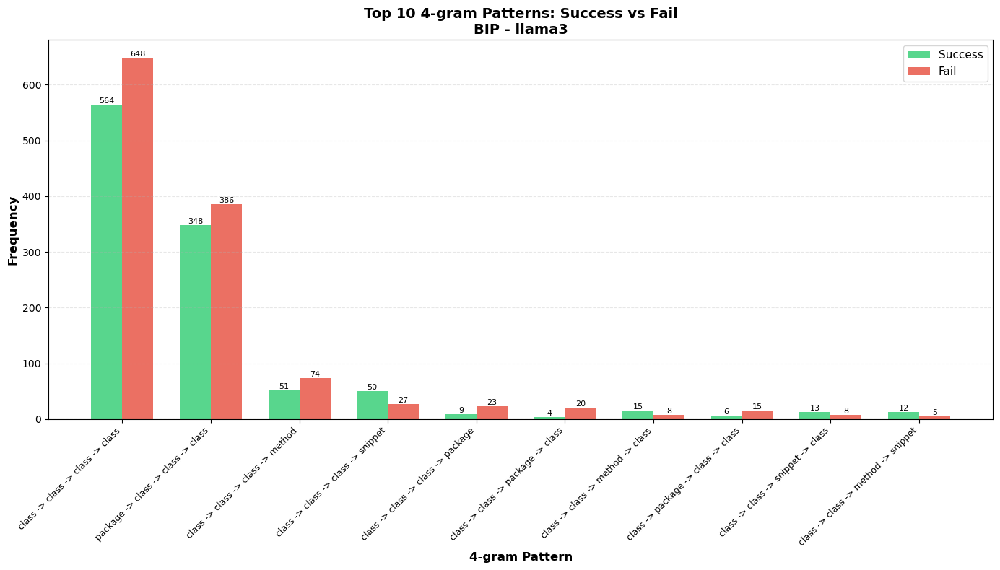


Benchmark: bip | Model: llama3.1


Total 4-grams collected: 6364

Total 4-grams from successful executions: 2662

Total 4-grams from failed executions: 3702
                                pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
       class -> class -> class -> class            2542                 841             1701         33.1%      66.9%
     package -> class -> class -> class             919                 418              501         45.5%      54.5%
      class -> class -> class -> method             401                 201              200         50.1%      49.9%
     class -> class -> class -> snippet             270                 149              121         55.2%      44.8%
    class -> class -> method -> snippet             221                 138               83         62.4%      37.6%
     class -> class -> snippet -> class             147                  69               78         46.9%      53.1%
      class -> c

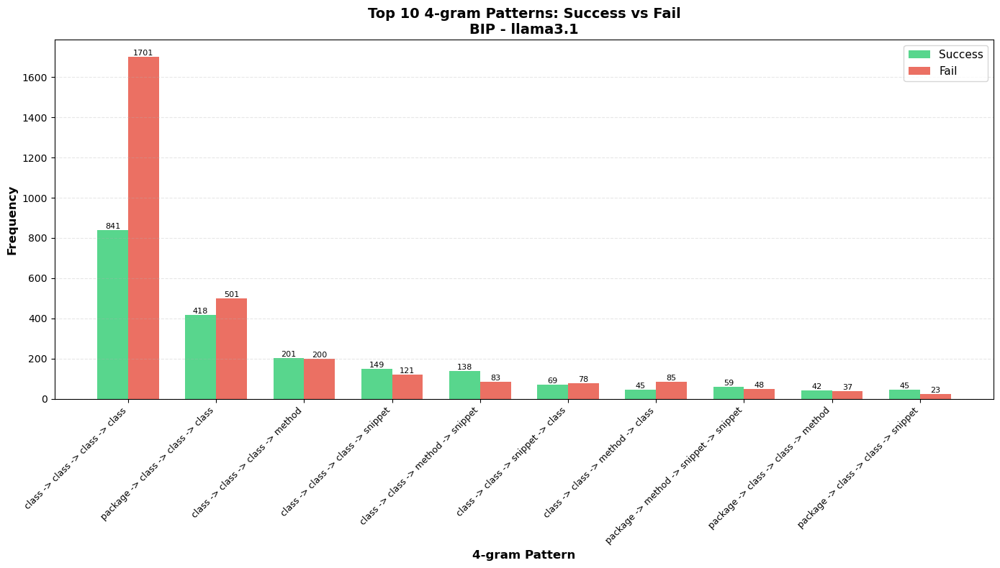


Benchmark: bip | Model: mistral-nemo


Total 4-grams collected: 1121

Total 4-grams from successful executions: 441

Total 4-grams from failed executions: 680
                                 pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
 package -> method -> snippet -> snippet             320                 125              195         39.1%      60.9%
  package -> method -> method -> snippet             170                  78               92         45.9%      54.1%
 method -> snippet -> snippet -> snippet              86                  16               70         18.6%      81.4%
   package -> method -> method -> method              80                  44               36         55.0%      45.0%
  method -> method -> snippet -> snippet              68                  28               40         41.2%      58.8%
package -> snippet -> snippet -> snippet              58                  28               30         48.3%      51.7%
   meth

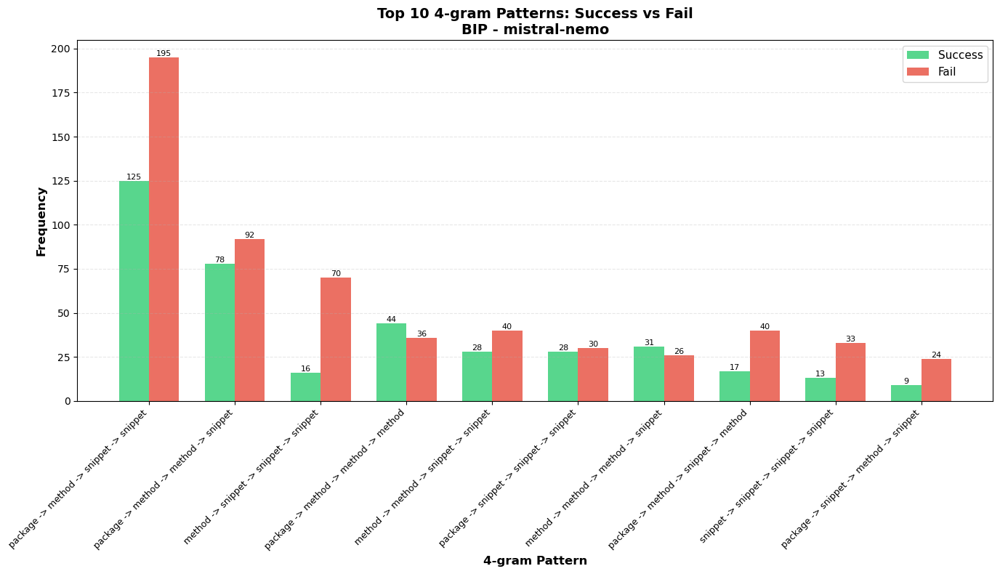


Benchmark: bip | Model: qwen2.5-coder


Total 4-grams collected: 854

Total 4-grams from successful executions: 370

Total 4-grams from failed executions: 484
                                 pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
 package -> method -> snippet -> snippet             198                  84              114         42.4%      57.6%
  package -> method -> snippet -> method             118                  52               66         44.1%      55.9%
  package -> method -> method -> snippet              69                  37               32         53.6%      46.4%
 method -> snippet -> snippet -> snippet              61                  24               37         39.3%      60.7%
  method -> snippet -> method -> snippet              51                  22               29         43.1%      56.9%
package -> snippet -> snippet -> snippet              38                  15               23         39.5%      60.5%
snippet

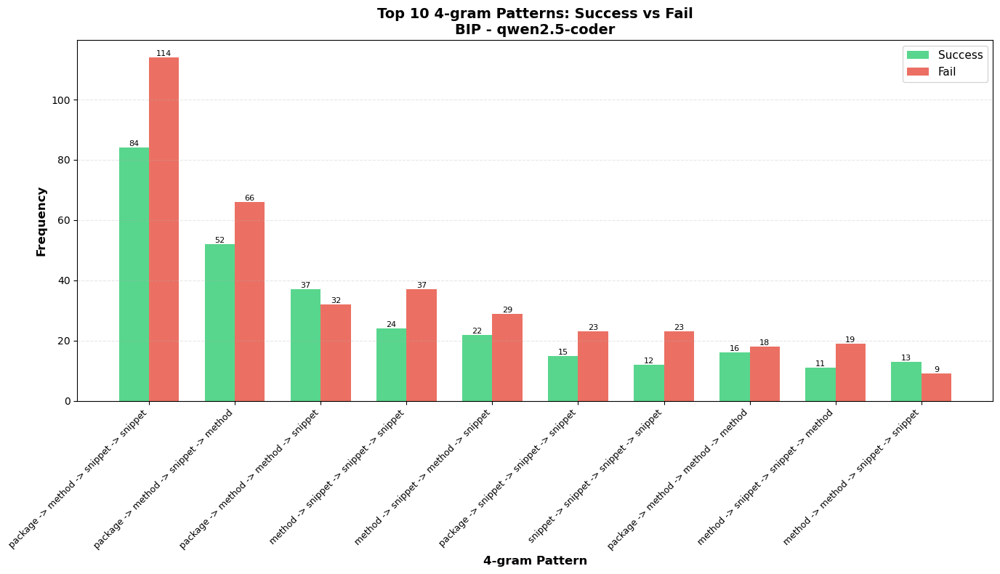

In [21]:
# Compare top 10 most frequent n-grams in all executions vs success/fail executions

import matplotlib.pyplot as plt
import numpy as np

# Function name mapping for readability
name_mapping = {
    'get_covered_packages': 'package',
    'get_failing_tests_covered_classes': 'class',
    'get_failing_tests_covered_methods_for_class': 'method',
    'get_code_snippet': 'snippet',
    'get_comments': 'comment'
}

def shorten_pattern(pattern_tuple):
    """Convert long function names to short versions"""
    return ' -> '.join([name_mapping.get(func, func) for func in pattern_tuple])

# For each benchmark and model combination
n=4
benchmarks = ['d4j', 'bip']
models = ['llama3', 'llama3.1', 'mistral-nemo', 'qwen2.5-coder']

for bm in benchmarks:
    for model in models:
        print(f"\n{'='*100}")
        print(f"Benchmark: {bm} | Model: {model}")
        print(f"{'='*100}\n")
        
        # Load the three counters
        all_ngrams, success_ngrams, fail_ngrams = get_ngrams_for_executions(bm, model, n)
        
        all_counter = Counter(all_ngrams)
        success_counter = Counter(success_ngrams)
        fail_counter = Counter(fail_ngrams)
        
        # Get top 10 from all executions
        top_10_patterns = [pattern for pattern, count in all_counter.most_common(10)]
        
        # Create comparison table
        comparison_data = []
        for pattern in top_10_patterns:
            all_count = all_counter[pattern]
            success_count = success_counter[pattern]
            fail_count = fail_counter[pattern]
            
            comparison_data.append({
                'pattern': shorten_pattern(pattern),
                'all_executions': all_count,
                'success_executions': success_count,
                'fail_executions': fail_count,
                'success_ratio': f"{success_count/all_count*100:.1f}%" if all_count > 0 else "0%",
                'fail_ratio': f"{fail_count/all_count*100:.1f}%" if all_count > 0 else "0%"
            })
        
        # Display as DataFrame
        comparison_df = pd.DataFrame(comparison_data)
        print(comparison_df.to_string(index=False))
        print()
        
        # Create bar chart
        fig, ax = plt.subplots(figsize=(14, 8))
        
        patterns = comparison_df['pattern'].tolist()
        success_counts = comparison_df['success_executions'].tolist()
        fail_counts = comparison_df['fail_executions'].tolist()
        
        x = np.arange(len(patterns))
        width = 0.35
        
        bars1 = ax.bar(x - width/2, success_counts, width, label='Success', color='#2ecc71', alpha=0.8)
        bars2 = ax.bar(x + width/2, fail_counts, width, label='Fail', color='#e74c3c', alpha=0.8)
        
        ax.set_xlabel(f'{n}-gram Pattern', fontsize=12, fontweight='bold')
        ax.set_ylabel('Frequency', fontsize=12, fontweight='bold')
        ax.set_title(f'Top 10 {n}-gram Patterns: Success vs Fail\n{bm.upper()} - {model}', fontsize=14, fontweight='bold')
        ax.set_xticks(x)
        ax.set_xticklabels(patterns, rotation=45, ha='right', fontsize=9)
        ax.legend(fontsize=11)
        ax.grid(axis='y', alpha=0.3, linestyle='--')
        
        # Add value labels on bars
        for bars in [bars1, bars2]:
            for bar in bars:
                height = bar.get_height()
                if height > 0:
                    ax.text(bar.get_x() + bar.get_width()/2., height,
                           f'{int(height)}',
                           ha='center', va='bottom', fontsize=8)
        
        plt.tight_layout()
        plt.show()


Benchmark: d4j | Model: llama3




Total 4-grams collected: 1646

Total 4-grams from successful executions: 950

Total 4-grams from failed executions: 696


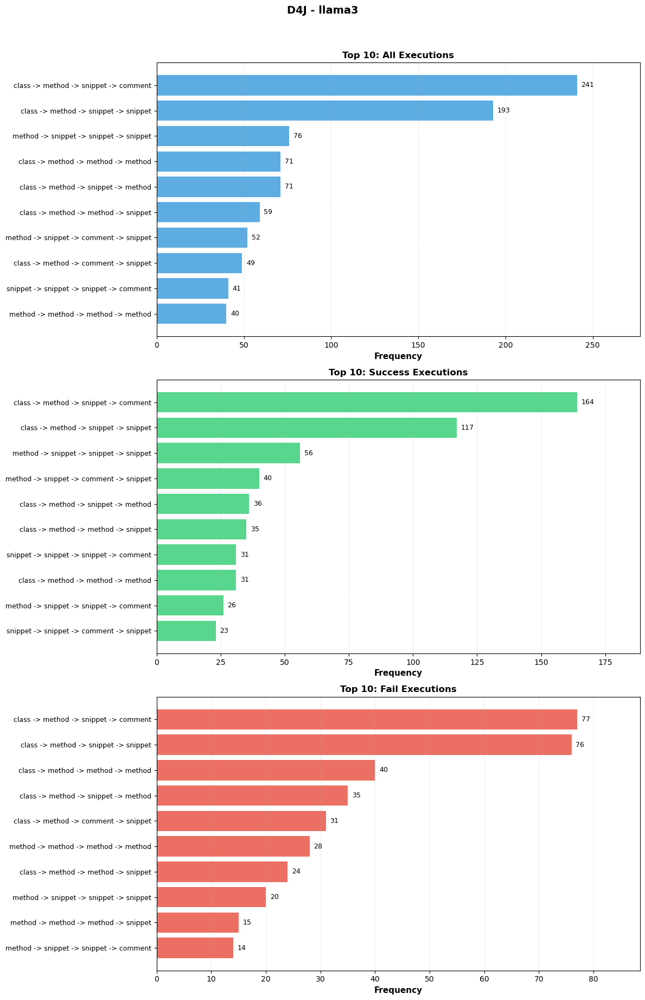


Benchmark: d4j | Model: llama3.1


Total 4-grams collected: 3898

Total 4-grams from successful executions: 1663

Total 4-grams from failed executions: 2235


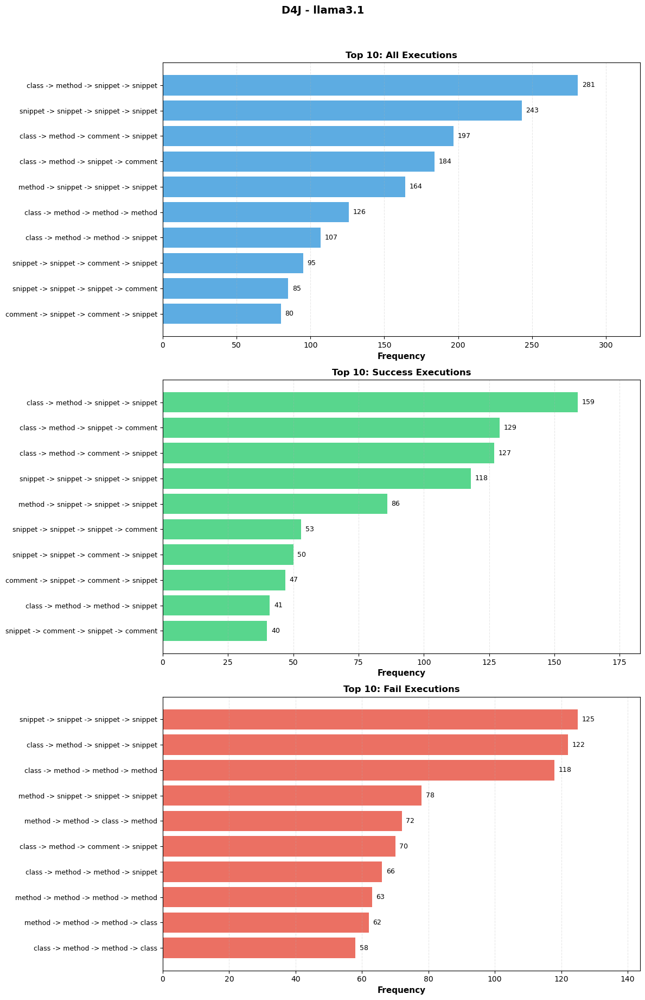


Benchmark: d4j | Model: mistral-nemo


Total 4-grams collected: 753

Total 4-grams from successful executions: 330

Total 4-grams from failed executions: 423


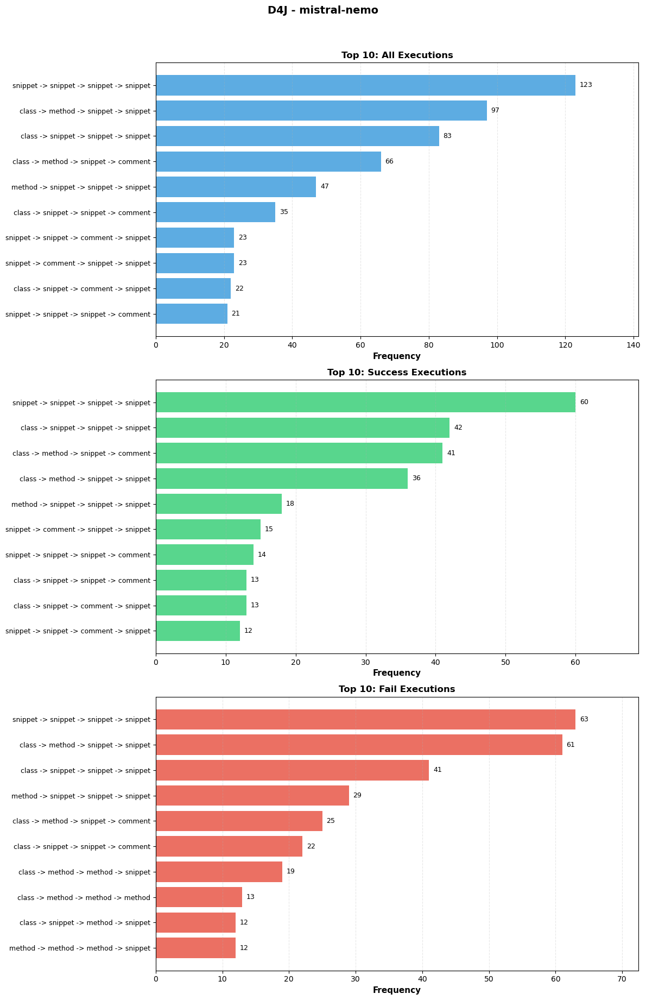


Benchmark: d4j | Model: qwen2.5-coder


Total 4-grams collected: 957

Total 4-grams from successful executions: 503

Total 4-grams from failed executions: 454


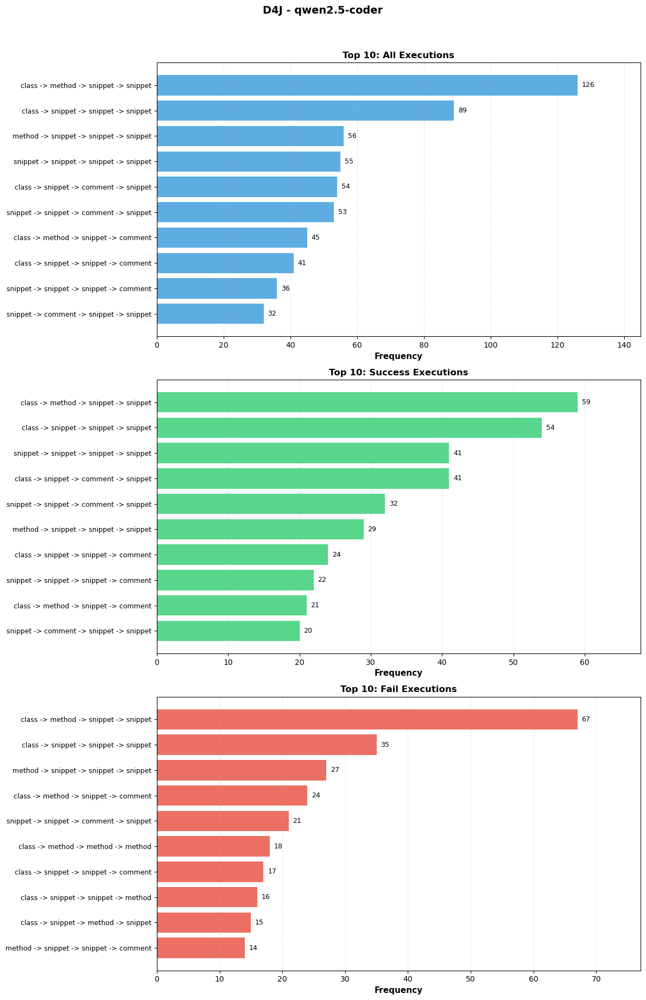


Benchmark: bip | Model: llama3


Total 4-grams collected: 2410

Total 4-grams from successful executions: 1152

Total 4-grams from failed executions: 1258


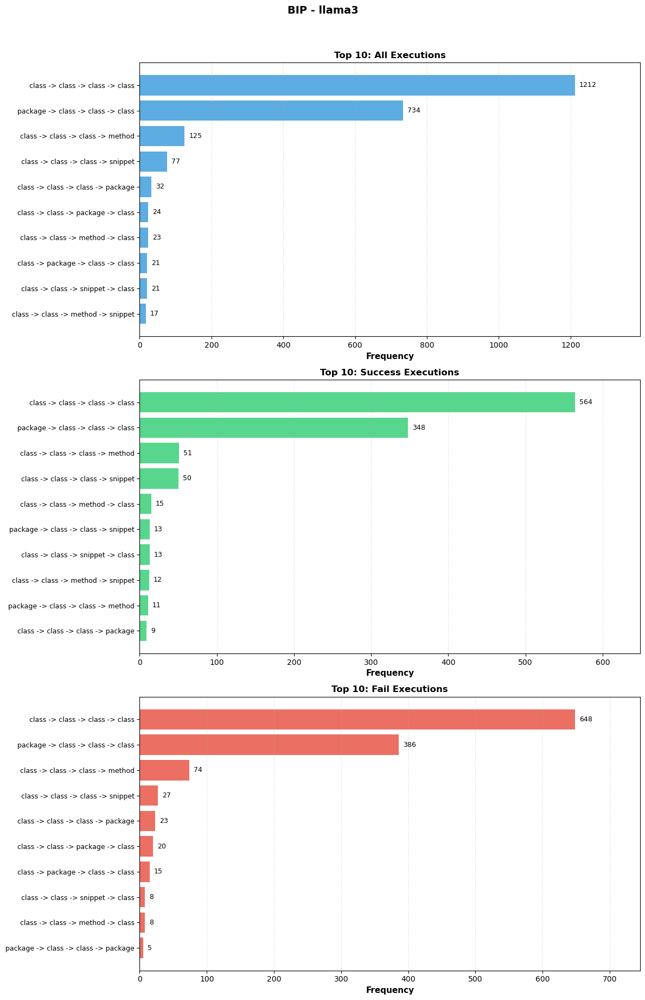


Benchmark: bip | Model: llama3.1


Total 4-grams collected: 6364

Total 4-grams from successful executions: 2662

Total 4-grams from failed executions: 3702


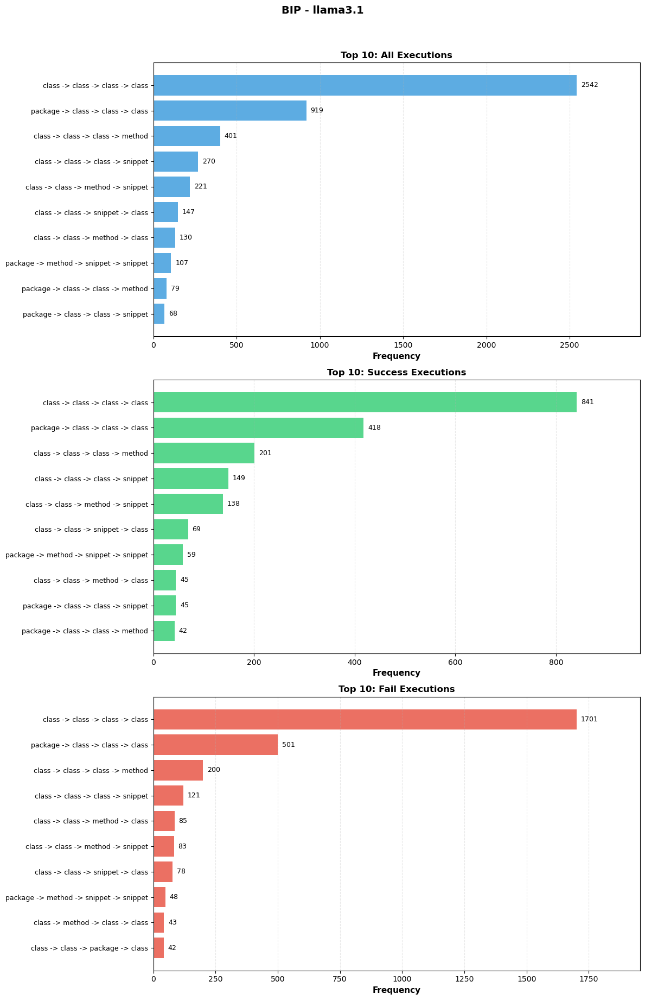


Benchmark: bip | Model: mistral-nemo


Total 4-grams collected: 1121

Total 4-grams from successful executions: 441

Total 4-grams from failed executions: 680


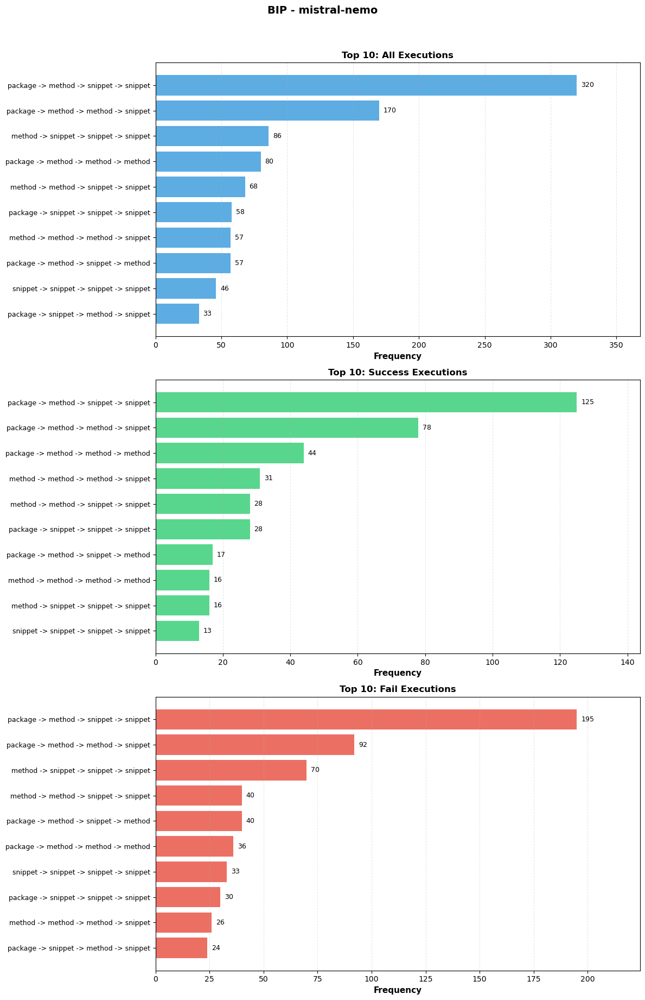


Benchmark: bip | Model: qwen2.5-coder


Total 4-grams collected: 854

Total 4-grams from successful executions: 370

Total 4-grams from failed executions: 484


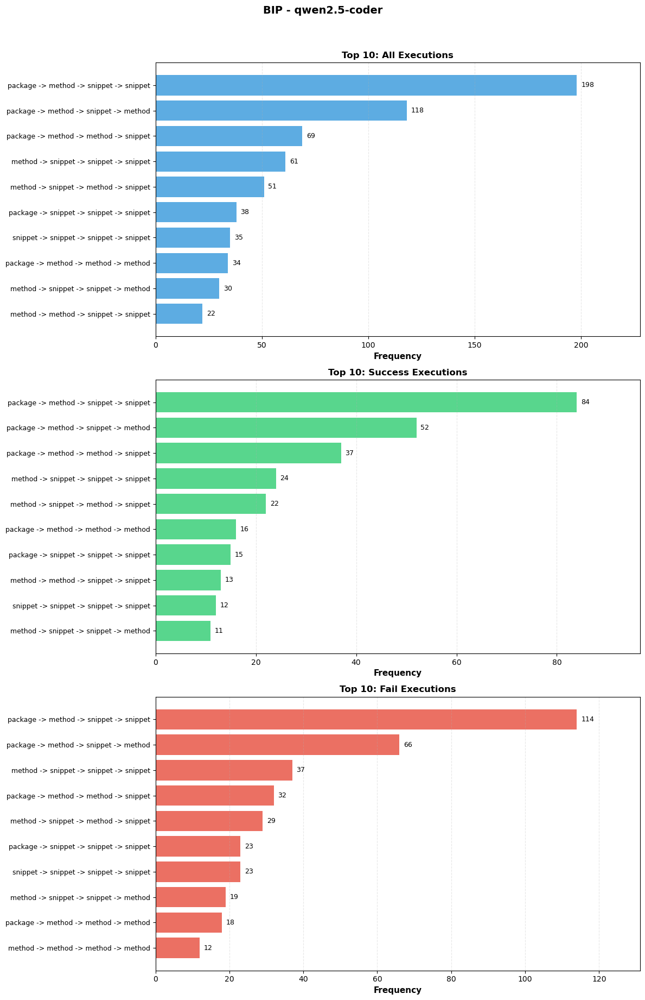

In [22]:
# Visualize Top 10 patterns separately for all/success/fail executions

import matplotlib.pyplot as plt
import numpy as np

# Function name mapping for readability
name_mapping = {
    'get_covered_packages': 'package',
    'get_failing_tests_covered_classes': 'class',
    'get_failing_tests_covered_methods_for_class': 'method',
    'get_code_snippet': 'snippet',
    'get_comments': 'comment'
}

def shorten_pattern(pattern_tuple):
    """Convert long function names to short versions"""
    return ' -> '.join([name_mapping.get(func, func) for func in pattern_tuple])

# For each benchmark and model combination
n=4
benchmarks = ['d4j', 'bip']
models = ['llama3', 'llama3.1', 'mistral-nemo', 'qwen2.5-coder']

for bm in benchmarks:
    for model in models:
        print(f"\n{'='*100}")
        print(f"Benchmark: {bm} | Model: {model}")
        print(f"{'='*100}\n")
        
        # Load the three counters
        all_ngrams, success_ngrams, fail_ngrams = get_ngrams_for_executions(bm, model, n)
        
        all_counter = Counter(all_ngrams)
        success_counter = Counter(success_ngrams)
        fail_counter = Counter(fail_ngrams)
        
        # Get top 10 from each counter
        top_10_all = [(shorten_pattern(pattern), count) for pattern, count in all_counter.most_common(10)]
        top_10_success = [(shorten_pattern(pattern), count) for pattern, count in success_counter.most_common(10)]
        top_10_fail = [(shorten_pattern(pattern), count) for pattern, count in fail_counter.most_common(10)]
        
        # Create 3 subplots
        fig, axes = plt.subplots(3, 1, figsize=(12, 18))
        
        # Plot 1: All Executions
        patterns_all = [p[0] for p in top_10_all]
        counts_all = [p[1] for p in top_10_all]
        
        axes[0].barh(range(len(patterns_all)), counts_all, color='#3498db', alpha=0.8)
        axes[0].set_yticks(range(len(patterns_all)))
        axes[0].set_yticklabels(patterns_all, fontsize=9)
        axes[0].set_xlabel('Frequency', fontsize=11, fontweight='bold')
        axes[0].set_title('Top 10: All Executions', fontsize=12, fontweight='bold')
        axes[0].invert_yaxis()
        axes[0].grid(axis='x', alpha=0.3, linestyle='--')

        axes[0].set_xlim(0, max(counts_all)*1.15)
        
        # Add value labels
        for i, v in enumerate(counts_all):
            axes[0].text(v + max(counts_all)*0.01, i, str(v), va='center', fontsize=9)
        
        # Plot 2: Success Executions
        patterns_success = [p[0] for p in top_10_success]
        counts_success = [p[1] for p in top_10_success]
        
        axes[1].barh(range(len(patterns_success)), counts_success, color='#2ecc71', alpha=0.8)
        axes[1].set_yticks(range(len(patterns_success)))
        axes[1].set_yticklabels(patterns_success, fontsize=9)
        axes[1].set_xlabel('Frequency', fontsize=11, fontweight='bold')
        axes[1].set_title('Top 10: Success Executions', fontsize=12, fontweight='bold')
        axes[1].invert_yaxis()
        axes[1].grid(axis='x', alpha=0.3, linestyle='--')

        axes[1].set_xlim(0, max(counts_success)*1.15)
        
        # Add value labels
        for i, v in enumerate(counts_success):
            axes[1].text(v + max(counts_success)*0.01, i, str(v), va='center', fontsize=9)
        
        # Plot 3: Fail Executions
        patterns_fail = [p[0] for p in top_10_fail]
        counts_fail = [p[1] for p in top_10_fail]
        
        axes[2].barh(range(len(patterns_fail)), counts_fail, color='#e74c3c', alpha=0.8)
        axes[2].set_yticks(range(len(patterns_fail)))
        axes[2].set_yticklabels(patterns_fail, fontsize=9)
        axes[2].set_xlabel('Frequency', fontsize=11, fontweight='bold')
        axes[2].set_title('Top 10: Fail Executions', fontsize=12, fontweight='bold')
        axes[2].invert_yaxis()
        axes[2].grid(axis='x', alpha=0.3, linestyle='--')

        axes[2].set_xlim(0, max(counts_fail)*1.15)
        
        # Add value labels
        for i, v in enumerate(counts_fail):
            axes[2].text(v + max(counts_fail)*0.01, i, str(v), va='center', fontsize=9)
        
        # Overall title
        fig.suptitle(f'{bm.upper()} - {model}', fontsize=14, fontweight='bold', y=1.02)
        
        plt.tight_layout()
        plt.show()

### 3-gram

In [23]:
# Get n-gram: frequencies for all benchmarks and models
n = 3
benchmarks = ['d4j', 'bip']
models = ['llama3', 'llama3.1', 'mistral-nemo', 'qwen2.5-coder']

for bm in benchmarks:
    for model in models:
        all_ngrams, all_success_ngrams, all_fail_ngrams = get_ngrams_for_executions(bm, model, n)

        all_counter = Counter(all_ngrams)
        success_counter = Counter(all_success_ngrams)
        fail_counter = Counter(all_fail_ngrams)

        all_results = []
        success_results = []
        fail_results = []
        for ngram, count in all_counter.most_common():
            all_results.append({
                f'{n}gram': ngram,
                'frequency': count
            })
        for ngram, count in success_counter.most_common():
            success_results.append({
                f'{n}gram': ngram,
                'frequency': count
            })
        for ngram, count in fail_counter.most_common():
            fail_results.append({
                f'{n}gram': ngram,
                'frequency': count
            })
            
        
        all_df = pd.DataFrame(all_results)
        success_df = pd.DataFrame(success_results)
        fail_df = pd.DataFrame(fail_results)

        output_dir = f"./{n}gram_frequency/autofl/all_executions"
        os.makedirs(output_dir, exist_ok=True)
        output_file = os.path.join(output_dir, f"{bm}_{model}_{n}gram_frequencies.csv")
        all_df.to_csv(output_file, index=False)
        print(f"Saved {output_file} with {len(all_df)} unique {n}-gram")

        output_dir = f"./{n}gram_frequency/autofl/success_executions"
        os.makedirs(output_dir, exist_ok=True)
        output_file = os.path.join(output_dir, f"{bm}_{model}_{n}gram_frequencies.csv")
        success_df.to_csv(output_file, index=False)
        print(f"Saved {output_file} with {len(success_df)} unique {n}-gram")

        output_dir = f"./{n}gram_frequency/autofl/fail_executions"
        os.makedirs(output_dir, exist_ok=True)
        output_file = os.path.join(output_dir, f"{bm}_{model}_{n}gram_frequencies.csv")
        fail_df.to_csv(output_file, index=False)
        print(f"Saved {output_file} with {len(fail_df)} unique {n}-gram")





Total 3-grams collected: 2948

Total 3-grams from successful executions: 1609

Total 3-grams from failed executions: 1339
Saved ./3gram_frequency/autofl/all_executions/d4j_llama3_3gram_frequencies.csv with 57 unique 3-gram
Saved ./3gram_frequency/autofl/success_executions/d4j_llama3_3gram_frequencies.csv with 53 unique 3-gram
Saved ./3gram_frequency/autofl/fail_executions/d4j_llama3_3gram_frequencies.csv with 52 unique 3-gram

Total 3-grams collected: 5521

Total 3-grams from successful executions: 2497

Total 3-grams from failed executions: 3024
Saved ./3gram_frequency/autofl/all_executions/d4j_llama3.1_3gram_frequencies.csv with 62 unique 3-gram
Saved ./3gram_frequency/autofl/success_executions/d4j_llama3.1_3gram_frequencies.csv with 59 unique 3-gram
Saved ./3gram_frequency/autofl/fail_executions/d4j_llama3.1_3gram_frequencies.csv with 61 unique 3-gram

Total 3-grams collected: 1751

Total 3-grams from successful executions: 826

Total 3-grams from failed executions: 925
Saved ./3gr


Benchmark: d4j | Model: llama3


Total 3-grams collected: 2948

Total 3-grams from successful executions: 1609

Total 3-grams from failed executions: 1339
                      pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
   class -> method -> snippet             965                 529              436         54.8%      45.2%
 method -> snippet -> comment             281                 186               95         66.2%      33.8%
 method -> snippet -> snippet             219                 136               83         62.1%      37.9%
    class -> method -> method             182                  75              107         41.2%      58.8%
   method -> method -> method             119                  47               72         39.5%      60.5%
snippet -> snippet -> snippet             110                  81               29         73.6%      26.4%
  method -> method -> snippet              96                  55               41      

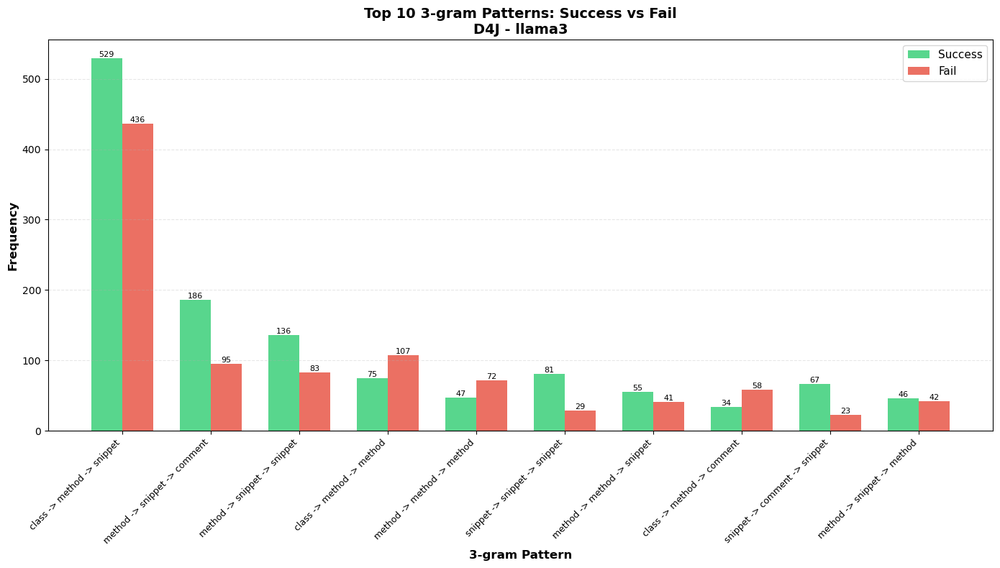


Benchmark: d4j | Model: llama3.1


Total 3-grams collected: 5521

Total 3-grams from successful executions: 2497

Total 3-grams from failed executions: 3024
                      pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
   class -> method -> snippet             882                 537              345         60.9%      39.1%
snippet -> snippet -> snippet             447                 227              220         50.8%      49.2%
 method -> snippet -> snippet             361                 193              168         53.5%      46.5%
    class -> method -> method             332                  71              261         21.4%      78.6%
   class -> method -> comment             306                 195              111         63.7%      36.3%
 method -> comment -> snippet             242                 152               90         62.8%      37.2%
snippet -> comment -> snippet             230                 132               98    

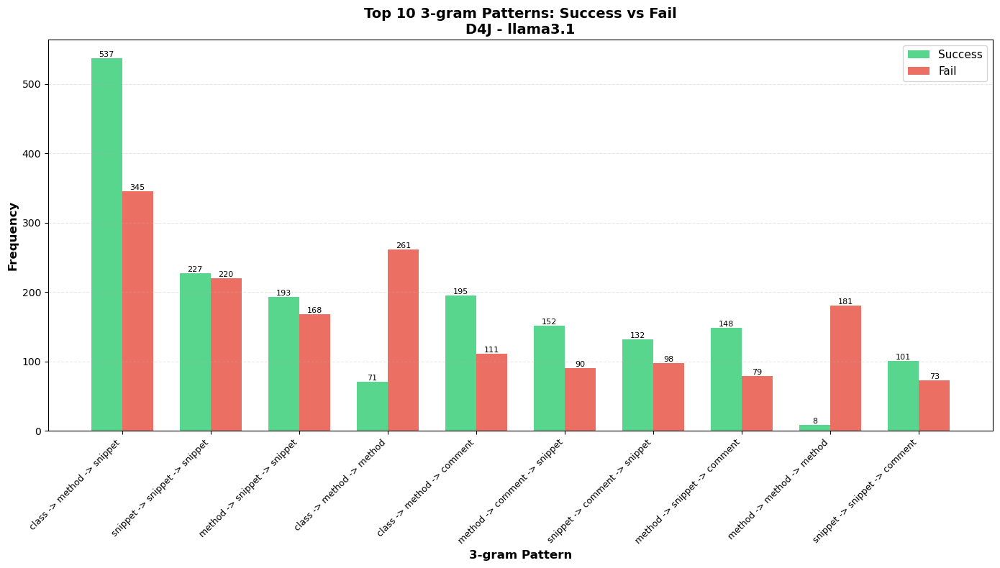


Benchmark: d4j | Model: mistral-nemo


Total 3-grams collected: 1751

Total 3-grams from successful executions: 826

Total 3-grams from failed executions: 925
                      pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
   class -> method -> snippet             490                 247              243         50.4%      49.6%
snippet -> snippet -> snippet             261                 125              136         47.9%      52.1%
  class -> snippet -> comment             215                 139               76         64.7%      35.3%
  class -> snippet -> snippet             214                  92              122         43.0%      57.0%
 method -> snippet -> snippet             118                  39               79         33.1%      66.9%
snippet -> snippet -> comment              71                  32               39         45.1%      54.9%
 method -> snippet -> comment              67                  41               26  

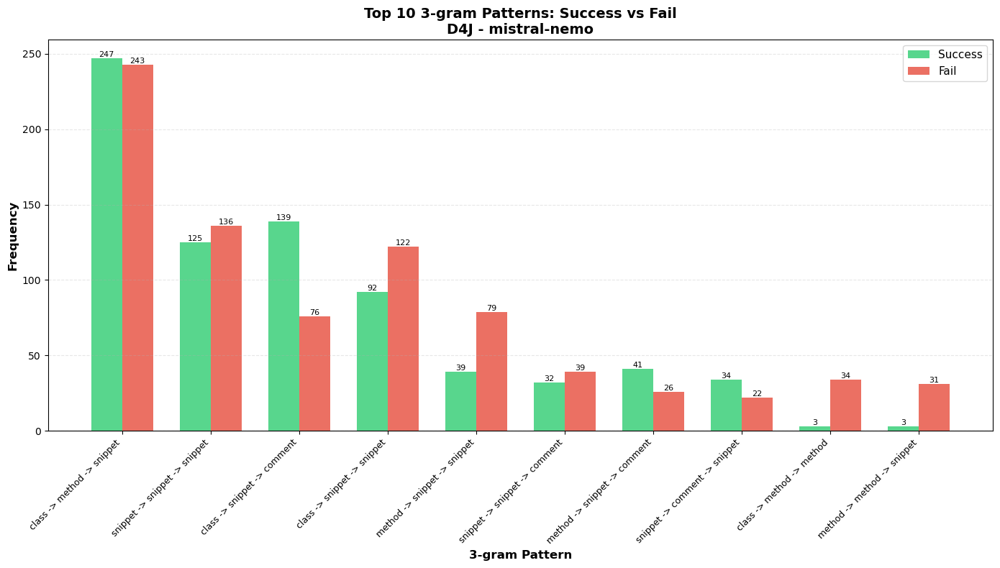


Benchmark: d4j | Model: qwen2.5-coder


Total 3-grams collected: 1893

Total 3-grams from successful executions: 975

Total 3-grams from failed executions: 918
                      pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
   class -> method -> snippet             370                 150              220         40.5%      59.5%
  class -> snippet -> snippet             258                 143              115         55.4%      44.6%
snippet -> snippet -> snippet             211                 131               80         62.1%      37.9%
  class -> snippet -> comment             191                 143               48         74.9%      25.1%
 method -> snippet -> snippet             146                  68               78         46.6%      53.4%
snippet -> comment -> snippet             119                  79               40         66.4%      33.6%
snippet -> snippet -> comment              98                  53               45 

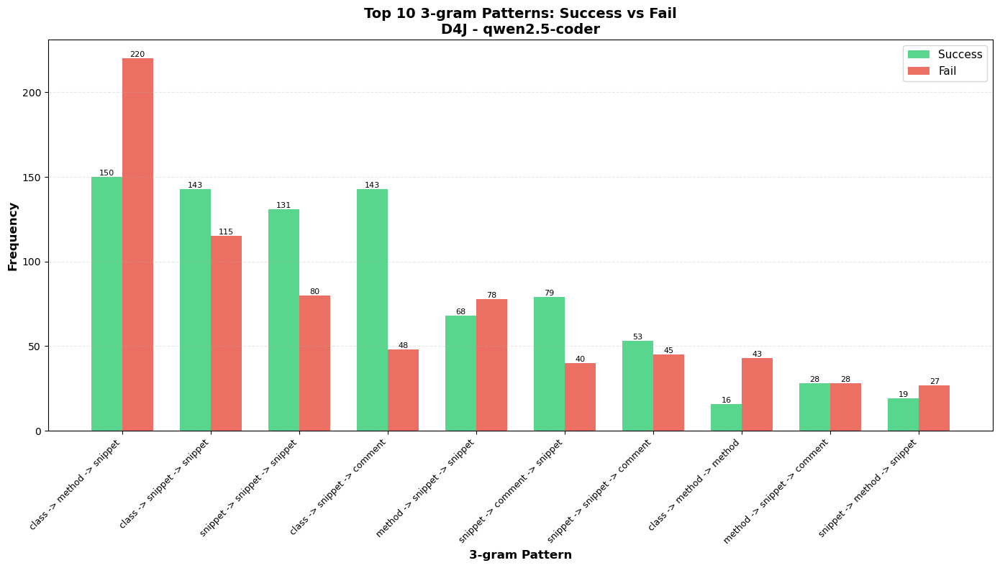


Benchmark: bip | Model: llama3


Total 3-grams collected: 3286

Total 3-grams from successful executions: 1593

Total 3-grams from failed executions: 1693
                   pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
   class -> class -> class            1947                 913             1034         46.9%      53.1%
 package -> class -> class             847                 411              436         48.5%      51.5%
  class -> class -> method             140                  62               78         44.3%      55.7%
 class -> class -> snippet              97                  67               30         69.1%      30.9%
 class -> class -> package              41                  12               29         29.3%      70.7%
 class -> package -> class              31                   8               23         25.8%      74.2%
  class -> method -> class              26                  18                8         69.2%      30.8%
 cla

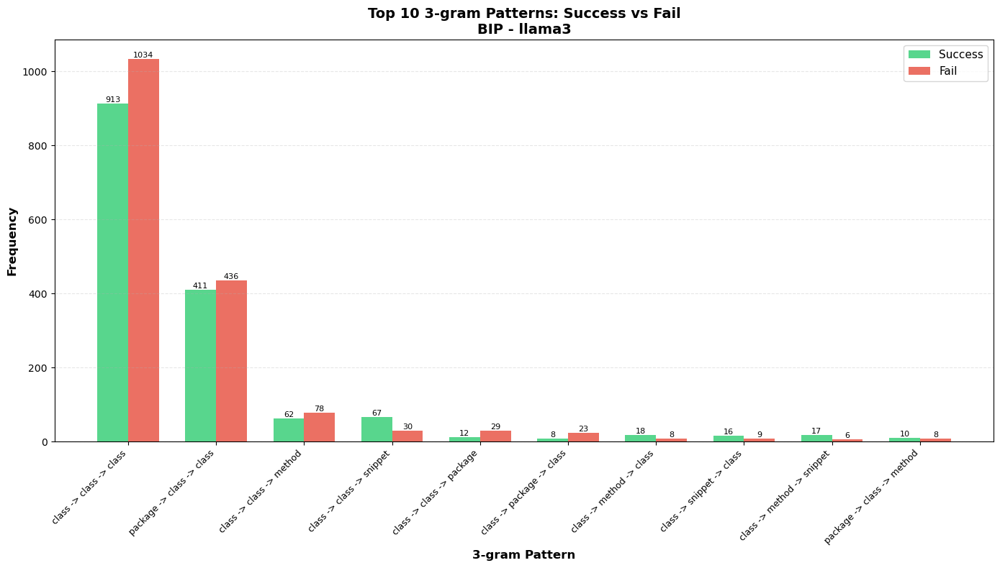


Benchmark: bip | Model: llama3.1


Total 3-grams collected: 8137

Total 3-grams from successful executions: 3597

Total 3-grams from failed executions: 4540
                     pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
     class -> class -> class            3527                1282             2245         36.3%      63.7%
   package -> class -> class            1122                 529              593         47.1%      52.9%
    class -> class -> method             493                 251              242         50.9%      49.1%
package -> method -> snippet             395                 246              149         62.3%      37.7%
   class -> class -> snippet             389                 215              174         55.3%      44.7%
  class -> method -> snippet             257                 157              100         61.1%      38.9%
   class -> snippet -> class             180                  80              100         44.

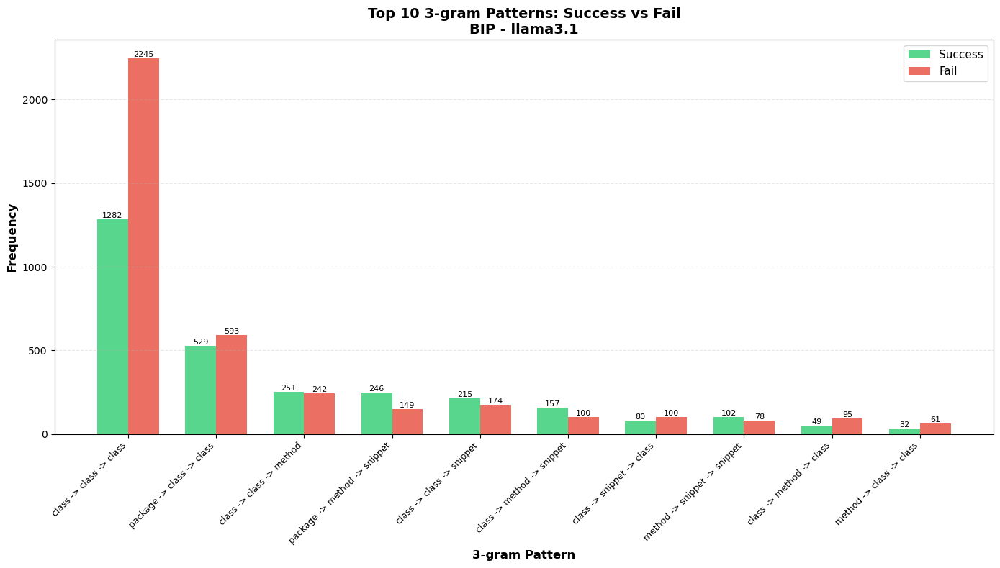


Benchmark: bip | Model: mistral-nemo


Total 3-grams collected: 3020

Total 3-grams from successful executions: 1384

Total 3-grams from failed executions: 1636
                      pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
 package -> method -> snippet            1351                 683              668         50.6%      49.4%
 method -> snippet -> snippet             397                 154              243         38.8%      61.2%
  package -> method -> method             318                 151              167         47.5%      52.5%
  method -> method -> snippet             235                 111              124         47.2%      52.8%
snippet -> snippet -> snippet             190                  57              133         30.0%      70.0%
package -> snippet -> snippet             173                  92               81         53.2%      46.8%
   method -> method -> method             103                  60               43

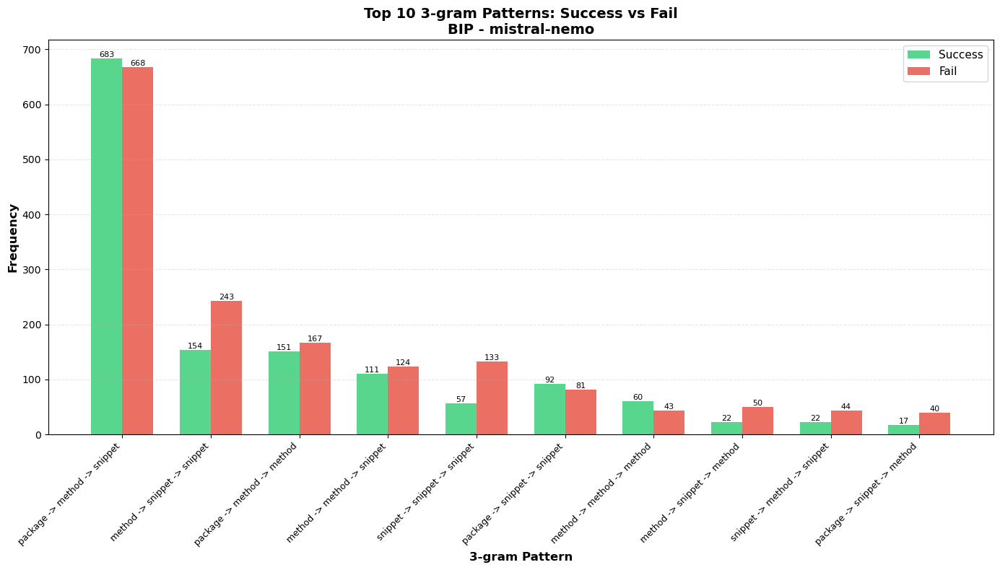


Benchmark: bip | Model: qwen2.5-coder


Total 3-grams collected: 2081

Total 3-grams from successful executions: 995

Total 3-grams from failed executions: 1086
                      pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
 package -> method -> snippet             846                 436              410         51.5%      48.5%
 method -> snippet -> snippet             227                 100              127         44.1%      55.9%
  package -> method -> method             150                  70               80         46.7%      53.3%
  method -> snippet -> method             144                  63               81         43.8%      56.2%
snippet -> snippet -> snippet             134                  51               83         38.1%      61.9%
package -> snippet -> snippet             134                  70               64         52.2%      47.8%
  method -> method -> snippet              92                  51               41

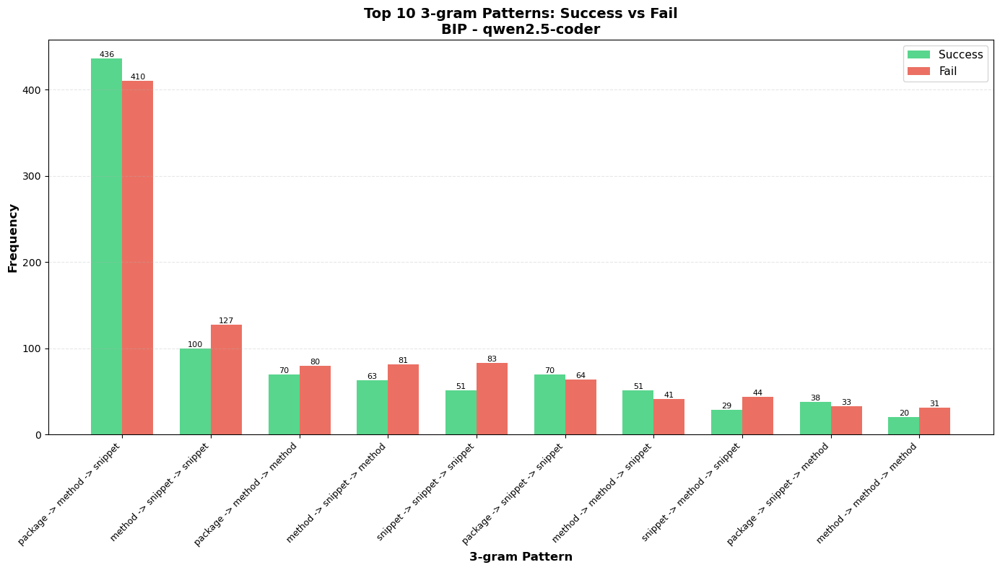

In [24]:
# Compare top 10 most frequent n-grams in all executions vs success/fail executions

import matplotlib.pyplot as plt
import numpy as np

# Function name mapping for readability
name_mapping = {
    'get_covered_packages': 'package',
    'get_failing_tests_covered_classes': 'class',
    'get_failing_tests_covered_methods_for_class': 'method',
    'get_code_snippet': 'snippet',
    'get_comments': 'comment'
}

def shorten_pattern(pattern_tuple):
    """Convert long function names to short versions"""
    return ' -> '.join([name_mapping.get(func, func) for func in pattern_tuple])

# For each benchmark and model combination
n=3
benchmarks = ['d4j', 'bip']
models = ['llama3', 'llama3.1', 'mistral-nemo', 'qwen2.5-coder']

for bm in benchmarks:
    for model in models:
        print(f"\n{'='*100}")
        print(f"Benchmark: {bm} | Model: {model}")
        print(f"{'='*100}\n")
        
        # Load the three counters
        all_ngrams, success_ngrams, fail_ngrams = get_ngrams_for_executions(bm, model, n)
        
        all_counter = Counter(all_ngrams)
        success_counter = Counter(success_ngrams)
        fail_counter = Counter(fail_ngrams)
        
        # Get top 10 from all executions
        top_10_patterns = [pattern for pattern, count in all_counter.most_common(10)]
        
        # Create comparison table
        comparison_data = []
        for pattern in top_10_patterns:
            all_count = all_counter[pattern]
            success_count = success_counter[pattern]
            fail_count = fail_counter[pattern]
            
            comparison_data.append({
                'pattern': shorten_pattern(pattern),
                'all_executions': all_count,
                'success_executions': success_count,
                'fail_executions': fail_count,
                'success_ratio': f"{success_count/all_count*100:.1f}%" if all_count > 0 else "0%",
                'fail_ratio': f"{fail_count/all_count*100:.1f}%" if all_count > 0 else "0%"
            })
        
        # Display as DataFrame
        comparison_df = pd.DataFrame(comparison_data)
        print(comparison_df.to_string(index=False))
        print()
        
        # Create bar chart
        fig, ax = plt.subplots(figsize=(14, 8))
        
        patterns = comparison_df['pattern'].tolist()
        success_counts = comparison_df['success_executions'].tolist()
        fail_counts = comparison_df['fail_executions'].tolist()
        
        x = np.arange(len(patterns))
        width = 0.35
        
        bars1 = ax.bar(x - width/2, success_counts, width, label='Success', color='#2ecc71', alpha=0.8)
        bars2 = ax.bar(x + width/2, fail_counts, width, label='Fail', color='#e74c3c', alpha=0.8)
        
        ax.set_xlabel(f'{n}-gram Pattern', fontsize=12, fontweight='bold')
        ax.set_ylabel('Frequency', fontsize=12, fontweight='bold')
        ax.set_title(f'Top 10 {n}-gram Patterns: Success vs Fail\n{bm.upper()} - {model}', fontsize=14, fontweight='bold')
        ax.set_xticks(x)
        ax.set_xticklabels(patterns, rotation=45, ha='right', fontsize=9)
        ax.legend(fontsize=11)
        ax.grid(axis='y', alpha=0.3, linestyle='--')
        
        # Add value labels on bars
        for bars in [bars1, bars2]:
            for bar in bars:
                height = bar.get_height()
                if height > 0:
                    ax.text(bar.get_x() + bar.get_width()/2., height,
                           f'{int(height)}',
                           ha='center', va='bottom', fontsize=8)
        
        plt.tight_layout()
        plt.show()


Benchmark: d4j | Model: llama3


Total 3-grams collected: 2948

Total 3-grams from successful executions: 1609

Total 3-grams from failed executions: 1339


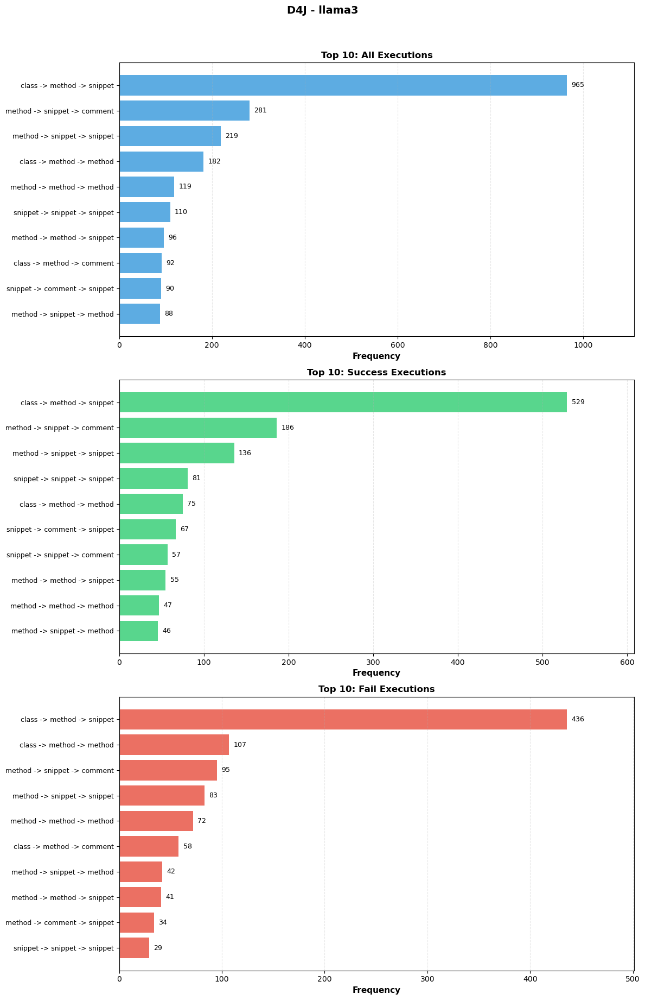


Benchmark: d4j | Model: llama3.1


Total 3-grams collected: 5521

Total 3-grams from successful executions: 2497

Total 3-grams from failed executions: 3024


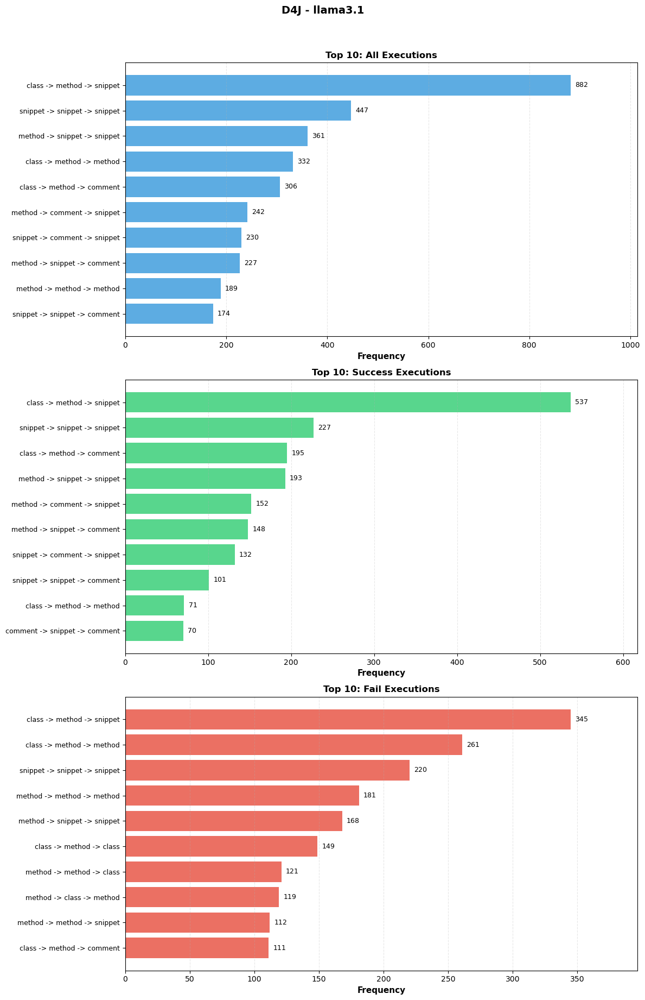


Benchmark: d4j | Model: mistral-nemo


Total 3-grams collected: 1751

Total 3-grams from successful executions: 826

Total 3-grams from failed executions: 925


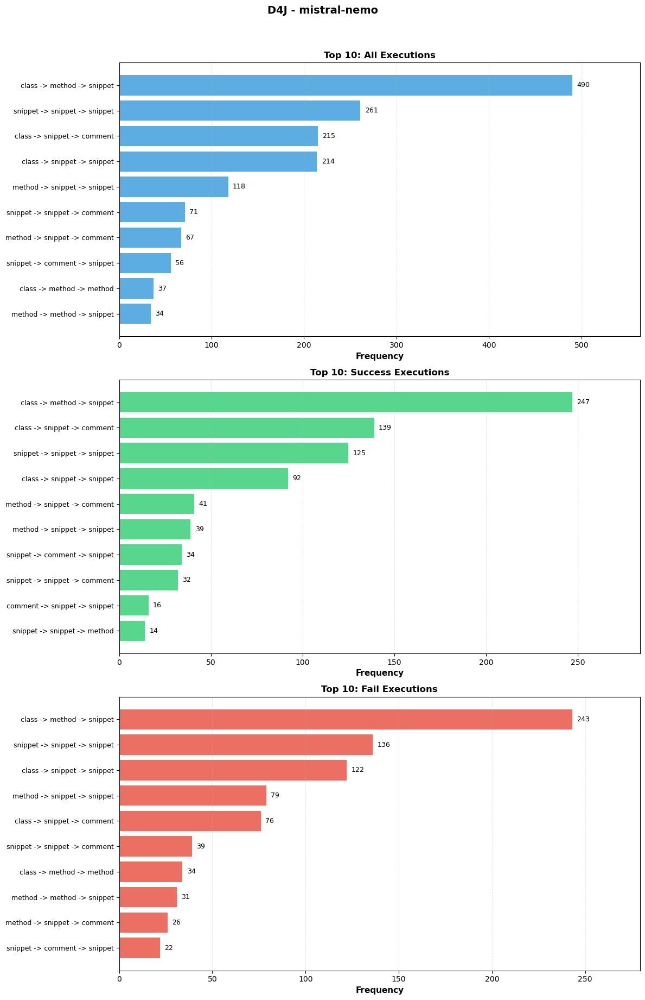


Benchmark: d4j | Model: qwen2.5-coder


Total 3-grams collected: 1893

Total 3-grams from successful executions: 975

Total 3-grams from failed executions: 918


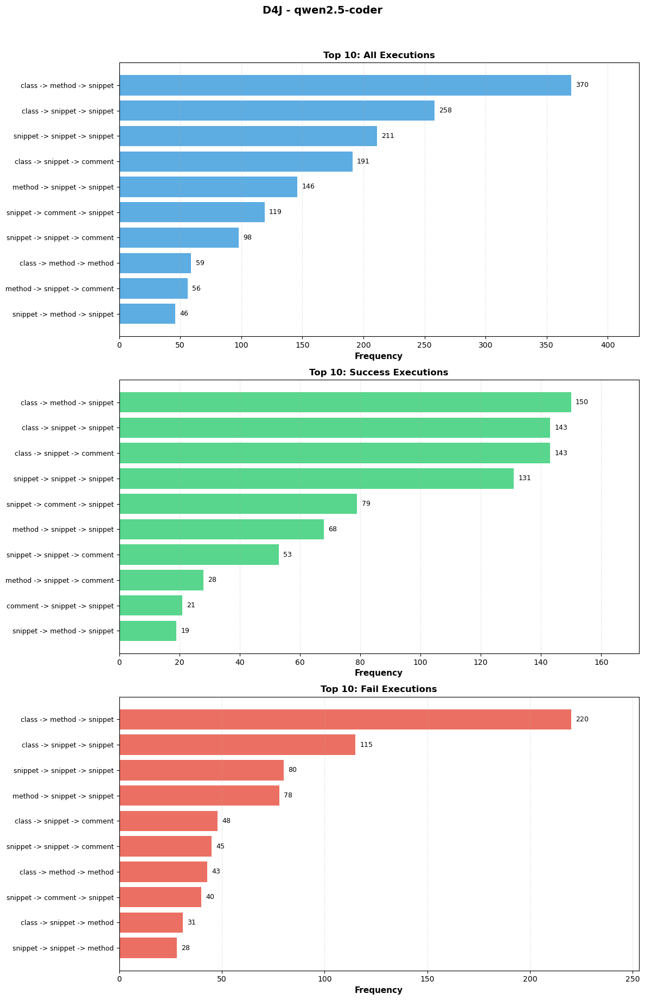


Benchmark: bip | Model: llama3


Total 3-grams collected: 3286

Total 3-grams from successful executions: 1593

Total 3-grams from failed executions: 1693


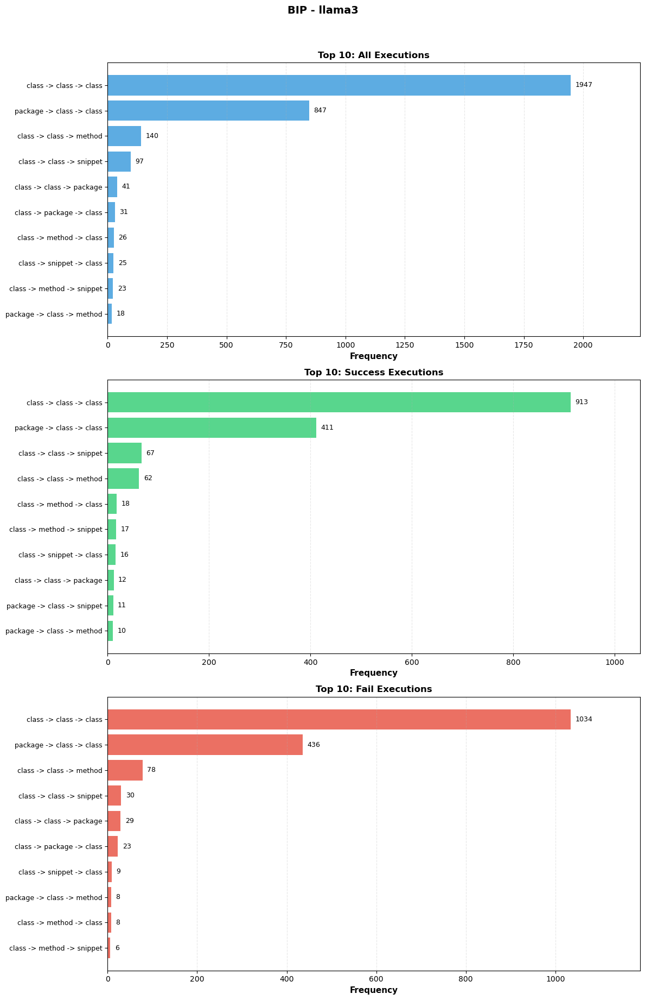


Benchmark: bip | Model: llama3.1


Total 3-grams collected: 8137

Total 3-grams from successful executions: 3597

Total 3-grams from failed executions: 4540


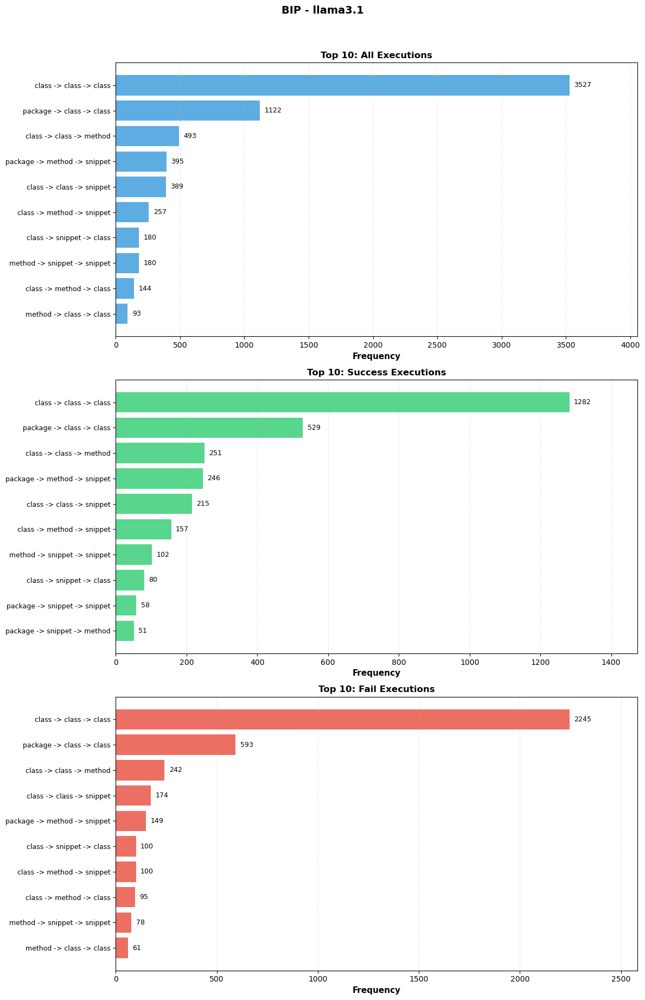


Benchmark: bip | Model: mistral-nemo


Total 3-grams collected: 3020

Total 3-grams from successful executions: 1384

Total 3-grams from failed executions: 1636


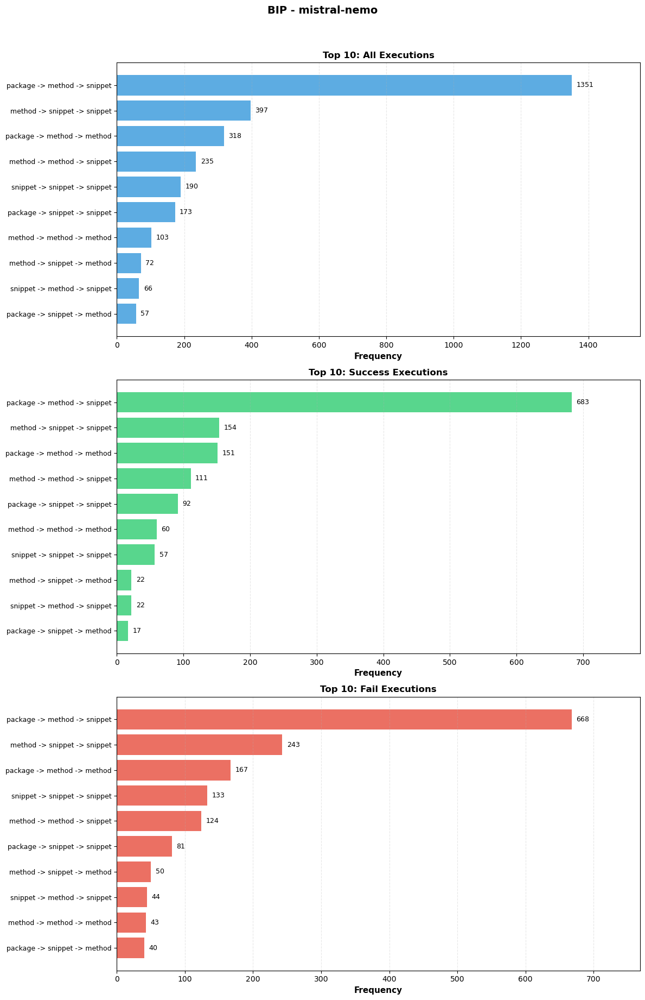


Benchmark: bip | Model: qwen2.5-coder


Total 3-grams collected: 2081

Total 3-grams from successful executions: 995

Total 3-grams from failed executions: 1086


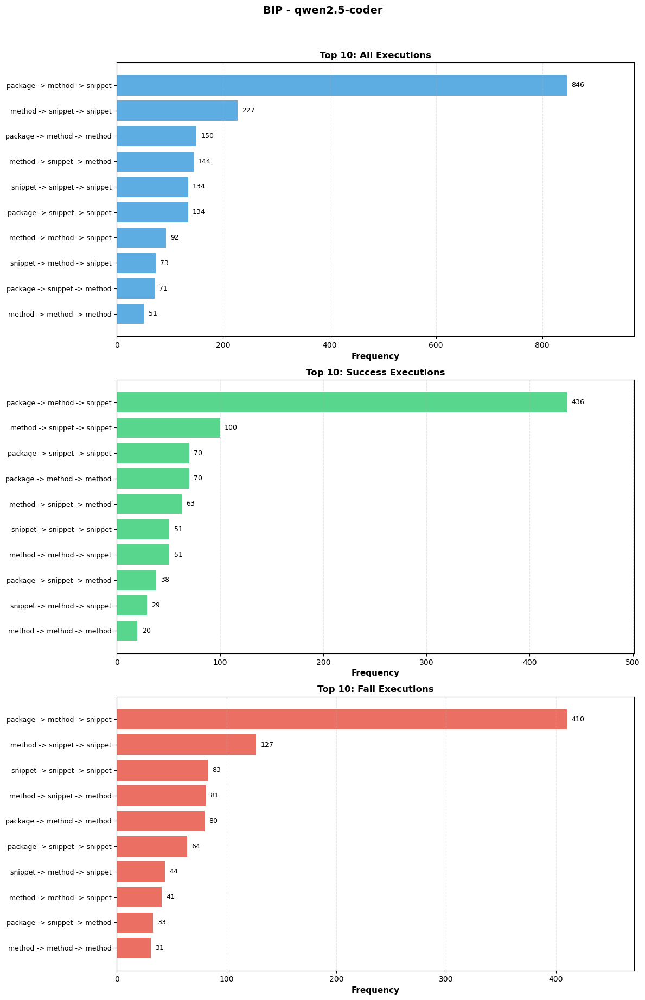

In [25]:
# Visualize Top 10 patterns separately for all/success/fail executions

import matplotlib.pyplot as plt
import numpy as np

# Function name mapping for readability
name_mapping = {
    'get_covered_packages': 'package',
    'get_failing_tests_covered_classes': 'class',
    'get_failing_tests_covered_methods_for_class': 'method',
    'get_code_snippet': 'snippet',
    'get_comments': 'comment'
}

def shorten_pattern(pattern_tuple):
    """Convert long function names to short versions"""
    return ' -> '.join([name_mapping.get(func, func) for func in pattern_tuple])

# For each benchmark and model combination
n=3
benchmarks = ['d4j', 'bip']
models = ['llama3', 'llama3.1', 'mistral-nemo', 'qwen2.5-coder']

for bm in benchmarks:
    for model in models:
        print(f"\n{'='*100}")
        print(f"Benchmark: {bm} | Model: {model}")
        print(f"{'='*100}\n")
        
        # Load the three counters
        all_ngrams, success_ngrams, fail_ngrams = get_ngrams_for_executions(bm, model, n)
        
        all_counter = Counter(all_ngrams)
        success_counter = Counter(success_ngrams)
        fail_counter = Counter(fail_ngrams)
        
        # Get top 10 from each counter
        top_10_all = [(shorten_pattern(pattern), count) for pattern, count in all_counter.most_common(10)]
        top_10_success = [(shorten_pattern(pattern), count) for pattern, count in success_counter.most_common(10)]
        top_10_fail = [(shorten_pattern(pattern), count) for pattern, count in fail_counter.most_common(10)]
        
        # Create 3 subplots
        fig, axes = plt.subplots(3, 1, figsize=(12, 18))
        
        # Plot 1: All Executions
        patterns_all = [p[0] for p in top_10_all]
        counts_all = [p[1] for p in top_10_all]
        
        axes[0].barh(range(len(patterns_all)), counts_all, color='#3498db', alpha=0.8)
        axes[0].set_yticks(range(len(patterns_all)))
        axes[0].set_yticklabels(patterns_all, fontsize=9)
        axes[0].set_xlabel('Frequency', fontsize=11, fontweight='bold')
        axes[0].set_title('Top 10: All Executions', fontsize=12, fontweight='bold')
        axes[0].invert_yaxis()
        axes[0].grid(axis='x', alpha=0.3, linestyle='--')

        axes[0].set_xlim(0, max(counts_all)*1.15)
        
        # Add value labels
        for i, v in enumerate(counts_all):
            axes[0].text(v + max(counts_all)*0.01, i, str(v), va='center', fontsize=9)
        
        # Plot 2: Success Executions
        patterns_success = [p[0] for p in top_10_success]
        counts_success = [p[1] for p in top_10_success]
        
        axes[1].barh(range(len(patterns_success)), counts_success, color='#2ecc71', alpha=0.8)
        axes[1].set_yticks(range(len(patterns_success)))
        axes[1].set_yticklabels(patterns_success, fontsize=9)
        axes[1].set_xlabel('Frequency', fontsize=11, fontweight='bold')
        axes[1].set_title('Top 10: Success Executions', fontsize=12, fontweight='bold')
        axes[1].invert_yaxis()
        axes[1].grid(axis='x', alpha=0.3, linestyle='--')

        axes[1].set_xlim(0, max(counts_success)*1.15)
        
        # Add value labels
        for i, v in enumerate(counts_success):
            axes[1].text(v + max(counts_success)*0.01, i, str(v), va='center', fontsize=9)
        
        # Plot 3: Fail Executions
        patterns_fail = [p[0] for p in top_10_fail]
        counts_fail = [p[1] for p in top_10_fail]
        
        axes[2].barh(range(len(patterns_fail)), counts_fail, color='#e74c3c', alpha=0.8)
        axes[2].set_yticks(range(len(patterns_fail)))
        axes[2].set_yticklabels(patterns_fail, fontsize=9)
        axes[2].set_xlabel('Frequency', fontsize=11, fontweight='bold')
        axes[2].set_title('Top 10: Fail Executions', fontsize=12, fontweight='bold')
        axes[2].invert_yaxis()
        axes[2].grid(axis='x', alpha=0.3, linestyle='--')

        axes[2].set_xlim(0, max(counts_fail)*1.15)
        
        # Add value labels
        for i, v in enumerate(counts_fail):
            axes[2].text(v + max(counts_fail)*0.01, i, str(v), va='center', fontsize=9)
        
        # Overall title
        fig.suptitle(f'{bm.upper()} - {model}', fontsize=14, fontweight='bold', y=1.02)
        
        plt.tight_layout()
        plt.show()

### Correaltion

In [ ]:
n=5
benchmarks = ['d4j', 'bip']
models = ['llama3', 'llama3.1', 'mistral-nemo', 'qwen2.5-coder']

for bm in benchmarks:
    for model in models:
        print(f"\n{'='*100}")
        print(f"Benchmark: {bm} | Model: {model}")
        print(f"{'='*100}\n")
        
        # Load the three counters
        all_ngrams, success_ngrams, fail_ngrams = get_ngrams_for_executions(bm, model, n)
        
        all_counter = Counter(all_ngrams)
        success_counter = Counter(success_ngrams)
        fail_counter = Counter(fail_ngrams)

        top_30_all = [pattern for pattern in all_counter.most_common(30)]
        
        correlation_data = []
        for pattern, freq in top_30_all:
            success_label = []
            ngram_presence = []
            for i in range(1, 11):
                if bm == 'd4j':
                    directory_path = f'./raw_data/autofl/d4j_autofl_eol_{i}/{model}'
                elif bm == 'bip':
                    directory_path = f'./raw_data/autofl/bip_cosmosfl_{i}/{model}'
                
                for json_file in os.listdir(directory_path):
                    with open(os.path.join(directory_path, json_file), 'r') as f:
                        data = json.load(f)
                    if 'messages' in data:
                        sequence = extract_function_call_sequence(data['messages'])
                        ngrams = get_ngrams(sequence, n)
                        execution_success = get_result_of_execution(data["buggy_methods"])

                        if execution_success:
                            success_label.append(1)
                        else:
                            success_label.append(0)
                        if pattern in ngrams:
                            ngram_presence.append(1)
                        else:
                            ngram_presence.append(0)
            # print(success_label)
            # print(ngram_presence)
            correlation, p_value = pointbiserialr(success_label, ngram_presence)
            correlation_data.append({
                'pattern': pattern,
                'correlation': correlation,
                'p-value': p_value
            })

        correlation_df = pd.DataFrame(correlation_data)
        output_dir = f'./correlation/autofl/{n}-gram/{bm}/{model}'
        os.makedirs(output_dir, exist_ok=True)
        correlation_df.to_csv(os.path.join(output_dir, 'correlation.csv'), index=False)
        print(f"Saved {os.path.join(output_dir, 'correlation.csv')}")




Benchmark: d4j | Model: llama3


Total 5-grams collected: 879

Total 5-grams from successful executions: 518

Total 5-grams from failed executions: 361
Saved ./correlation/autofl/5-gram/d4j/llama3/correlation.csv

Benchmark: d4j | Model: llama3.1


Total 5-grams collected: 2705

Total 5-grams from successful executions: 1086

Total 5-grams from failed executions: 1619
Saved ./correlation/autofl/5-gram/d4j/llama3.1/correlation.csv

Benchmark: d4j | Model: mistral-nemo


Total 5-grams collected: 367

Total 5-grams from successful executions: 167

Total 5-grams from failed executions: 200
Saved ./correlation/autofl/5-gram/d4j/mistral-nemo/correlation.csv

Benchmark: d4j | Model: qwen2.5-coder


Total 5-grams collected: 470

Total 5-grams from successful executions: 256

Total 5-grams from failed executions: 214
Saved ./correlation/autofl/5-gram/d4j/qwen2.5-coder/correlation.csv

Benchmark: bip | Model: llama3


Total 5-grams collected: 1629

Total 5-grams from successful executions: 763


In [ ]:
n=4
benchmarks = ['d4j', 'bip']
models = ['llama3', 'llama3.1', 'mistral-nemo', 'qwen2.5-coder']

for bm in benchmarks:
    for model in models:
        print(f"\n{'='*100}")
        print(f"Benchmark: {bm} | Model: {model}")
        print(f"{'='*100}\n")
        
        # Load the three counters
        all_ngrams, success_ngrams, fail_ngrams = get_ngrams_for_executions(bm, model, n)
        
        all_counter = Counter(all_ngrams)
        success_counter = Counter(success_ngrams)
        fail_counter = Counter(fail_ngrams)

        top_30_all = [pattern for pattern in all_counter.most_common(30)]
        
        correlation_data = []
        for pattern, freq in top_30_all:
            success_label = []
            ngram_presence = []
            for i in range(1, 11):
                if bm == 'd4j':
                    directory_path = f'./raw_data/autofl/d4j_autofl_eol_{i}/{model}'
                elif bm == 'bip':
                    directory_path = f'./raw_data/autofl/bip_cosmosfl_{i}/{model}'
                
                for json_file in os.listdir(directory_path):
                    with open(os.path.join(directory_path, json_file), 'r') as f:
                        data = json.load(f)
                    if 'messages' in data:
                        sequence = extract_function_call_sequence(data['messages'])
                        ngrams = get_ngrams(sequence, n)
                        execution_success = get_result_of_execution(data["buggy_methods"])

                        if execution_success:
                            success_label.append(1)
                        else:
                            success_label.append(0)
                        if pattern in ngrams:
                            ngram_presence.append(1)
                        else:
                            ngram_presence.append(0)
            # print(success_label)
            # print(ngram_presence)
            correlation, p_value = pointbiserialr(success_label, ngram_presence)
            correlation_data.append({
                'pattern': pattern,
                'correlation': correlation,
                'p-value': p_value
            })

        correlation_df = pd.DataFrame(correlation_data)
        output_dir = f'./correlation/autofl/{n}-gram/{bm}/{model}'
        os.makedirs(output_dir, exist_ok=True)
        correlation_df.to_csv(os.path.join(output_dir, 'correlation.csv'), index=False)
        print(f"Saved {os.path.join(output_dir, 'correlation.csv')}")




        





Benchmark: d4j | Model: llama3


Total 4-grams collected: 1646

Total 4-grams from successful executions: 950

Total 4-grams from failed executions: 696
Saved ./correlation/autofl/4-gram/d4j/llama3/correlation.csv

Benchmark: d4j | Model: llama3.1


Total 4-grams collected: 3898

Total 4-grams from successful executions: 1663

Total 4-grams from failed executions: 2235
Saved ./correlation/autofl/4-gram/d4j/llama3.1/correlation.csv

Benchmark: d4j | Model: mistral-nemo


Total 4-grams collected: 753

Total 4-grams from successful executions: 330

Total 4-grams from failed executions: 423
Saved ./correlation/autofl/4-gram/d4j/mistral-nemo/correlation.csv

Benchmark: d4j | Model: qwen2.5-coder


Total 4-grams collected: 957

Total 4-grams from successful executions: 503

Total 4-grams from failed executions: 454
Saved ./correlation/autofl/4-gram/d4j/qwen2.5-coder/correlation.csv

Benchmark: bip | Model: llama3


Total 4-grams collected: 2410

Total 4-grams from successful executions: 115

In [6]:
n=3
benchmarks = ['d4j', 'bip']
models = ['llama3', 'llama3.1', 'mistral-nemo', 'qwen2.5-coder']

for bm in benchmarks:
    for model in models:
        print(f"\n{'='*100}")
        print(f"Benchmark: {bm} | Model: {model}")
        print(f"{'='*100}\n")
        
        # Load the three counters
        all_ngrams, success_ngrams, fail_ngrams = get_ngrams_for_executions(bm, model, n)
        
        all_counter = Counter(all_ngrams)
        success_counter = Counter(success_ngrams)
        fail_counter = Counter(fail_ngrams)

        top_30_all = [pattern for pattern in all_counter.most_common(30)]
        
        correlation_data = []
        for pattern, freq in top_30_all:
            success_label = []
            ngram_presence = []
            for i in range(1, 11):
                if bm == 'd4j':
                    directory_path = f'./raw_data/autofl/d4j_autofl_eol_{i}/{model}'
                elif bm == 'bip':
                    directory_path = f'./raw_data/autofl/bip_cosmosfl_{i}/{model}'
                
                for json_file in os.listdir(directory_path):
                    with open(os.path.join(directory_path, json_file), 'r') as f:
                        data = json.load(f)
                    if 'messages' in data:
                        sequence = extract_function_call_sequence(data['messages'])
                        ngrams = get_ngrams(sequence, n)
                        execution_success = get_result_of_execution(data["buggy_methods"])

                        if execution_success:
                            success_label.append(1)
                        else:
                            success_label.append(0)
                        if pattern in ngrams:
                            ngram_presence.append(1)
                        else:
                            ngram_presence.append(0)
            # print(success_label)
            # print(ngram_presence)
            correlation, p_value = pointbiserialr(success_label, ngram_presence)
            correlation_data.append({
                'pattern': pattern,
                'correlation': correlation,
                'p-value': p_value
            })

        correlation_df = pd.DataFrame(correlation_data)
        output_dir = f'./correlation/autofl/{n}-gram/{bm}/{model}'
        os.makedirs(output_dir, exist_ok=True)
        correlation_df.to_csv(os.path.join(output_dir, 'correlation.csv'), index=False)
        print(f"Saved {os.path.join(output_dir, 'correlation.csv')}")




        





Benchmark: d4j | Model: llama3


Total 3-grams collected: 2948

Total 3-grams from successful executions: 1609

Total 3-grams from failed executions: 1339
Saved ./correlation/autofl/3-gram/d4j/llama3/correlation.csv

Benchmark: d4j | Model: llama3.1


Total 3-grams collected: 5521

Total 3-grams from successful executions: 2497

Total 3-grams from failed executions: 3024
Saved ./correlation/autofl/3-gram/d4j/llama3.1/correlation.csv

Benchmark: d4j | Model: mistral-nemo


Total 3-grams collected: 1751

Total 3-grams from successful executions: 826

Total 3-grams from failed executions: 925
Saved ./correlation/autofl/3-gram/d4j/mistral-nemo/correlation.csv

Benchmark: d4j | Model: qwen2.5-coder


Total 3-grams collected: 1893

Total 3-grams from successful executions: 975

Total 3-grams from failed executions: 918
Saved ./correlation/autofl/3-gram/d4j/qwen2.5-coder/correlation.csv

Benchmark: bip | Model: llama3


Total 3-grams collected: 3286

Total 3-grams from successful executions:

# Over all models
### 5-gram

In [7]:
# Get n-gram: frequencies for all benchmarks and models
n = 5
benchmarks = ['d4j', 'bip']
models = ['llama3', 'llama3.1', 'mistral-nemo', 'qwen2.5-coder']

for bm in benchmarks:
    all_ngrams, all_success_ngrams, all_fail_ngrams = [], [], []
    for model in models:
        all_ngrams_from_model, all_success_ngrams_from_model, all_fail_ngrams_from_model = get_ngrams_for_executions(bm, model, n)
        all_ngrams.extend(all_ngrams_from_model)
        all_success_ngrams.extend(all_success_ngrams_from_model)
        all_fail_ngrams.extend(all_fail_ngrams_from_model)

    all_counter = Counter(all_ngrams)
    success_counter = Counter(all_success_ngrams)
    fail_counter = Counter(all_fail_ngrams)

    all_results = []
    success_results = []
    fail_results = []
    for ngram, count in all_counter.most_common():
        all_results.append({
            f'{n}gram': ngram,
            'frequency': count
        })
    for ngram, count in success_counter.most_common():
        success_results.append({
            f'{n}gram': ngram,
            'frequency': count
        })
    for ngram, count in fail_counter.most_common():
        fail_results.append({
            f'{n}gram': ngram,
            'frequency': count
        })
        
    
    all_df = pd.DataFrame(all_results)
    success_df = pd.DataFrame(success_results)
    fail_df = pd.DataFrame(fail_results)

    output_dir = f"./{n}gram_frequency/autofl/all_executions"
    os.makedirs(output_dir, exist_ok=True)
    output_file = os.path.join(output_dir, f"{bm}_{n}gram_frequencies.csv")
    all_df.to_csv(output_file, index=False)
    print(f"Saved {output_file} with {len(all_df)} unique {n}-gram")

    output_dir = f"./{n}gram_frequency/autofl/success_executions"
    os.makedirs(output_dir, exist_ok=True)
    output_file = os.path.join(output_dir, f"{bm}_{n}gram_frequencies.csv")
    success_df.to_csv(output_file, index=False)
    print(f"Saved {output_file} with {len(success_df)} unique {n}-gram")

    output_dir = f"./{n}gram_frequency/autofl/fail_executions"
    os.makedirs(output_dir, exist_ok=True)
    output_file = os.path.join(output_dir, f"{bm}_{n}gram_frequencies.csv")
    fail_df.to_csv(output_file, index=False)
    print(f"Saved {output_file} with {len(fail_df)} unique {n}-gram")


Total 5-grams collected: 879

Total 5-grams from successful executions: 518

Total 5-grams from failed executions: 361

Total 5-grams collected: 2705

Total 5-grams from successful executions: 1086

Total 5-grams from failed executions: 1619

Total 5-grams collected: 367

Total 5-grams from successful executions: 167

Total 5-grams from failed executions: 200

Total 5-grams collected: 470

Total 5-grams from successful executions: 256

Total 5-grams from failed executions: 214
Saved ./5gram_frequency/autofl/all_executions/d4j_5gram_frequencies.csv with 497 unique 5-gram
Saved ./5gram_frequency/autofl/success_executions/d4j_5gram_frequencies.csv with 348 unique 5-gram
Saved ./5gram_frequency/autofl/fail_executions/d4j_5gram_frequencies.csv with 409 unique 5-gram

Total 5-grams collected: 1629

Total 5-grams from successful executions: 763

Total 5-grams from failed executions: 866

Total 5-grams collected: 5002

Total 5-grams from successful executions: 1990

Total 5-grams from failed 


Benchmark: d4j | Model: llama3


Total 5-grams collected: 879

Total 5-grams from successful executions: 518

Total 5-grams from failed executions: 361

Benchmark: d4j | Model: llama3.1


Total 5-grams collected: 2705

Total 5-grams from successful executions: 1086

Total 5-grams from failed executions: 1619

Benchmark: d4j | Model: mistral-nemo


Total 5-grams collected: 367

Total 5-grams from successful executions: 167

Total 5-grams from failed executions: 200

Benchmark: d4j | Model: qwen2.5-coder


Total 5-grams collected: 470

Total 5-grams from successful executions: 256

Total 5-grams from failed executions: 214
                                            pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
   class -> method -> snippet -> snippet -> snippet             308                 172              136         55.8%      44.2%
snippet -> snippet -> snippet -> snippet -> snippet             209                 106              103      

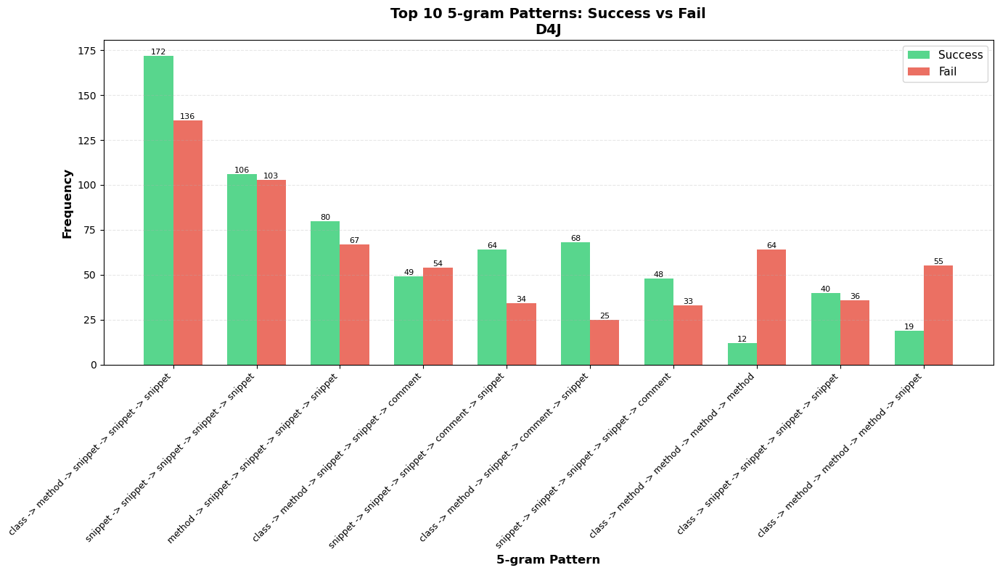


Benchmark: bip | Model: llama3


Total 5-grams collected: 1629

Total 5-grams from successful executions: 763

Total 5-grams from failed executions: 866

Benchmark: bip | Model: llama3.1


Total 5-grams collected: 5002

Total 5-grams from successful executions: 1990

Total 5-grams from failed executions: 3012

Benchmark: bip | Model: mistral-nemo


Total 5-grams collected: 378

Total 5-grams from successful executions: 133

Total 5-grams from failed executions: 245

Benchmark: bip | Model: qwen2.5-coder


Total 5-grams collected: 347

Total 5-grams from successful executions: 145

Total 5-grams from failed executions: 202
                                           pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
         class -> class -> class -> class -> class            2466                 845             1621         34.3%      65.7%
       package -> class -> class -> class -> class            1263                 553              710        

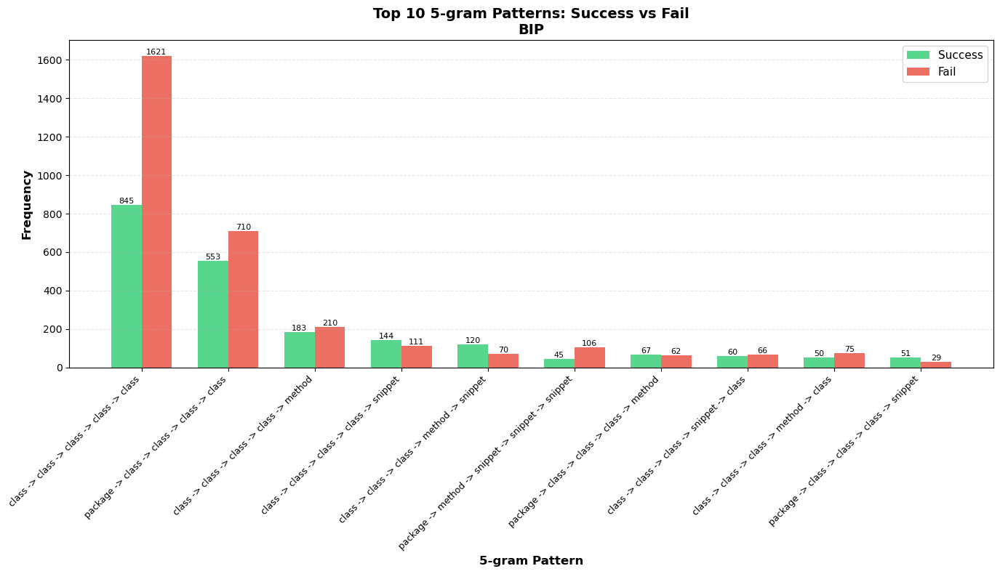

In [8]:
# Compare top 10 most frequent n-grams in all executions vs success/fail executions

import matplotlib.pyplot as plt
import numpy as np

# Function name mapping for readability
name_mapping = {
    'get_covered_packages': 'package',
    'get_failing_tests_covered_classes': 'class',
    'get_failing_tests_covered_methods_for_class': 'method',
    'get_code_snippet': 'snippet',
    'get_comments': 'comment'
}

def shorten_pattern(pattern_tuple):
    """Convert long function names to short versions"""
    return ' -> '.join([name_mapping.get(func, func) for func in pattern_tuple])

# For each benchmark and model combination
n=5
benchmarks = ['d4j', 'bip']
models = ['llama3', 'llama3.1', 'mistral-nemo', 'qwen2.5-coder']

for bm in benchmarks:
    all_ngrams, success_ngrams, fail_ngrams = [], [], []
    for model in models:
        print(f"\n{'='*100}")
        print(f"Benchmark: {bm} | Model: {model}")
        print(f"{'='*100}\n")
        
        # Load the three counters
        all_ngrams_from_model, success_ngrams_from_model, fail_ngrams_from_model = get_ngrams_for_executions(bm, model, n)
        
        all_ngrams.extend(all_ngrams_from_model)
        success_ngrams.extend(success_ngrams_from_model)
        fail_ngrams.extend(fail_ngrams_from_model)

    all_counter = Counter(all_ngrams)
    success_counter = Counter(success_ngrams)
    fail_counter = Counter(fail_ngrams)
    
    # Get top 10 from all executions
    top_10_patterns = [pattern for pattern, count in all_counter.most_common(10)]
    
    # Create comparison table
    comparison_data = []
    for pattern in top_10_patterns:
        all_count = all_counter[pattern]
        success_count = success_counter[pattern]
        fail_count = fail_counter[pattern]
        
        comparison_data.append({
            'pattern': shorten_pattern(pattern),
            'all_executions': all_count,
            'success_executions': success_count,
            'fail_executions': fail_count,
            'success_ratio': f"{success_count/all_count*100:.1f}%" if all_count > 0 else "0%",
            'fail_ratio': f"{fail_count/all_count*100:.1f}%" if all_count > 0 else "0%"
        })
    
    # Display as DataFrame
    comparison_df = pd.DataFrame(comparison_data)
    print(comparison_df.to_string(index=False))
    print()
    
    # Create bar chart
    fig, ax = plt.subplots(figsize=(14, 8))
    
    patterns = comparison_df['pattern'].tolist()
    success_counts = comparison_df['success_executions'].tolist()
    fail_counts = comparison_df['fail_executions'].tolist()
    
    x = np.arange(len(patterns))
    width = 0.35
    
    bars1 = ax.bar(x - width/2, success_counts, width, label='Success', color='#2ecc71', alpha=0.8)
    bars2 = ax.bar(x + width/2, fail_counts, width, label='Fail', color='#e74c3c', alpha=0.8)
    
    ax.set_xlabel(f'{n}-gram Pattern', fontsize=12, fontweight='bold')
    ax.set_ylabel('Frequency', fontsize=12, fontweight='bold')
    ax.set_title(f'Top 10 {n}-gram Patterns: Success vs Fail\n{bm.upper()}', fontsize=14, fontweight='bold')
    ax.set_xticks(x)
    ax.set_xticklabels(patterns, rotation=45, ha='right', fontsize=9)
    ax.legend(fontsize=11)
    ax.grid(axis='y', alpha=0.3, linestyle='--')
    
    # Add value labels on bars
    for bars in [bars1, bars2]:
        for bar in bars:
            height = bar.get_height()
            if height > 0:
                ax.text(bar.get_x() + bar.get_width()/2., height,
                        f'{int(height)}',
                        ha='center', va='bottom', fontsize=8)
    
    plt.tight_layout()
    plt.show()


Benchmark: d4j | Model: llama3


Total 5-grams collected: 879

Total 5-grams from successful executions: 518

Total 5-grams from failed executions: 361

Benchmark: d4j | Model: llama3.1


Total 5-grams collected: 2705

Total 5-grams from successful executions: 1086

Total 5-grams from failed executions: 1619

Benchmark: d4j | Model: mistral-nemo


Total 5-grams collected: 367

Total 5-grams from successful executions: 167

Total 5-grams from failed executions: 200

Benchmark: d4j | Model: qwen2.5-coder


Total 5-grams collected: 470

Total 5-grams from successful executions: 256

Total 5-grams from failed executions: 214


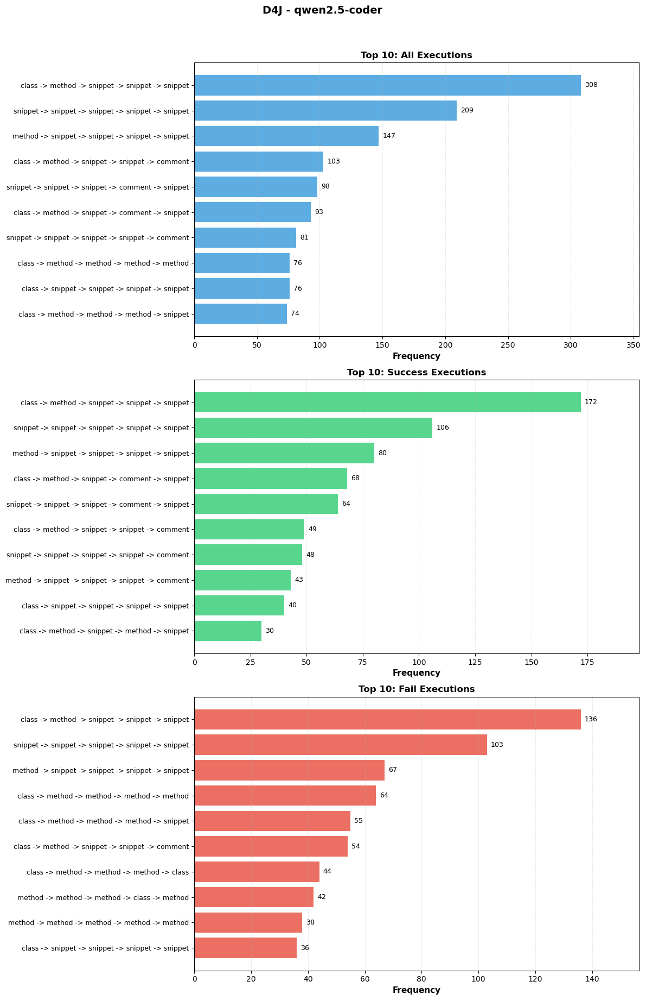


Benchmark: bip | Model: llama3


Total 5-grams collected: 1629

Total 5-grams from successful executions: 763

Total 5-grams from failed executions: 866

Benchmark: bip | Model: llama3.1


Total 5-grams collected: 5002

Total 5-grams from successful executions: 1990

Total 5-grams from failed executions: 3012

Benchmark: bip | Model: mistral-nemo


Total 5-grams collected: 378

Total 5-grams from successful executions: 133

Total 5-grams from failed executions: 245

Benchmark: bip | Model: qwen2.5-coder


Total 5-grams collected: 347

Total 5-grams from successful executions: 145

Total 5-grams from failed executions: 202


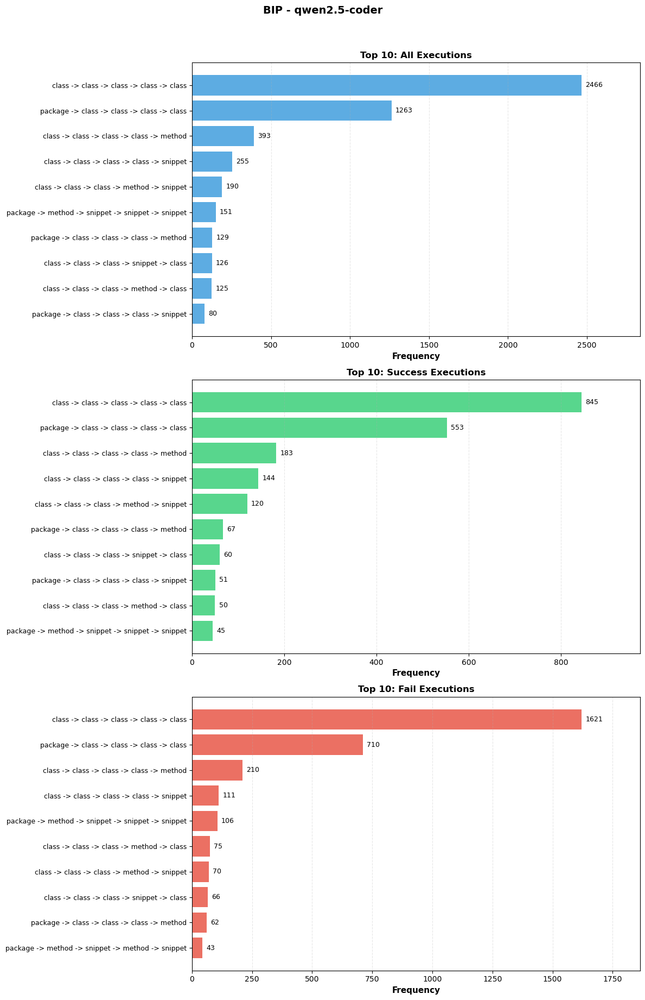

In [9]:
# Visualize Top 10 patterns separately for all/success/fail executions

import matplotlib.pyplot as plt
import numpy as np

# Function name mapping for readability
name_mapping = {
    'get_covered_packages': 'package',
    'get_failing_tests_covered_classes': 'class',
    'get_failing_tests_covered_methods_for_class': 'method',
    'get_code_snippet': 'snippet',
    'get_comments': 'comment'
}

def shorten_pattern(pattern_tuple):
    """Convert long function names to short versions"""
    return ' -> '.join([name_mapping.get(func, func) for func in pattern_tuple])

# For each benchmark and model combination
n=5
benchmarks = ['d4j', 'bip']
models = ['llama3', 'llama3.1', 'mistral-nemo', 'qwen2.5-coder']

for bm in benchmarks:
    all_ngrams, success_ngrams, fail_ngrams = [], [], []
    for model in models:
        print(f"\n{'='*100}")
        print(f"Benchmark: {bm} | Model: {model}")
        print(f"{'='*100}\n")
        
        # Load the three counters
        all_ngrams_from_model, success_ngrams_from_model, fail_ngrams_from_model = get_ngrams_for_executions(bm, model, n)
        
        all_ngrams.extend(all_ngrams_from_model)
        success_ngrams.extend(success_ngrams_from_model)
        fail_ngrams.extend(fail_ngrams_from_model)
        
    all_counter = Counter(all_ngrams)
    success_counter = Counter(success_ngrams)
    fail_counter = Counter(fail_ngrams)
    
    # Get top 10 from each counter
    top_10_all = [(shorten_pattern(pattern), count) for pattern, count in all_counter.most_common(10)]
    top_10_success = [(shorten_pattern(pattern), count) for pattern, count in success_counter.most_common(10)]
    top_10_fail = [(shorten_pattern(pattern), count) for pattern, count in fail_counter.most_common(10)]
    
    # Create 3 subplots
    fig, axes = plt.subplots(3, 1, figsize=(12, 18))
    
    # Plot 1: All Executions
    patterns_all = [p[0] for p in top_10_all]
    counts_all = [p[1] for p in top_10_all]
    
    axes[0].barh(range(len(patterns_all)), counts_all, color='#3498db', alpha=0.8)
    axes[0].set_yticks(range(len(patterns_all)))
    axes[0].set_yticklabels(patterns_all, fontsize=9)
    axes[0].set_xlabel('Frequency', fontsize=11, fontweight='bold')
    axes[0].set_title('Top 10: All Executions', fontsize=12, fontweight='bold')
    axes[0].invert_yaxis()
    axes[0].grid(axis='x', alpha=0.3, linestyle='--')

    axes[0].set_xlim(0, max(counts_all)*1.15)
    
    # Add value labels
    for i, v in enumerate(counts_all):
        axes[0].text(v + max(counts_all)*0.01, i, str(v), va='center', fontsize=9)
    
    # Plot 2: Success Executions
    patterns_success = [p[0] for p in top_10_success]
    counts_success = [p[1] for p in top_10_success]
    
    axes[1].barh(range(len(patterns_success)), counts_success, color='#2ecc71', alpha=0.8)
    axes[1].set_yticks(range(len(patterns_success)))
    axes[1].set_yticklabels(patterns_success, fontsize=9)
    axes[1].set_xlabel('Frequency', fontsize=11, fontweight='bold')
    axes[1].set_title('Top 10: Success Executions', fontsize=12, fontweight='bold')
    axes[1].invert_yaxis()
    axes[1].grid(axis='x', alpha=0.3, linestyle='--')

    axes[1].set_xlim(0, max(counts_success)*1.15)
    
    # Add value labels
    for i, v in enumerate(counts_success):
        axes[1].text(v + max(counts_success)*0.01, i, str(v), va='center', fontsize=9)
    
    # Plot 3: Fail Executions
    patterns_fail = [p[0] for p in top_10_fail]
    counts_fail = [p[1] for p in top_10_fail]
    
    axes[2].barh(range(len(patterns_fail)), counts_fail, color='#e74c3c', alpha=0.8)
    axes[2].set_yticks(range(len(patterns_fail)))
    axes[2].set_yticklabels(patterns_fail, fontsize=9)
    axes[2].set_xlabel('Frequency', fontsize=11, fontweight='bold')
    axes[2].set_title('Top 10: Fail Executions', fontsize=12, fontweight='bold')
    axes[2].invert_yaxis()
    axes[2].grid(axis='x', alpha=0.3, linestyle='--')

    axes[2].set_xlim(0, max(counts_fail)*1.15)
    
    # Add value labels
    for i, v in enumerate(counts_fail):
        axes[2].text(v + max(counts_fail)*0.01, i, str(v), va='center', fontsize=9)
    
    # Overall title
    fig.suptitle(f'{bm.upper()} - {model}', fontsize=14, fontweight='bold', y=1.02)
    
    plt.tight_layout()
    plt.show()

In [19]:
n=5
benchmarks = ['d4j', 'bip']
models = ['llama3', 'llama3.1', 'mistral-nemo', 'qwen2.5-coder']

for bm in benchmarks:
    all_ngrams, success_ngrams, fail_ngrams = [], [], []    
    for model in models:
        print(f"\n{'='*100}")
        print(f"Benchmark: {bm} | Model: {model}")
        print(f"{'='*100}\n")
        
        # Load the three counters
        all_ngrams_from_model, success_ngrams_from_model, fail_ngrams_from_model = get_ngrams_for_executions(bm, model, n)
        
        all_ngrams.extend(all_ngrams_from_model)
        success_ngrams.extend(success_ngrams_from_model)
        fail_ngrams.extend(fail_ngrams_from_model)

    all_counter = Counter(all_ngrams)
    success_counter = Counter(success_ngrams)
    fail_counter = Counter(fail_ngrams)

    top_30_all = [pattern for pattern in all_counter.most_common(30)]
    
    correlation_data = []
    for pattern, freq in top_30_all:
        success_label = []
        ngram_presence = []
        for i in range(1, 11):
            for model in models:
                if bm == 'd4j':
                    directory_path = f'./raw_data/autofl/d4j_autofl_eol_{i}/{model}'
                elif bm == 'bip':
                    directory_path = f'./raw_data/autofl/bip_cosmosfl_{i}/{model}'
                
                for json_file in os.listdir(directory_path):
                    with open(os.path.join(directory_path, json_file), 'r') as f:
                        data = json.load(f)
                    if 'messages' in data:
                        sequence = extract_function_call_sequence(data['messages'])
                        ngrams = get_ngrams(sequence, n)
                        execution_success = get_result_of_execution(data["buggy_methods"])

                        if execution_success:
                            success_label.append(1)
                        else:
                            success_label.append(0)
                        if pattern in ngrams:
                            ngram_presence.append(1)
                        else:
                            ngram_presence.append(0)
        # print(success_label)
        # print(ngram_presence)
        correlation, p_value = pointbiserialr(success_label, ngram_presence)
        correlation_data.append({
            'pattern': pattern,
            'correlation': correlation,
            'p-value': p_value
        })

    correlation_df = pd.DataFrame(correlation_data)
    output_dir = f'./correlation/autofl/{n}-gram/{bm}'
    os.makedirs(output_dir, exist_ok=True)
    correlation_df.to_csv(os.path.join(output_dir, 'correlation.csv'), index=False)
    print(f"Saved {os.path.join(output_dir, 'correlation.csv')}")




    





Benchmark: d4j | Model: llama3


Total 5-grams collected: 879

Total 5-grams from successful executions: 518

Total 5-grams from failed executions: 361

Benchmark: d4j | Model: llama3.1


Total 5-grams collected: 2705

Total 5-grams from successful executions: 1086

Total 5-grams from failed executions: 1619

Benchmark: d4j | Model: mistral-nemo


Total 5-grams collected: 367

Total 5-grams from successful executions: 167

Total 5-grams from failed executions: 200

Benchmark: d4j | Model: qwen2.5-coder


Total 5-grams collected: 470

Total 5-grams from successful executions: 256

Total 5-grams from failed executions: 214
Saved ./correlation/autofl/5-gram/d4j/correlation.csv

Benchmark: bip | Model: llama3


Total 5-grams collected: 1629

Total 5-grams from successful executions: 763

Total 5-grams from failed executions: 866

Benchmark: bip | Model: llama3.1


Total 5-grams collected: 5002

Total 5-grams from successful executions: 1990

Total 5-grams from failed executions: 3012

Ben

### 4-gram

In [11]:
# Get n-gram: frequencies for all benchmarks and models
n = 4
benchmarks = ['d4j', 'bip']
models = ['llama3', 'llama3.1', 'mistral-nemo', 'qwen2.5-coder']

for bm in benchmarks:
    all_ngrams, all_success_ngrams, all_fail_ngrams = [], [], []
    for model in models:
        all_ngrams_from_model, all_success_ngrams_from_model, all_fail_ngrams_from_model = get_ngrams_for_executions(bm, model, n)
        all_ngrams.extend(all_ngrams_from_model)
        all_success_ngrams.extend(all_success_ngrams_from_model)
        all_fail_ngrams.extend(all_fail_ngrams_from_model)

    all_counter = Counter(all_ngrams)
    success_counter = Counter(all_success_ngrams)
    fail_counter = Counter(all_fail_ngrams)

    all_results = []
    success_results = []
    fail_results = []
    for ngram, count in all_counter.most_common():
        all_results.append({
            f'{n}gram': ngram,
            'frequency': count
        })
    for ngram, count in success_counter.most_common():
        success_results.append({
            f'{n}gram': ngram,
            'frequency': count
        })
    for ngram, count in fail_counter.most_common():
        fail_results.append({
            f'{n}gram': ngram,
            'frequency': count
        })
        
    
    all_df = pd.DataFrame(all_results)
    success_df = pd.DataFrame(success_results)
    fail_df = pd.DataFrame(fail_results)

    output_dir = f"./{n}gram_frequency/autofl/all_executions"
    os.makedirs(output_dir, exist_ok=True)
    output_file = os.path.join(output_dir, f"{bm}_{n}gram_frequencies.csv")
    all_df.to_csv(output_file, index=False)
    print(f"Saved {output_file} with {len(all_df)} unique {n}-gram")

    output_dir = f"./{n}gram_frequency/autofl/success_executions"
    os.makedirs(output_dir, exist_ok=True)
    output_file = os.path.join(output_dir, f"{bm}_{n}gram_frequencies.csv")
    success_df.to_csv(output_file, index=False)
    print(f"Saved {output_file} with {len(success_df)} unique {n}-gram")

    output_dir = f"./{n}gram_frequency/autofl/fail_executions"
    os.makedirs(output_dir, exist_ok=True)
    output_file = os.path.join(output_dir, f"{bm}_{n}gram_frequencies.csv")
    fail_df.to_csv(output_file, index=False)
    print(f"Saved {output_file} with {len(fail_df)} unique {n}-gram")


Total 4-grams collected: 1646

Total 4-grams from successful executions: 950

Total 4-grams from failed executions: 696

Total 4-grams collected: 3898

Total 4-grams from successful executions: 1663

Total 4-grams from failed executions: 2235

Total 4-grams collected: 753

Total 4-grams from successful executions: 330

Total 4-grams from failed executions: 423

Total 4-grams collected: 957

Total 4-grams from successful executions: 503

Total 4-grams from failed executions: 454
Saved ./4gram_frequency/autofl/all_executions/d4j_4gram_frequencies.csv with 209 unique 4-gram
Saved ./4gram_frequency/autofl/success_executions/d4j_4gram_frequencies.csv with 176 unique 4-gram
Saved ./4gram_frequency/autofl/fail_executions/d4j_4gram_frequencies.csv with 196 unique 4-gram

Total 4-grams collected: 2410

Total 4-grams from successful executions: 1152

Total 4-grams from failed executions: 1258

Total 4-grams collected: 6364

Total 4-grams from successful executions: 2662

Total 4-grams from fail


Benchmark: d4j | Model: llama3


Total 4-grams collected: 1646

Total 4-grams from successful executions: 950

Total 4-grams from failed executions: 696

Benchmark: d4j | Model: llama3.1


Total 4-grams collected: 3898

Total 4-grams from successful executions: 1663

Total 4-grams from failed executions: 2235

Benchmark: d4j | Model: mistral-nemo


Total 4-grams collected: 753

Total 4-grams from successful executions: 330

Total 4-grams from failed executions: 423

Benchmark: d4j | Model: qwen2.5-coder


Total 4-grams collected: 957

Total 4-grams from successful executions: 503

Total 4-grams from failed executions: 454
                                 pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
   class -> method -> snippet -> snippet             697                 371              326         53.2%      46.8%
   class -> method -> snippet -> comment             536                 355              181         66.2%      33.8%
snippet -> s

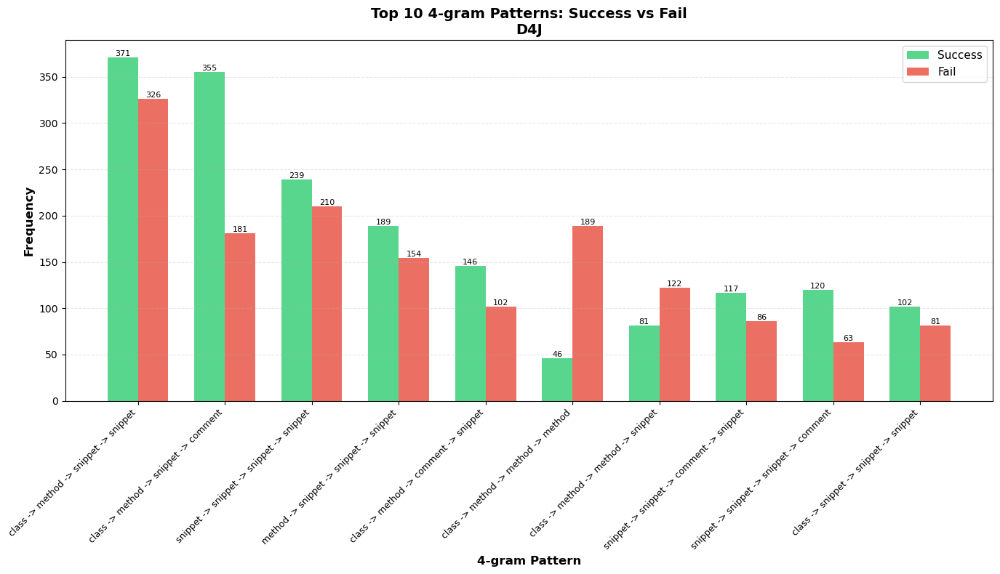


Benchmark: bip | Model: llama3


Total 4-grams collected: 2410

Total 4-grams from successful executions: 1152

Total 4-grams from failed executions: 1258

Benchmark: bip | Model: llama3.1


Total 4-grams collected: 6364

Total 4-grams from successful executions: 2662

Total 4-grams from failed executions: 3702

Benchmark: bip | Model: mistral-nemo


Total 4-grams collected: 1121

Total 4-grams from successful executions: 441

Total 4-grams from failed executions: 680

Benchmark: bip | Model: qwen2.5-coder


Total 4-grams collected: 854

Total 4-grams from successful executions: 370

Total 4-grams from failed executions: 484
                                pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
       class -> class -> class -> class            3759                1408             2351         37.5%      62.5%
     package -> class -> class -> class            1659                 768              891         46.3%      53.7%
package -> m

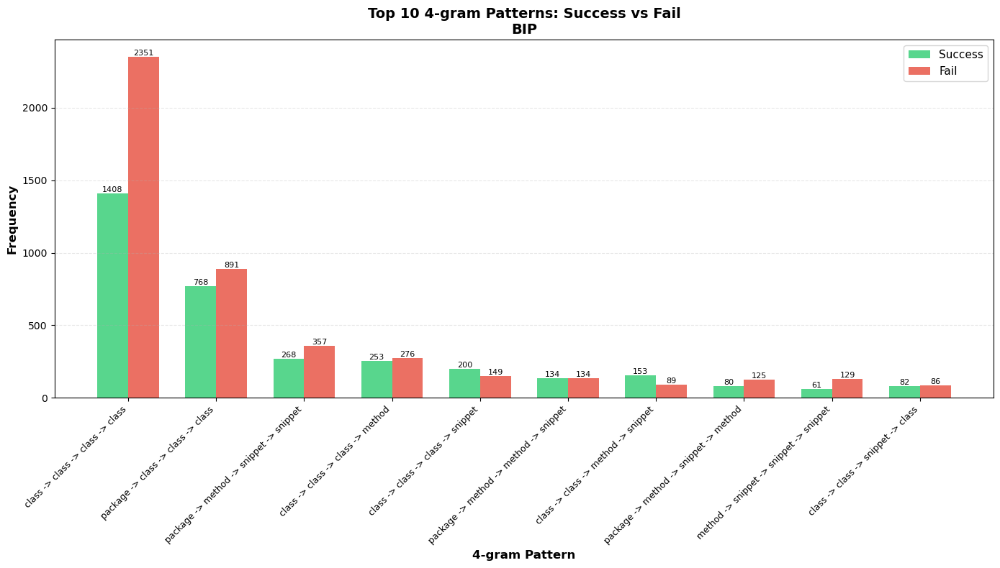

In [12]:
# Compare top 10 most frequent n-grams in all executions vs success/fail executions

import matplotlib.pyplot as plt
import numpy as np

# Function name mapping for readability
name_mapping = {
    'get_covered_packages': 'package',
    'get_failing_tests_covered_classes': 'class',
    'get_failing_tests_covered_methods_for_class': 'method',
    'get_code_snippet': 'snippet',
    'get_comments': 'comment'
}

def shorten_pattern(pattern_tuple):
    """Convert long function names to short versions"""
    return ' -> '.join([name_mapping.get(func, func) for func in pattern_tuple])

# For each benchmark and model combination
n=4
benchmarks = ['d4j', 'bip']
models = ['llama3', 'llama3.1', 'mistral-nemo', 'qwen2.5-coder']

for bm in benchmarks:
    all_ngrams, success_ngrams, fail_ngrams = [], [], []
    for model in models:
        print(f"\n{'='*100}")
        print(f"Benchmark: {bm} | Model: {model}")
        print(f"{'='*100}\n")
        
        # Load the three counters
        all_ngrams_from_model, success_ngrams_from_model, fail_ngrams_from_model = get_ngrams_for_executions(bm, model, n)
        
        all_ngrams.extend(all_ngrams_from_model)
        success_ngrams.extend(success_ngrams_from_model)
        fail_ngrams.extend(fail_ngrams_from_model)

    all_counter = Counter(all_ngrams)
    success_counter = Counter(success_ngrams)
    fail_counter = Counter(fail_ngrams)
    
    # Get top 10 from all executions
    top_10_patterns = [pattern for pattern, count in all_counter.most_common(10)]
    
    # Create comparison table
    comparison_data = []
    for pattern in top_10_patterns:
        all_count = all_counter[pattern]
        success_count = success_counter[pattern]
        fail_count = fail_counter[pattern]
        
        comparison_data.append({
            'pattern': shorten_pattern(pattern),
            'all_executions': all_count,
            'success_executions': success_count,
            'fail_executions': fail_count,
            'success_ratio': f"{success_count/all_count*100:.1f}%" if all_count > 0 else "0%",
            'fail_ratio': f"{fail_count/all_count*100:.1f}%" if all_count > 0 else "0%"
        })
    
    # Display as DataFrame
    comparison_df = pd.DataFrame(comparison_data)
    print(comparison_df.to_string(index=False))
    print()
    
    # Create bar chart
    fig, ax = plt.subplots(figsize=(14, 8))
    
    patterns = comparison_df['pattern'].tolist()
    success_counts = comparison_df['success_executions'].tolist()
    fail_counts = comparison_df['fail_executions'].tolist()
    
    x = np.arange(len(patterns))
    width = 0.35
    
    bars1 = ax.bar(x - width/2, success_counts, width, label='Success', color='#2ecc71', alpha=0.8)
    bars2 = ax.bar(x + width/2, fail_counts, width, label='Fail', color='#e74c3c', alpha=0.8)
    
    ax.set_xlabel(f'{n}-gram Pattern', fontsize=12, fontweight='bold')
    ax.set_ylabel('Frequency', fontsize=12, fontweight='bold')
    ax.set_title(f'Top 10 {n}-gram Patterns: Success vs Fail\n{bm.upper()}', fontsize=14, fontweight='bold')
    ax.set_xticks(x)
    ax.set_xticklabels(patterns, rotation=45, ha='right', fontsize=9)
    ax.legend(fontsize=11)
    ax.grid(axis='y', alpha=0.3, linestyle='--')
    
    # Add value labels on bars
    for bars in [bars1, bars2]:
        for bar in bars:
            height = bar.get_height()
            if height > 0:
                ax.text(bar.get_x() + bar.get_width()/2., height,
                        f'{int(height)}',
                        ha='center', va='bottom', fontsize=8)
    
    plt.tight_layout()
    plt.show()


Benchmark: d4j | Model: llama3


Total 4-grams collected: 1646

Total 4-grams from successful executions: 950

Total 4-grams from failed executions: 696

Benchmark: d4j | Model: llama3.1


Total 4-grams collected: 3898

Total 4-grams from successful executions: 1663

Total 4-grams from failed executions: 2235

Benchmark: d4j | Model: mistral-nemo


Total 4-grams collected: 753

Total 4-grams from successful executions: 330

Total 4-grams from failed executions: 423

Benchmark: d4j | Model: qwen2.5-coder


Total 4-grams collected: 957

Total 4-grams from successful executions: 503

Total 4-grams from failed executions: 454


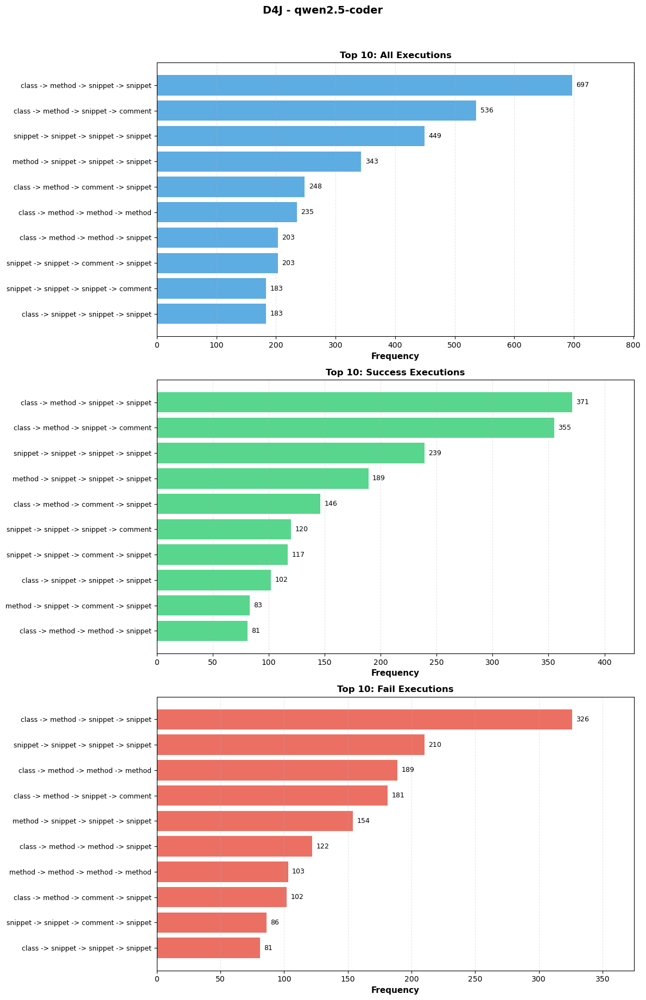


Benchmark: bip | Model: llama3


Total 4-grams collected: 2410

Total 4-grams from successful executions: 1152

Total 4-grams from failed executions: 1258

Benchmark: bip | Model: llama3.1


Total 4-grams collected: 6364

Total 4-grams from successful executions: 2662

Total 4-grams from failed executions: 3702

Benchmark: bip | Model: mistral-nemo


Total 4-grams collected: 1121

Total 4-grams from successful executions: 441

Total 4-grams from failed executions: 680

Benchmark: bip | Model: qwen2.5-coder


Total 4-grams collected: 854

Total 4-grams from successful executions: 370

Total 4-grams from failed executions: 484


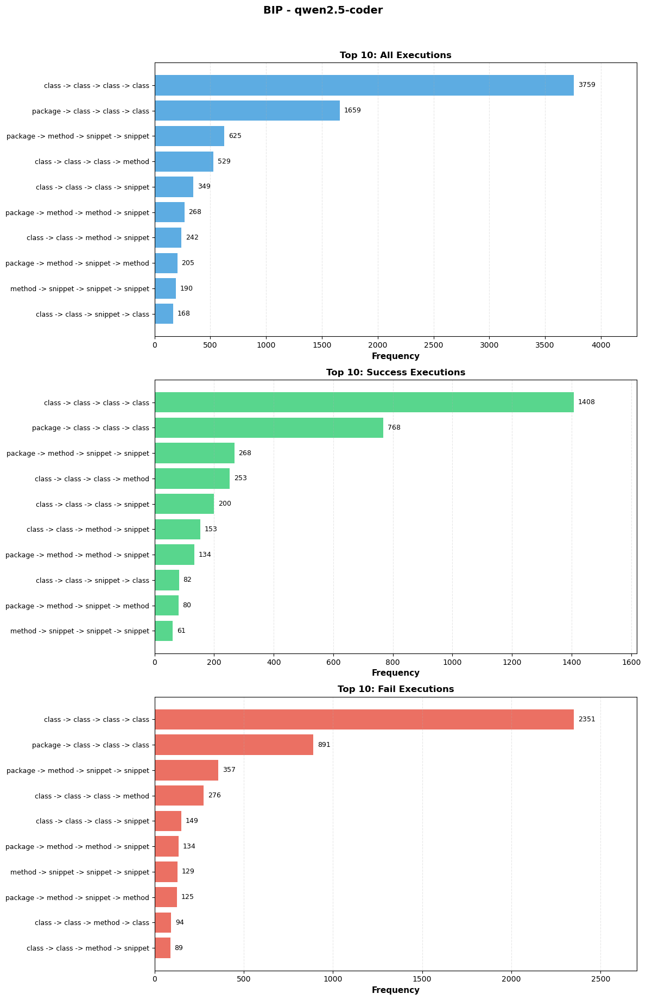

In [13]:
# Visualize Top 10 patterns separately for all/success/fail executions

import matplotlib.pyplot as plt
import numpy as np

# Function name mapping for readability
name_mapping = {
    'get_covered_packages': 'package',
    'get_failing_tests_covered_classes': 'class',
    'get_failing_tests_covered_methods_for_class': 'method',
    'get_code_snippet': 'snippet',
    'get_comments': 'comment'
}

def shorten_pattern(pattern_tuple):
    """Convert long function names to short versions"""
    return ' -> '.join([name_mapping.get(func, func) for func in pattern_tuple])

# For each benchmark and model combination
n=4
benchmarks = ['d4j', 'bip']
models = ['llama3', 'llama3.1', 'mistral-nemo', 'qwen2.5-coder']

for bm in benchmarks:
    all_ngrams, success_ngrams, fail_ngrams = [], [], []
    for model in models:
        print(f"\n{'='*100}")
        print(f"Benchmark: {bm} | Model: {model}")
        print(f"{'='*100}\n")
        
        # Load the three counters
        all_ngrams_from_model, success_ngrams_from_model, fail_ngrams_from_model = get_ngrams_for_executions(bm, model, n)
        
        all_ngrams.extend(all_ngrams_from_model)
        success_ngrams.extend(success_ngrams_from_model)
        fail_ngrams.extend(fail_ngrams_from_model)
        
    all_counter = Counter(all_ngrams)
    success_counter = Counter(success_ngrams)
    fail_counter = Counter(fail_ngrams)
    
    # Get top 10 from each counter
    top_10_all = [(shorten_pattern(pattern), count) for pattern, count in all_counter.most_common(10)]
    top_10_success = [(shorten_pattern(pattern), count) for pattern, count in success_counter.most_common(10)]
    top_10_fail = [(shorten_pattern(pattern), count) for pattern, count in fail_counter.most_common(10)]
    
    # Create 3 subplots
    fig, axes = plt.subplots(3, 1, figsize=(12, 18))
    
    # Plot 1: All Executions
    patterns_all = [p[0] for p in top_10_all]
    counts_all = [p[1] for p in top_10_all]
    
    axes[0].barh(range(len(patterns_all)), counts_all, color='#3498db', alpha=0.8)
    axes[0].set_yticks(range(len(patterns_all)))
    axes[0].set_yticklabels(patterns_all, fontsize=9)
    axes[0].set_xlabel('Frequency', fontsize=11, fontweight='bold')
    axes[0].set_title('Top 10: All Executions', fontsize=12, fontweight='bold')
    axes[0].invert_yaxis()
    axes[0].grid(axis='x', alpha=0.3, linestyle='--')

    axes[0].set_xlim(0, max(counts_all)*1.15)
    
    # Add value labels
    for i, v in enumerate(counts_all):
        axes[0].text(v + max(counts_all)*0.01, i, str(v), va='center', fontsize=9)
    
    # Plot 2: Success Executions
    patterns_success = [p[0] for p in top_10_success]
    counts_success = [p[1] for p in top_10_success]
    
    axes[1].barh(range(len(patterns_success)), counts_success, color='#2ecc71', alpha=0.8)
    axes[1].set_yticks(range(len(patterns_success)))
    axes[1].set_yticklabels(patterns_success, fontsize=9)
    axes[1].set_xlabel('Frequency', fontsize=11, fontweight='bold')
    axes[1].set_title('Top 10: Success Executions', fontsize=12, fontweight='bold')
    axes[1].invert_yaxis()
    axes[1].grid(axis='x', alpha=0.3, linestyle='--')

    axes[1].set_xlim(0, max(counts_success)*1.15)
    
    # Add value labels
    for i, v in enumerate(counts_success):
        axes[1].text(v + max(counts_success)*0.01, i, str(v), va='center', fontsize=9)
    
    # Plot 3: Fail Executions
    patterns_fail = [p[0] for p in top_10_fail]
    counts_fail = [p[1] for p in top_10_fail]
    
    axes[2].barh(range(len(patterns_fail)), counts_fail, color='#e74c3c', alpha=0.8)
    axes[2].set_yticks(range(len(patterns_fail)))
    axes[2].set_yticklabels(patterns_fail, fontsize=9)
    axes[2].set_xlabel('Frequency', fontsize=11, fontweight='bold')
    axes[2].set_title('Top 10: Fail Executions', fontsize=12, fontweight='bold')
    axes[2].invert_yaxis()
    axes[2].grid(axis='x', alpha=0.3, linestyle='--')

    axes[2].set_xlim(0, max(counts_fail)*1.15)
    
    # Add value labels
    for i, v in enumerate(counts_fail):
        axes[2].text(v + max(counts_fail)*0.01, i, str(v), va='center', fontsize=9)
    
    # Overall title
    fig.suptitle(f'{bm.upper()} - {model}', fontsize=14, fontweight='bold', y=1.02)
    
    plt.tight_layout()
    plt.show()

In [20]:
n=4
benchmarks = ['d4j', 'bip']
models = ['llama3', 'llama3.1', 'mistral-nemo', 'qwen2.5-coder']

for bm in benchmarks:
    all_ngrams, success_ngrams, fail_ngrams = [], [], []    
    for model in models:
        print(f"\n{'='*100}")
        print(f"Benchmark: {bm} | Model: {model}")
        print(f"{'='*100}\n")
        
        # Load the three counters
        all_ngrams_from_model, success_ngrams_from_model, fail_ngrams_from_model = get_ngrams_for_executions(bm, model, n)
        
        all_ngrams.extend(all_ngrams_from_model)
        success_ngrams.extend(success_ngrams_from_model)
        fail_ngrams.extend(fail_ngrams_from_model)

    all_counter = Counter(all_ngrams)
    success_counter = Counter(success_ngrams)
    fail_counter = Counter(fail_ngrams)

    top_30_all = [pattern for pattern in all_counter.most_common(30)]
    
    correlation_data = []
    for pattern, freq in top_30_all:
        success_label = []
        ngram_presence = []
        for i in range(1, 11):
            for model in models:
                if bm == 'd4j':
                    directory_path = f'./raw_data/autofl/d4j_autofl_eol_{i}/{model}'
                elif bm == 'bip':
                    directory_path = f'./raw_data/autofl/bip_cosmosfl_{i}/{model}'
                
                for json_file in os.listdir(directory_path):
                    with open(os.path.join(directory_path, json_file), 'r') as f:
                        data = json.load(f)
                    if 'messages' in data:
                        sequence = extract_function_call_sequence(data['messages'])
                        ngrams = get_ngrams(sequence, n)
                        execution_success = get_result_of_execution(data["buggy_methods"])

                        if execution_success:
                            success_label.append(1)
                        else:
                            success_label.append(0)
                        if pattern in ngrams:
                            ngram_presence.append(1)
                        else:
                            ngram_presence.append(0)
        # print(success_label)
        # print(ngram_presence)
        correlation, p_value = pointbiserialr(success_label, ngram_presence)
        correlation_data.append({
            'pattern': pattern,
            'correlation': correlation,
            'p-value': p_value
        })

    correlation_df = pd.DataFrame(correlation_data)
    output_dir = f'./correlation/autofl/{n}-gram/{bm}'
    os.makedirs(output_dir, exist_ok=True)
    correlation_df.to_csv(os.path.join(output_dir, 'correlation.csv'), index=False)
    print(f"Saved {os.path.join(output_dir, 'correlation.csv')}")




    





Benchmark: d4j | Model: llama3


Total 4-grams collected: 1646

Total 4-grams from successful executions: 950

Total 4-grams from failed executions: 696

Benchmark: d4j | Model: llama3.1


Total 4-grams collected: 3898

Total 4-grams from successful executions: 1663

Total 4-grams from failed executions: 2235

Benchmark: d4j | Model: mistral-nemo


Total 4-grams collected: 753

Total 4-grams from successful executions: 330

Total 4-grams from failed executions: 423

Benchmark: d4j | Model: qwen2.5-coder


Total 4-grams collected: 957

Total 4-grams from successful executions: 503

Total 4-grams from failed executions: 454
Saved ./correlation/autofl/4-gram/d4j/correlation.csv

Benchmark: bip | Model: llama3


Total 4-grams collected: 2410

Total 4-grams from successful executions: 1152

Total 4-grams from failed executions: 1258

Benchmark: bip | Model: llama3.1


Total 4-grams collected: 6364

Total 4-grams from successful executions: 2662

Total 4-grams from failed executions: 3702



### 3-gram

In [21]:
# Get n-gram: frequencies for all benchmarks and models
n = 3
benchmarks = ['d4j', 'bip']
models = ['llama3', 'llama3.1', 'mistral-nemo', 'qwen2.5-coder']

for bm in benchmarks:
    all_ngrams, all_success_ngrams, all_fail_ngrams = [], [], []
    for model in models:
        all_ngrams_from_model, all_success_ngrams_from_model, all_fail_ngrams_from_model = get_ngrams_for_executions(bm, model, n)
        all_ngrams.extend(all_ngrams_from_model)
        all_success_ngrams.extend(all_success_ngrams_from_model)
        all_fail_ngrams.extend(all_fail_ngrams_from_model)

    all_counter = Counter(all_ngrams)
    success_counter = Counter(all_success_ngrams)
    fail_counter = Counter(all_fail_ngrams)

    all_results = []
    success_results = []
    fail_results = []
    for ngram, count in all_counter.most_common():
        all_results.append({
            f'{n}gram': ngram,
            'frequency': count
        })
    for ngram, count in success_counter.most_common():
        success_results.append({
            f'{n}gram': ngram,
            'frequency': count
        })
    for ngram, count in fail_counter.most_common():
        fail_results.append({
            f'{n}gram': ngram,
            'frequency': count
        })
        
    
    all_df = pd.DataFrame(all_results)
    success_df = pd.DataFrame(success_results)
    fail_df = pd.DataFrame(fail_results)

    output_dir = f"./{n}gram_frequency/autofl/all_executions"
    os.makedirs(output_dir, exist_ok=True)
    output_file = os.path.join(output_dir, f"{bm}_{n}gram_frequencies.csv")
    all_df.to_csv(output_file, index=False)
    print(f"Saved {output_file} with {len(all_df)} unique {n}-gram")

    output_dir = f"./{n}gram_frequency/autofl/success_executions"
    os.makedirs(output_dir, exist_ok=True)
    output_file = os.path.join(output_dir, f"{bm}_{n}gram_frequencies.csv")
    success_df.to_csv(output_file, index=False)
    print(f"Saved {output_file} with {len(success_df)} unique {n}-gram")

    output_dir = f"./{n}gram_frequency/autofl/fail_executions"
    os.makedirs(output_dir, exist_ok=True)
    output_file = os.path.join(output_dir, f"{bm}_{n}gram_frequencies.csv")
    fail_df.to_csv(output_file, index=False)
    print(f"Saved {output_file} with {len(fail_df)} unique {n}-gram")


Total 3-grams collected: 2948

Total 3-grams from successful executions: 1609

Total 3-grams from failed executions: 1339

Total 3-grams collected: 5521

Total 3-grams from successful executions: 2497

Total 3-grams from failed executions: 3024

Total 3-grams collected: 1751

Total 3-grams from successful executions: 826

Total 3-grams from failed executions: 925

Total 3-grams collected: 1893

Total 3-grams from successful executions: 975

Total 3-grams from failed executions: 918
Saved ./3gram_frequency/autofl/all_executions/d4j_3gram_frequencies.csv with 63 unique 3-gram
Saved ./3gram_frequency/autofl/success_executions/d4j_3gram_frequencies.csv with 62 unique 3-gram
Saved ./3gram_frequency/autofl/fail_executions/d4j_3gram_frequencies.csv with 62 unique 3-gram

Total 3-grams collected: 3286

Total 3-grams from successful executions: 1593

Total 3-grams from failed executions: 1693

Total 3-grams collected: 8137

Total 3-grams from successful executions: 3597

Total 3-grams from fai


Benchmark: d4j | Model: llama3


Total 3-grams collected: 2948

Total 3-grams from successful executions: 1609

Total 3-grams from failed executions: 1339

Benchmark: d4j | Model: llama3.1


Total 3-grams collected: 5521

Total 3-grams from successful executions: 2497

Total 3-grams from failed executions: 3024

Benchmark: d4j | Model: mistral-nemo


Total 3-grams collected: 1751

Total 3-grams from successful executions: 826

Total 3-grams from failed executions: 925

Benchmark: d4j | Model: qwen2.5-coder


Total 3-grams collected: 1893

Total 3-grams from successful executions: 975

Total 3-grams from failed executions: 918
                      pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
   class -> method -> snippet            2707                1463             1244         54.0%      46.0%
snippet -> snippet -> snippet            1029                 564              465         54.8%      45.2%
 method -> snippet -> snippet            

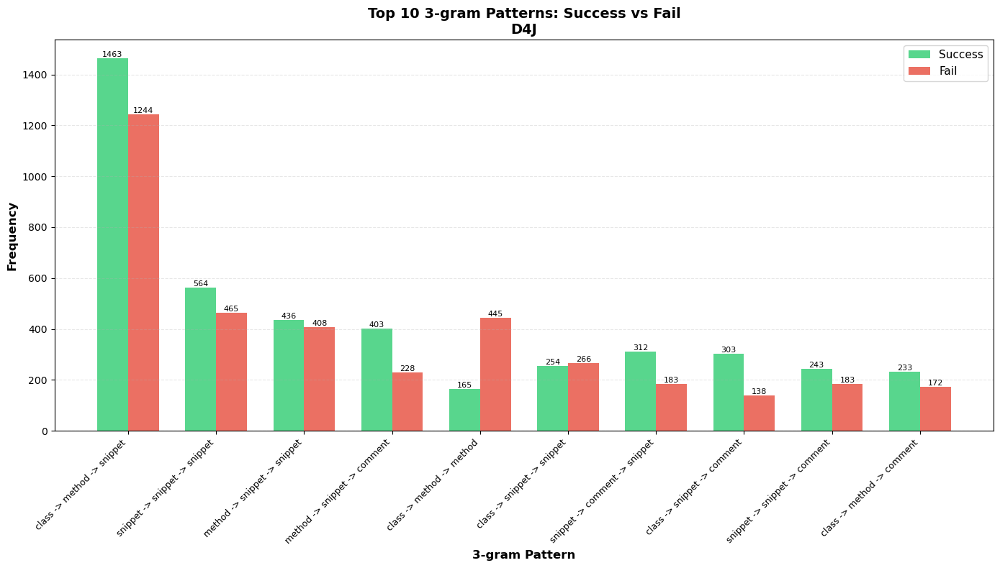


Benchmark: bip | Model: llama3


Total 3-grams collected: 3286

Total 3-grams from successful executions: 1593

Total 3-grams from failed executions: 1693

Benchmark: bip | Model: llama3.1


Total 3-grams collected: 8137

Total 3-grams from successful executions: 3597

Total 3-grams from failed executions: 4540

Benchmark: bip | Model: mistral-nemo


Total 3-grams collected: 3020

Total 3-grams from successful executions: 1384

Total 3-grams from failed executions: 1636

Benchmark: bip | Model: qwen2.5-coder


Total 3-grams collected: 2081

Total 3-grams from successful executions: 995

Total 3-grams from failed executions: 1086
                      pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
      class -> class -> class            5486                2201             3285         40.1%      59.9%
 package -> method -> snippet            2598                1370             1228         52.7%      47.3%
    package -> class -> class         

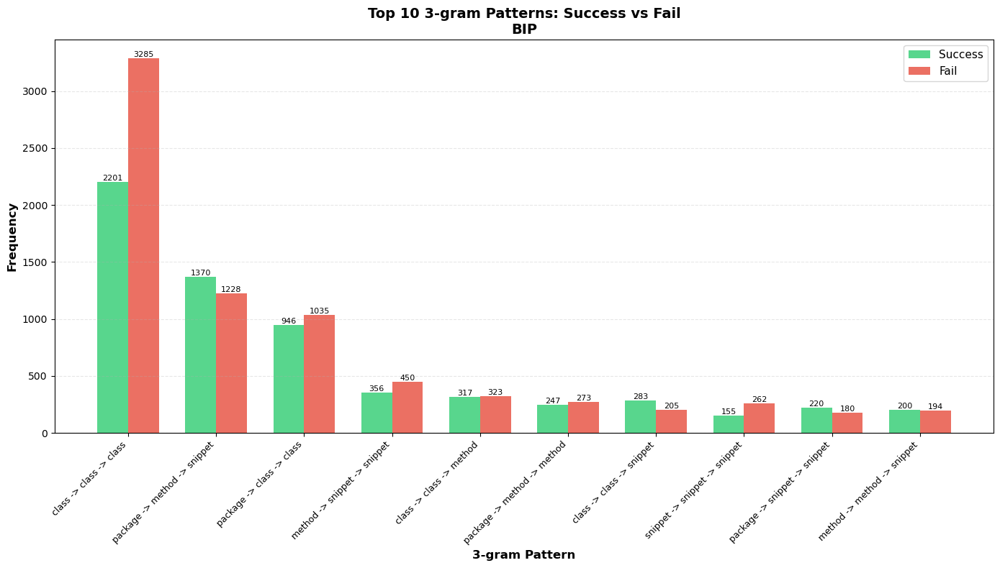

In [22]:
# Compare top 10 most frequent n-grams in all executions vs success/fail executions

import matplotlib.pyplot as plt
import numpy as np

# Function name mapping for readability
name_mapping = {
    'get_covered_packages': 'package',
    'get_failing_tests_covered_classes': 'class',
    'get_failing_tests_covered_methods_for_class': 'method',
    'get_code_snippet': 'snippet',
    'get_comments': 'comment'
}

def shorten_pattern(pattern_tuple):
    """Convert long function names to short versions"""
    return ' -> '.join([name_mapping.get(func, func) for func in pattern_tuple])

# For each benchmark and model combination
n=3
benchmarks = ['d4j', 'bip']
models = ['llama3', 'llama3.1', 'mistral-nemo', 'qwen2.5-coder']

for bm in benchmarks:
    all_ngrams, success_ngrams, fail_ngrams = [], [], []
    for model in models:
        print(f"\n{'='*100}")
        print(f"Benchmark: {bm} | Model: {model}")
        print(f"{'='*100}\n")
        
        # Load the three counters
        all_ngrams_from_model, success_ngrams_from_model, fail_ngrams_from_model = get_ngrams_for_executions(bm, model, n)
        
        all_ngrams.extend(all_ngrams_from_model)
        success_ngrams.extend(success_ngrams_from_model)
        fail_ngrams.extend(fail_ngrams_from_model)

    all_counter = Counter(all_ngrams)
    success_counter = Counter(success_ngrams)
    fail_counter = Counter(fail_ngrams)
    
    # Get top 10 from all executions
    top_10_patterns = [pattern for pattern, count in all_counter.most_common(10)]
    
    # Create comparison table
    comparison_data = []
    for pattern in top_10_patterns:
        all_count = all_counter[pattern]
        success_count = success_counter[pattern]
        fail_count = fail_counter[pattern]
        
        comparison_data.append({
            'pattern': shorten_pattern(pattern),
            'all_executions': all_count,
            'success_executions': success_count,
            'fail_executions': fail_count,
            'success_ratio': f"{success_count/all_count*100:.1f}%" if all_count > 0 else "0%",
            'fail_ratio': f"{fail_count/all_count*100:.1f}%" if all_count > 0 else "0%"
        })
    
    # Display as DataFrame
    comparison_df = pd.DataFrame(comparison_data)
    print(comparison_df.to_string(index=False))
    print()
    
    # Create bar chart
    fig, ax = plt.subplots(figsize=(14, 8))
    
    patterns = comparison_df['pattern'].tolist()
    success_counts = comparison_df['success_executions'].tolist()
    fail_counts = comparison_df['fail_executions'].tolist()
    
    x = np.arange(len(patterns))
    width = 0.35
    
    bars1 = ax.bar(x - width/2, success_counts, width, label='Success', color='#2ecc71', alpha=0.8)
    bars2 = ax.bar(x + width/2, fail_counts, width, label='Fail', color='#e74c3c', alpha=0.8)
    
    ax.set_xlabel(f'{n}-gram Pattern', fontsize=12, fontweight='bold')
    ax.set_ylabel('Frequency', fontsize=12, fontweight='bold')
    ax.set_title(f'Top 10 {n}-gram Patterns: Success vs Fail\n{bm.upper()}', fontsize=14, fontweight='bold')
    ax.set_xticks(x)
    ax.set_xticklabels(patterns, rotation=45, ha='right', fontsize=9)
    ax.legend(fontsize=11)
    ax.grid(axis='y', alpha=0.3, linestyle='--')
    
    # Add value labels on bars
    for bars in [bars1, bars2]:
        for bar in bars:
            height = bar.get_height()
            if height > 0:
                ax.text(bar.get_x() + bar.get_width()/2., height,
                        f'{int(height)}',
                        ha='center', va='bottom', fontsize=8)
    
    plt.tight_layout()
    plt.show()


Benchmark: d4j | Model: llama3


Total 3-grams collected: 2948

Total 3-grams from successful executions: 1609

Total 3-grams from failed executions: 1339

Benchmark: d4j | Model: llama3.1


Total 3-grams collected: 5521

Total 3-grams from successful executions: 2497

Total 3-grams from failed executions: 3024

Benchmark: d4j | Model: mistral-nemo


Total 3-grams collected: 1751

Total 3-grams from successful executions: 826

Total 3-grams from failed executions: 925

Benchmark: d4j | Model: qwen2.5-coder


Total 3-grams collected: 1893

Total 3-grams from successful executions: 975

Total 3-grams from failed executions: 918


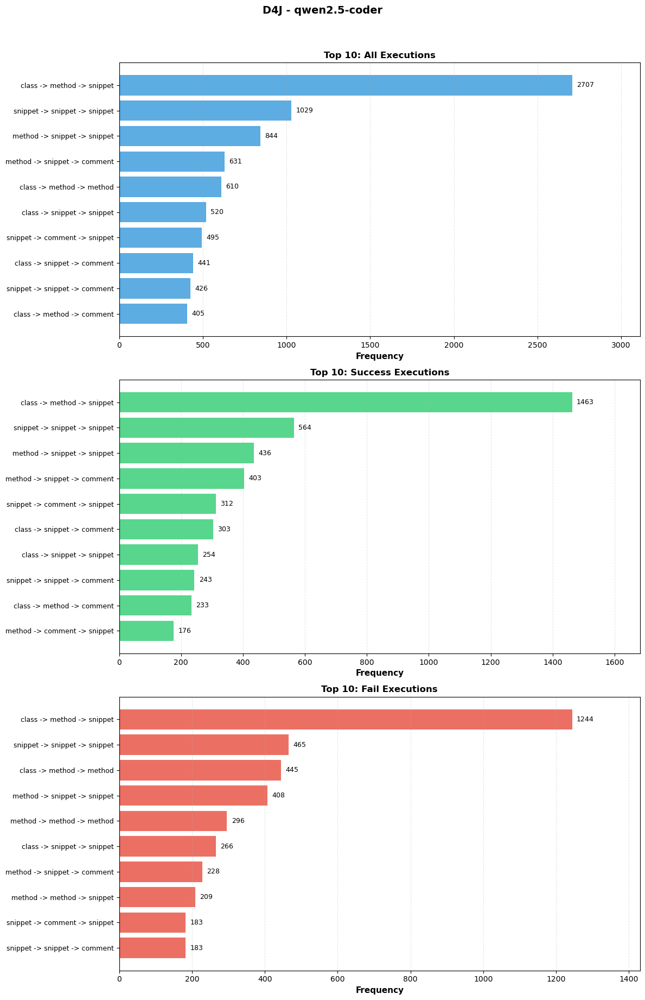


Benchmark: bip | Model: llama3


Total 3-grams collected: 3286

Total 3-grams from successful executions: 1593

Total 3-grams from failed executions: 1693

Benchmark: bip | Model: llama3.1


Total 3-grams collected: 8137

Total 3-grams from successful executions: 3597

Total 3-grams from failed executions: 4540

Benchmark: bip | Model: mistral-nemo


Total 3-grams collected: 3020

Total 3-grams from successful executions: 1384

Total 3-grams from failed executions: 1636

Benchmark: bip | Model: qwen2.5-coder


Total 3-grams collected: 2081

Total 3-grams from successful executions: 995

Total 3-grams from failed executions: 1086


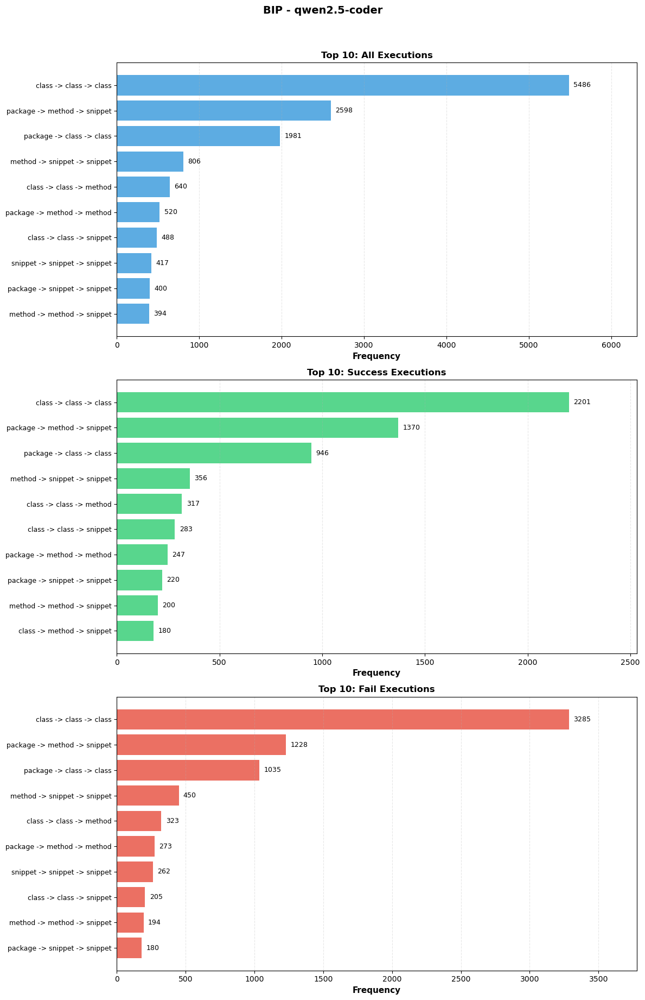

In [23]:
# Visualize Top 10 patterns separately for all/success/fail executions

import matplotlib.pyplot as plt
import numpy as np

# Function name mapping for readability
name_mapping = {
    'get_covered_packages': 'package',
    'get_failing_tests_covered_classes': 'class',
    'get_failing_tests_covered_methods_for_class': 'method',
    'get_code_snippet': 'snippet',
    'get_comments': 'comment'
}

def shorten_pattern(pattern_tuple):
    """Convert long function names to short versions"""
    return ' -> '.join([name_mapping.get(func, func) for func in pattern_tuple])

# For each benchmark and model combination
n=3
benchmarks = ['d4j', 'bip']
models = ['llama3', 'llama3.1', 'mistral-nemo', 'qwen2.5-coder']

for bm in benchmarks:
    all_ngrams, success_ngrams, fail_ngrams = [], [], []
    for model in models:
        print(f"\n{'='*100}")
        print(f"Benchmark: {bm} | Model: {model}")
        print(f"{'='*100}\n")
        
        # Load the three counters
        all_ngrams_from_model, success_ngrams_from_model, fail_ngrams_from_model = get_ngrams_for_executions(bm, model, n)
        
        all_ngrams.extend(all_ngrams_from_model)
        success_ngrams.extend(success_ngrams_from_model)
        fail_ngrams.extend(fail_ngrams_from_model)
        
    all_counter = Counter(all_ngrams)
    success_counter = Counter(success_ngrams)
    fail_counter = Counter(fail_ngrams)
    
    # Get top 10 from each counter
    top_10_all = [(shorten_pattern(pattern), count) for pattern, count in all_counter.most_common(10)]
    top_10_success = [(shorten_pattern(pattern), count) for pattern, count in success_counter.most_common(10)]
    top_10_fail = [(shorten_pattern(pattern), count) for pattern, count in fail_counter.most_common(10)]
    
    # Create 3 subplots
    fig, axes = plt.subplots(3, 1, figsize=(12, 18))
    
    # Plot 1: All Executions
    patterns_all = [p[0] for p in top_10_all]
    counts_all = [p[1] for p in top_10_all]
    
    axes[0].barh(range(len(patterns_all)), counts_all, color='#3498db', alpha=0.8)
    axes[0].set_yticks(range(len(patterns_all)))
    axes[0].set_yticklabels(patterns_all, fontsize=9)
    axes[0].set_xlabel('Frequency', fontsize=11, fontweight='bold')
    axes[0].set_title('Top 10: All Executions', fontsize=12, fontweight='bold')
    axes[0].invert_yaxis()
    axes[0].grid(axis='x', alpha=0.3, linestyle='--')

    axes[0].set_xlim(0, max(counts_all)*1.15)
    
    # Add value labels
    for i, v in enumerate(counts_all):
        axes[0].text(v + max(counts_all)*0.01, i, str(v), va='center', fontsize=9)
    
    # Plot 2: Success Executions
    patterns_success = [p[0] for p in top_10_success]
    counts_success = [p[1] for p in top_10_success]
    
    axes[1].barh(range(len(patterns_success)), counts_success, color='#2ecc71', alpha=0.8)
    axes[1].set_yticks(range(len(patterns_success)))
    axes[1].set_yticklabels(patterns_success, fontsize=9)
    axes[1].set_xlabel('Frequency', fontsize=11, fontweight='bold')
    axes[1].set_title('Top 10: Success Executions', fontsize=12, fontweight='bold')
    axes[1].invert_yaxis()
    axes[1].grid(axis='x', alpha=0.3, linestyle='--')

    axes[1].set_xlim(0, max(counts_success)*1.15)
    
    # Add value labels
    for i, v in enumerate(counts_success):
        axes[1].text(v + max(counts_success)*0.01, i, str(v), va='center', fontsize=9)
    
    # Plot 3: Fail Executions
    patterns_fail = [p[0] for p in top_10_fail]
    counts_fail = [p[1] for p in top_10_fail]
    
    axes[2].barh(range(len(patterns_fail)), counts_fail, color='#e74c3c', alpha=0.8)
    axes[2].set_yticks(range(len(patterns_fail)))
    axes[2].set_yticklabels(patterns_fail, fontsize=9)
    axes[2].set_xlabel('Frequency', fontsize=11, fontweight='bold')
    axes[2].set_title('Top 10: Fail Executions', fontsize=12, fontweight='bold')
    axes[2].invert_yaxis()
    axes[2].grid(axis='x', alpha=0.3, linestyle='--')

    axes[2].set_xlim(0, max(counts_fail)*1.15)
    
    # Add value labels
    for i, v in enumerate(counts_fail):
        axes[2].text(v + max(counts_fail)*0.01, i, str(v), va='center', fontsize=9)
    
    # Overall title
    fig.suptitle(f'{bm.upper()} - {model}', fontsize=14, fontweight='bold', y=1.02)
    
    plt.tight_layout()
    plt.show()

In [24]:
n=3
benchmarks = ['d4j', 'bip']
models = ['llama3', 'llama3.1', 'mistral-nemo', 'qwen2.5-coder']

for bm in benchmarks:
    all_ngrams, success_ngrams, fail_ngrams = [], [], []    
    for model in models:
        print(f"\n{'='*100}")
        print(f"Benchmark: {bm} | Model: {model}")
        print(f"{'='*100}\n")
        
        # Load the three counters
        all_ngrams_from_model, success_ngrams_from_model, fail_ngrams_from_model = get_ngrams_for_executions(bm, model, n)
        
        all_ngrams.extend(all_ngrams_from_model)
        success_ngrams.extend(success_ngrams_from_model)
        fail_ngrams.extend(fail_ngrams_from_model)

    all_counter = Counter(all_ngrams)
    success_counter = Counter(success_ngrams)
    fail_counter = Counter(fail_ngrams)

    top_30_all = [pattern for pattern in all_counter.most_common(30)]
    
    correlation_data = []
    for pattern, freq in top_30_all:
        success_label = []
        ngram_presence = []
        for i in range(1, 11):
            for model in models:
                if bm == 'd4j':
                    directory_path = f'./raw_data/autofl/d4j_autofl_eol_{i}/{model}'
                elif bm == 'bip':
                    directory_path = f'./raw_data/autofl/bip_cosmosfl_{i}/{model}'
                
                for json_file in os.listdir(directory_path):
                    with open(os.path.join(directory_path, json_file), 'r') as f:
                        data = json.load(f)
                    if 'messages' in data:
                        sequence = extract_function_call_sequence(data['messages'])
                        ngrams = get_ngrams(sequence, n)
                        execution_success = get_result_of_execution(data["buggy_methods"])

                        if execution_success:
                            success_label.append(1)
                        else:
                            success_label.append(0)
                        if pattern in ngrams:
                            ngram_presence.append(1)
                        else:
                            ngram_presence.append(0)
        # print(success_label)
        # print(ngram_presence)
        correlation, p_value = pointbiserialr(success_label, ngram_presence)
        correlation_data.append({
            'pattern': pattern,
            'correlation': correlation,
            'p-value': p_value
        })

    correlation_df = pd.DataFrame(correlation_data)
    output_dir = f'./correlation/autofl/{n}-gram/{bm}'
    os.makedirs(output_dir, exist_ok=True)
    correlation_df.to_csv(os.path.join(output_dir, 'correlation.csv'), index=False)
    print(f"Saved {os.path.join(output_dir, 'correlation.csv')}")





Benchmark: d4j | Model: llama3


Total 3-grams collected: 2948

Total 3-grams from successful executions: 1609

Total 3-grams from failed executions: 1339

Benchmark: d4j | Model: llama3.1


Total 3-grams collected: 5521

Total 3-grams from successful executions: 2497

Total 3-grams from failed executions: 3024

Benchmark: d4j | Model: mistral-nemo


Total 3-grams collected: 1751

Total 3-grams from successful executions: 826

Total 3-grams from failed executions: 925

Benchmark: d4j | Model: qwen2.5-coder


Total 3-grams collected: 1893

Total 3-grams from successful executions: 975

Total 3-grams from failed executions: 918
Saved ./correlation/autofl/3-gram/d4j/correlation.csv

Benchmark: bip | Model: llama3


Total 3-grams collected: 3286

Total 3-grams from successful executions: 1593

Total 3-grams from failed executions: 1693

Benchmark: bip | Model: llama3.1


Total 3-grams collected: 8137

Total 3-grams from successful executions: 3597

Total 3-grams from failed executions: 45